**Análise de Dados em Python**


# **Importando as biblioteca e planilha, definindo as funções**

## **Importando as bibliotecas**


In [2]:
# Importando as bibliotecas adicionais
import pandas as pd

pd.DataFrame.iteritems = pd.DataFrame.items


import category_encoders as ce
import matplotlib as mpl
import matplotlib.patches as mpatches
import matplotlib.pyplot as plt
import numpy as np
import researchpy as rp
import seaborn as sns
import statsmodels.api as sm
from scipy import stats
from scipy.cluster import hierarchy
from scipy.stats import chi2_contingency
from sklearn.cluster import AgglomerativeClustering
from sklearn.decomposition import PCA
from sklearn.experimental import enable_iterative_imputer
from sklearn.impute import IterativeImputer
from sklearn.preprocessing import LabelEncoder, OrdinalEncoder, StandardScaler
from statsmodels.formula.api import ols

label_encoder = LabelEncoder()
ordinalEncoder = OrdinalEncoder()
scaler = StandardScaler()

%matplotlib inline
plt.style.use("ggplot")
pd.set_option("display.max_columns", None)

In [3]:
# Outras bibliotecas adicionais
"""
!pip install plot-likert
!pip install factor_analyzer
!pip install kmodes
"""
import textwrap

import dill
import plot_likert
from factor_analyzer import factor_analyzer
from kmodes.kprototypes import KPrototypes

import ipysheet
from ipysheet import sheet, cell


In [4]:
import warnings
warnings.filterwarnings('ignore')

In [5]:
# Usando o comando mágico para usar o R
import os

os.add_dll_directory(r"C:/Program Files/R/R-4.4.2/bin/x64")  # E.g., "C:/Program Files/R/R-4.3.1/bin/x64"


# Set the LD_LIBRARY_PATH
os.environ['LD_LIBRARY_PATH'] = r"C:/Program Files/R/R-4.4.2/library" + os.environ.get('LD_LIBRARY_PATH', '')
#os.environ["R_HOME"] = f"{os.environ['CONDA_PREFIX']}\\Lib\\R"


os.environ["R_HOME"] = r"C:\Program Files\R\R-4.4.2"
os.environ["PATH"] = "C:\Program Files\R\R-4.4.2" + ";" + os.environ["PATH"]

In [6]:
# Usando o comando mágico para usar o R
# !pip install --upgrade rpy2

%load_ext rpy2.ipython

#!pip show rpy2

In [ ]:
%%R #Instalando as bibliotecas para R

install.packages("tidyverse", dependencies = TRUE)
library(tidyverse)

In [8]:
%%R #Instalando as bibliotecas para R

#install.packages(c("psych", 'GGally', 'ggplot2','tibble'))

#library(psych)
#library(tidyverse) #masks stats::filter, lag
library(tibble)
library(GGally) #masks dbplyr::nasa
library(ggplot2)
library(svglite)

Registered S3 method overwritten by 'GGally':
  method from   
  +.gg   ggplot2


## **Definindo as funções**

In [9]:
# Criando text wrap


def wrap_xlabels(ax, width, break_long_words=False, rotation=0):
    labels = []
    for label in ax.get_xticklabels():
        text = label.get_text()
        labels.append(
            textwrap.fill(text, width=width, break_long_words=break_long_words)
        )
    ax.set_xticklabels(labels, rotation=rotation)


def wrap_ylabels(ax, width, break_long_words=False, rotation=0):
    labels = []
    for label in ax.get_yticklabels():
        text = label.get_text()
        labels.append(
            textwrap.fill(text, width=width, break_long_words=break_long_words)
        )
    ax.set_yticklabels(labels, rotation=rotation)

In [10]:
# Criando label pct para gráfico de pizza


def pct_label(pct, todos_valores):
    absoluto = int(np.round(pct / 100.0 * np.sum(todos_valores)))
    return f"{pct:.1f}% ({absoluto:d})"

In [11]:
# Função para decodificar os valores
def decodificar_valores_nominal(dataframe, variaveis, label_encoders):
    # Criamos uma cópia para não modificar o original
    df_decodificado = dataframe.copy()

    for coluna in variaveis:
        if coluna in label_encoders:
            try:
                print(
                    f"Valores únicos na coluna {coluna}: {df_decodificado[coluna].unique()}"
                )
                print(
                    f"Classes conhecidas pelo encoder: {label_encoders[coluna].classes_}"
                )
                # Verificamos se há valores nulos antes da transformação
                mascara_nulos = df_decodificado[coluna].isna()

                # Aplicamos a transformação apenas em valores não nulos
                valores_validos = df_decodificado[coluna][~mascara_nulos]

                # Garantimos que os valores são inteiros válidos
                valores_validos = valores_validos.astype(float).astype(int)

                # Decodificamos apenas os valores válidos
                valores_decodificados = label_encoders[coluna].inverse_transform(
                    valores_validos
                )

                # Atualizamos apenas os valores não nulos no dataframe
                df_decodificado.loc[~mascara_nulos, coluna] = valores_decodificados

                # Opcional: preencher valores nulos com um valor padrão
                # df_decodificado[coluna] = df_decodificado[coluna].fillna('Não classificado')

            except Exception as e:
                print(f"Erro ao processar a coluna {coluna}: {str(e)}")
                # Mantém os valores originais em caso de erro
                continue

    return df_decodificado

In [12]:
# Carregando as informações salvas
'''with open('informacoes_encoding_ordinal.pkl', 'rb') as arquivo:
    informacoes_encoding = pickle.load(arquivo)
'''
# Função para visualizar o mapeamento de uma variável
def mostrar_mapeamento(nome_variavel):
    if nome_variavel in informacoes_encoding['mapeamento']:
        print(f"\nMapeamento para {nome_variavel}:")
        print("\nValores originais -> Valores codificados:")
        for original, codificado in informacoes_encoding['mapeamento'][nome_variavel]['categorias_para_numeros'].items():
            print(f"{original}: {codificado}")
    else:
        print(f"Variável {nome_variavel} não encontrada no mapeamento")

def decodificar_valores_ordinal(df, variaveis, ordinal_encoder):
    """
    Decodifica valores codificados pelo OrdinalEncoder de volta para suas categorias originais.
    
    Parâmetros:
        df: DataFrame com as variáveis codificadas
        variaveis: Lista de nomes das variáveis a serem decodificadas
        ordinal_encoder: Instância do OrdinalEncoder já treinada
    
    Retorna:
        DataFrame com as variáveis decodificadas
    """
    # Criamos uma cópia do DataFrame para não modificar o original
    df_decodificado = df.copy()
    
    # Para cada variável que queremos decodificar
    for idx, coluna in enumerate(variaveis):
        try:
            # Criamos o mapeamento usando as categorias do encoder
            # O enumerate começa do 0, então cada número corresponde à posição
            # da categoria na lista de categorias do encoder
            mapeamento = dict(enumerate(ordinal_encoder.categories_[idx]))
            
            # Aplicamos o mapeamento para converter os números de volta às categorias
            df_decodificado[coluna] = df_decodificado[coluna].map(mapeamento)
            
            # Verificamos se houve algum valor que não conseguimos mapear
            valores_nulos = df_decodificado[coluna].isna().sum()
            if valores_nulos > 0:
                print(f"Atenção: {valores_nulos} valores não puderam ser decodificados na coluna {coluna}")
                
        except Exception as e:
            print(f"Erro ao decodificar a coluna {coluna}: {str(e)}")
            print(f"Valores únicos na coluna: {df_decodificado[coluna].unique()}")
            continue
            
    return df_decodificado

In [13]:
# Definindo os intervalos de Idade


def categorizar_idade(Idade, numero=False):
    if numero == False:
        if 18 <= Idade <= 22:
            return "Entre 18 e 22 anos"
        if 23 <= Idade <= 27:
            return "Entre 23 e 27 anos"
        if 28 <= Idade <= 37:
            return "Entre 27 anos e 37 anos"
        if Idade >= 37:
            return "Mais de 38 anos"

    else:
        if 18 <= Idade <= 22:
            return 0
        if 23 <= Idade <= 27:
            return 1
        if 28 <= Idade <= 37:
            return 2
        if Idade >= 37:
            return 3


definir_idade_categorica = [
    "Entre 18 e 22 anos",
    "Entre 23 e 27 anos",
    "Entre 27 anos e 37 anos",
    "Mais de 38 anos",
]

definir_idade_categorica_num = [0, 1, 2, 3]

In [14]:
# Defining a function to perform the Chi-Square Test and interpret results
def perform_chi_square_test(data, col1, col2):
    # Creating a contingency table
    contingency_table = pd.crosstab(data[col1], data[col2])

    # Performing the Chi-Square Test
    chi2, p, dof, expected = chi2_contingency(contingency_table)

    # Interpreting the result
    significant = p < 0.05  # 5% significance level
    #    print(f"chi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
    return chi2, p, significant

In [15]:
import matplotlib.pyplot as plt
import pandas as pd
import plot_likert


def plot_likert_divergente(
    dataset_likert,
    title,
    bar_labels_color=None,
    compute_percentages=True,
    figsize=(15, 20),
    min_pct=5,
):
    """
    Plota gráfico de Likert com barras centralizadas e labels condicionais baseadas na porcentagem.

    Parameters:
    -----------
    dataset_likert : pandas.DataFrame
        DataFrame contendo os dados da escala Likert
    title : str
        Título do gráfico
    bar_labels_color : list
        Lista de cores para as labels das barras
    compute_percentages : bool
        Se True, mostra valores em porcentagem
    figsize : tuple
        Tamanho da figura (largura, altura)
    min_pct : float
        Porcentagem mínima para mostrar a label (default: 5)
    """
    # Configurações padrão de cores
    if bar_labels_color is None:
        bar_labels_color = ["snow", "white", "xkcd:charcoal grey", "navy", "skyblue"]

    # Configurações da escala
    scale_likert = [
        "1 - Discordo totalmente",
        "2 - Discordo",
        "3 - Neutro",
        "4 - Concordo",
        "5 - Concordo totalmente",
    ]

    format_scale_likert = ["0"] + scale_likert

    # Limpeza e preparação dos dados
    dataset_clean = dataset_likert.copy()
    dataset_clean = dataset_clean.fillna("0")
    dataset_clean = dataset_clean.astype(str)

    # Criando o gráfico base com centralização
    axes = plot_likert.plot_likert(
        dataset_clean,
        plot_scale=format_scale_likert,
        plot_percentage=True,
        bar_labels=False,
        bar_labels_color=bar_labels_color,
        colors=plot_likert.colors.default_with_darker_neutral,
        label_max_width=50,
        figsize=figsize,
        drop_zeros=True,
        format_scale=format_scale_likert,
    )

    # Adicionando uma linha central para referência
    axes.axvline(0, color="gray", linestyle="--", linewidth=0.8)

    # Processando cada conjunto de barras
    for i, container in enumerate(
        axes.containers[1:]
    ):  # Ignorando o primeiro container (padding)
        # Obtendo os valores percentuais das barras
        percentages = [abs(patch.get_width()) for patch in container]

        # Criando labels condicionais
        labels = []
        for pct in percentages:
            if pct >= min_pct:
                if compute_percentages:
                    labels.append(f"{pct:.2f}%")
                else:
                    labels.append(f"{pct:.2f}")
            else:
                labels.append("")

        # Aplicando as labels
        if i < len(bar_labels_color):  # Verificando se há cor disponível
            axes.bar_label(
                container,
                labels=labels,
                label_type="center",
                padding=0,
                color=bar_labels_color[i],
                weight="bold",
            )

    # Configurações finais do gráfico
    axes.set_axisbelow(True)
    axes.grid(color="gray", linestyle="dashed")
    plt.yticks(fontsize=12)
    plt.title(title)

    return axes


def prepare_data(df, var_escala_likert_lista):
    """
    Prepara os dados para o gráfico de Likert

    Parameters:
    -----------
    df : pandas.DataFrame
        DataFrame original
    var_escala_likert_lista : list
        Lista de colunas com as variáveis da escala Likert
    """
    df_clean = df[var_escala_likert_lista].copy()
    df_clean = df_clean.fillna("0")
    df_clean = df_clean.astype(str)
    return df_clean

In [16]:
def plot_heatmap_corr(dataset, title, corr_method="spearman", figsize=(40, 40)):
    dataset = dataset.corr(method=corr_method)
    # mask = np.triu(np.ones_like(dataset, dtype=bool))

    # Exibindo a correlação
    # display(form1_likert_corr)
    heat_fig, heat_ax = plt.subplots(figsize=figsize)
    sns.heatmap(
        dataset,
        # mask = mask,
        annot=True,
        fmt=".2f",
        cmap="vlag",
        vmax=1,
        vmin=-1,
    )

    heat_ax.xaxis.tick_bottom()
    heat_ax.set_facecolor("white")

    wrap_ylabels(heat_ax, width=15, rotation=0)

    wrap_xlabels(heat_ax, width=15, rotation=90)

    plt.yticks(fontsize=12)
    plt.xticks(fontsize=12)
    plt.title(title)

    """
    plt.savefig( f'{path_img}Visualização de Heatmap de Correlação - {title} - {version}{extensão}',
                bbox_inches='tight', dpi =150)
    """


# plt.show()

In [17]:
def diagnosticar_tipos_dados(df, colunas):
    """
    Função para fazer um diagnóstico detalhado dos tipos de dados em um DataFrame

    Args:
        df: DataFrame pandas
        colunas: Lista de colunas para analisar
    """
    resultados = {}

    for col in colunas:
        # Inicializa dicionário para esta coluna
        resultados[col] = {
            "tipos_unicos": set(),
            "valores_problematicos": [],
            "indices_problematicos": [],
            "total_registros": len(df[col]),
            "total_nao_string": 0,
        }

        # Analisa cada valor na coluna
        for idx, valor in df[col].items():
            tipo_valor = type(valor)
            resultados[col]["tipos_unicos"].add(tipo_valor)

            # Se não for string, registra o problema
            if not isinstance(valor, str):
                resultados[col]["total_nao_string"] += 1
                resultados[col]["valores_problematicos"].append(valor)
                resultados[col]["indices_problematicos"].append(idx)

    # Exibe resultados
    print("\n=== DIAGNÓSTICO DETALHADO ===")
    for col, info in resultados.items():
        if len(info["tipos_unicos"]) > 1 or str not in info["tipos_unicos"]:
            print(f"\nColuna: {col}")
            print(f"Tipos encontrados: {[t.__name__ for t in info['tipos_unicos']]}")
            print(
                f"Total de registros não-string: {info['total_nao_string']} de {info['total_registros']}"
            )
            print("Exemplos de valores problemáticos:")
            for idx, val in zip(
                info["indices_problematicos"][:5], info["valores_problematicos"][:5]
            ):
                print(f"  Índice {idx}: {val} (tipo: {type(val).__name__})")

    return resultados


# Função para corrigir os problemas
def corrigir_tipos(df, colunas):
    """
    Função para corrigir tipos de dados, convertendo tudo para string

    Args:
        df: DataFrame pandas
        colunas: Lista de colunas para corrigir
    """
    df_corrigido = df.copy()

    for col in colunas:
        # Converte para string, tratando NaN/None
        df_corrigido[col] = df_corrigido[col].apply(
            lambda x: str(x) if pd.notnull(x) else None
        )

    return df_corrigido

## **Importando a planilha**

In [ ]:
# Importando a planilha

arquivo_excel = '2024-10-21 - Amanda Ayumi Mikami - Questionário V.1.1.1 (respostas) - ofuscado.xlsx'

# Leitura da planilha do Excel
df = pd.read_excel(arquivo_excel, sheet_name='Dados Limpos')


# **Visualizando a Base de Dados e fazer Limpeza de Dados**

In [19]:
# Visualizando a base de dados e seus dados
df.describe()

,Idade (Por favor coloque só em número),Em média quantas horas você trabalha por semana? (Por favor coloque só em número)
count,266.000000,258.000000
mean,25.353383,32.953488
std,7.331190,22.671863
min,18.000000,0.000000
25%,21.000000,20.000000
50%,23.000000,30.000000
75%,27.000000,44.000000
max,65.000000,220.000000


In [20]:
# Removendo os espaços brancos no ínicio ou final das colunas

df = df.rename(columns=lambda x: x.strip())

In [21]:
# Verificando os tipos da nossa base de dados
df.dtypes  # Foi observado que todas as colunas era do tipo object, o que torna necessário mudar

Concordância de TCLE                                                                                                                                                                                                                                                object
Você faz curso de graduação em Administração no momento?                                                                                                                                                                                                            object
Qual a sua situação profissional atual?                                                                                                                                                                                                                             object
Tipo de Instituição de Ensino Superior                                                                                                                                                                 

In [22]:
# Substituindo os valores em branco em nulos
df = df.replace(r"^\s*$", np.nan, regex=True)

# Trocando para número integro ou float
df["Idade (Por favor coloque só em número)"] = pd.to_numeric(
    df["Idade (Por favor coloque só em número)"], errors="coerce"
)
df[
    "Em média quantas horas você trabalha por semana? (Por favor coloque só em número)"
] = pd.to_numeric(
    df[
        "Em média quantas horas você trabalha por semana? (Por favor coloque só em número)"
    ],
    errors="coerce",
)


In [ ]:
# Definindo as condições para a eliminação das linhas
df = df[
    ~(df["Concordância de TCLE"] != "Concordo e confirmo que tenho 18 anos ou mais")
    & ~(df["Você faz curso de graduação em Administração no momento?"] != "Sim")
    & ~(
        df["Qual a sua situação profissional atual?"]
        == "Não estou trabalhando no momento"
    )
    & ~(df["Idade (Por favor coloque só em número)"] < 18)
]

# Removendo as colunas desnecessárias
df = df.drop(
    [
        "Concordância de TCLE",
        "Você faz curso de graduação em Administração no momento?",
    ],
    axis=1,
)


df = df.reset_index(drop=True)

df

In [24]:
columns_escala_likert = {
    "Qual a sua situação profissional atual?": "situacao_profissional",
    "Tipo de Instituição de Ensino Superior": "tipo_IES",
    "Qual é a sua instituição de ensino superior?": "IES",
    "Ano de Ingresso": "ano_ingresso",
    "Forma de Ingresso": "forma_ingresso",
    "Estado Civil":"estado_civil",
    "Cor/Etnia":"Cor_Etnia",
    "Modalidade do seu curso": "modalidade_curso",
    "Idade (Por favor coloque só em número)": "Idade",
    "Renda total mensal da sua família": "renda_familiar",
    "Em média quantas horas você trabalha por semana? (Por favor coloque só em número)": "horas_trabalho",
    "Qual o seu tempo total de experiência profissional?": "exp_profissional",
    "De que forma você exerce a sua atividade profissional?": "forma_atividade",
    "Qual o seu tempo total de deslocamento diário médio?": "tempo_deslocamento",
    "Quantas horas por semana, aproximadamente, você dedica aos estudos, sem contar as horas de aula?": "horas_estudo",
    "Estou satisfeito com o tempo que tenho para estudar.": "satisfacao_tempo_estudo",
    "A minha atividade profissional interfere no meu estudo.": "trabalho_interfere_estudo",
    "Costumo escolher conscientemente quais demandas atender ou recusar relacionadas ao trabalho, casa e estudo para respeitar os meus limites ou priorizar as atividades que considero mais importantes.": "escolhe_demandas",
    "Costumo sincronizar minhas tarefas, realizando simultaneamente atividades relacionadas aos estudos ou trabalho e atividades domésticas, para economizar tempo e gerenciar melhor minhas demandas.": "sincronizar_tarefas",
    "Negocio a flexibilidade no cumprimento de obrigações para ter mais tempo em outros âmbitos.": "negociacao_flexibilidade",
    "Mantenho barreiras físicas em casa para separar as atividades de trabalho e estudo das atividades domésticas, como ter um espaço privado para estudar ou trabalhar.": "manter_barreiras_fisicas",
    "Aproveito momentos e espaços neutros, como os meios de transporte, horário de almoço no trabalho ou na universidade, para resolver demandas relacionadas aos estudos, trabalho ou casa, mesmo que não esteja fisicamente no domínio correspondente.": "momentos_espacos_neutros",
    "Reservo um tempo específico para mim mesmo, dedicando-me a atividades pessoais, como exercícios físicos, hobbies, cuidar da alimentação, lazer, para manter meu bem-estar físico e mental, mantendo um equilíbrio entre as demandas de trabalho, estudo e casa.": "reservar_tempo_si_mesmo",
    "Costumo contar com o apoio de familiares, como cônjuge, pais ou outros, para gerenciar as demandas entre trabalho, estudo e casa.": "apoio_familiares",
    "Busco apoio institucional, como Núcleo de Apoio ao Estudante, para lidar com os desafios de conciliar trabalho, estudo e vida pessoal.": "apoio_institucional",
    "Estabeleço as minhas metas de forma clara, objetiva e quantificável, classificando-as em curto prazo, médio prazo e longo prazo.": "metas_claras_prazos",
    "Faço planejamento com frequência das tarefas que preciso fazer, levando em consideração o tempo para descanso e lazer.": "planejamento_frequente",
    "Quando organizo o tempo para cada tarefa, consigo estabelecer minhas prioridades de acordo com meus objetivos, a importância e urgência.": "prioridade_importante_urgente",
    "Sei determinar, os horários adequados e tempo necessário para cada tarefa.": "determinar_horário_tempo_tarefas",
    "Organizo meu tempo com eficiência na vida cotidiana.": "organizar_tempo",
    "Consigo identificar e corrigir os problemas que atrapalham a realização das tarefas dentro do tempo planejado, fazendo ajustes necessários no meu planejamento.": "identificar_problemas_ajuste_planejamento",
    "Consigo conciliar, as atividades profissionais, atividades acadêmicas, afazeres domésticos, lazer, entre outros.": "conciliar_dominio_vida",
    "Delego tarefas acadêmicas, profissionais e domésticas para outras pessoas quando não são prioritárias ou não estão sob minha responsabilidade.": "delegar_tarefas",
    "Sei utilizar, com eficiência, ferramentas e tecnologias como agenda e aplicativos de gerenciamento de tempo e os outros recursos que podem me auxiliar no planejamento do tempo de que preciso para fazer.": "utilizar_ferramentas",
    "Organizo o meu tempo de estudo.": "organizar_tempo_estudo",
    "Ao planejar meu tempo de estudo, levo em consideração minhas metas, a demanda, a dificuldade e a relevância de cada matéria, priorizando aquelas que exigem maior atenção.": "planejamento_estudo",
    "Sei considerar, no planejamento do tempo para estudar, gastos ocasionais de tempo como, por exemplo, momentos para beber água, usar o celular, entre outros, bem como levando em consideração as condições de que disponho.": "considerar_gastos_tempo_estudo",
    "Elaboro um cronograma de estudo, definindo os horários nos quais vou estudar cada disciplina que estou cursando.": "elaborar_cronograma_estudo",
    "Consigo escolher o local adequado, casa, biblioteca, entre outros, para realizar meus estudos em função do tempo de que disponho.": "escolhe_local_estudo",
    "Consigo identificar e eliminar as principais distrações durante o estudo, como rede social ou celular.": "identifica_distracoes",
    "Utilizo técnicas com eficácia, como a Pomodoro, para manter o foco durante o estudo, minimizar as distrações externas e também para dividir as sessões em blocos de tempo gerenciáveis, alternado entre períodos de estudos e pausas para descansos.": "utiliza_tecnicas_pomodoro",
    "Utilizo métodos de priorização com eficácia, como a Matriz de Eisenhower, para estabelecer quais disciplinas devo estudar primeiro com base em sua importância e urgência.": "utiliza_matriz_eisenhower",
    "Utilizo técnicas de memorização e/ou revisão espaçada com eficácia, como a elaboração de resumos e mapas mentais, e a utilização de flashcards, para otimizar o tempo de estudo e reter informações a longo prazo, dedicando tempo regularmente para revisar o": "utiliza_tecnicas_memorizacao",
    "Quais as suas principais dificuldades que você enfrenta ao lidar com atividades acadêmicas e profissionais simultaneamente?": "dificuldades_academicas_profissionais",
    "Quais são as suas estratégias e ferramentas de planejamento, organização e gestão de tempo você utiliza para superar essas dificuldades?": "estrategias_gestao_tempo",
    "Quais as técnicas que você utiliza para lidar com as distrações durante o estudo?": "tecnicas_distracoes_estudo",
}

# Renomeando as colunas para facilitar a leitura
df = df.rename(columns=columns_escala_likert)
df.columns

Index(['situacao_profissional', 'tipo_IES', 'ano_ingresso', 'Turno',
       'modalidade_curso', 'forma_ingresso', 'Idade', 'Gênero',
       'renda_familiar', 'estado_civil', 'Cor_Etnia', 'horas_trabalho',
       'exp_profissional', 'forma_atividade', 'tempo_deslocamento',
       'horas_estudo', 'satisfacao_tempo_estudo', 'trabalho_interfere_estudo',
       'escolhe_demandas', 'sincronizar_tarefas', 'negociacao_flexibilidade',
       'manter_barreiras_fisicas', 'momentos_espacos_neutros',
       'reservar_tempo_si_mesmo', 'apoio_familiares', 'apoio_institucional',
       'metas_claras_prazos', 'planejamento_frequente',
       'prioridade_importante_urgente', 'determinar_horário_tempo_tarefas',
       'organizar_tempo', 'identificar_problemas_ajuste_planejamento',
       'conciliar_dominio_vida', 'delegar_tarefas', 'utilizar_ferramentas',
       'organizar_tempo_estudo', 'planejamento_estudo',
       'considerar_gastos_tempo_estudo', 'elaborar_cronograma_estudo',
       'escolhe_local_es

In [25]:
# Transformando em variáveis categóricas nominais
var_nominal = [
    "situacao_profissional",
    "tipo_IES",
    "Turno",
    "modalidade_curso",
    "forma_ingresso",
    "Gênero",
    "estado_civil",
    "Cor_Etnia",
    "forma_atividade",
]

df[var_nominal] = df[var_nominal].astype("category")

In [26]:
# Transformando em variáveis categóricas ordinais

# Definindo a ordem das categorias
var_categorica_dict = {
    "ano_ingresso": ["Antes de 2019", "2019/2020", "2021/2022", "2023/2024"],
    "renda_familiar": [
        "Até 1.412,00",
        "Entre 1.412,00 e 2.824,00",
        "Entre 2.824,00 a 5.648,00",
        "Entre 5.648,00 a 14.120,00",
        "Entre 14.120,00 a 28.240,00",
        "Mais de 28.240,00",
    ],
    "exp_profissional": [
        "Menos de 6 meses",
        "6 meses a 1 ano",
        "1 ano a 2 anos",
        "Mais de 2 anos",
    ],
    "tempo_deslocamento": [
        "Menos de 1 horas",
        "Entre 1 a 2 horas",
        "Entre 2 a 4 horas",
        "Entre 4 a 6 horas",
        "Mais de 6 horas",
    ],
    "horas_estudo": ["0 a 4", "5 a 10", "10 a 20", "Mais de 20"],
}

var_escala_likert_lista = [
    "satisfacao_tempo_estudo",
    "trabalho_interfere_estudo",
    "escolhe_demandas",
    "sincronizar_tarefas",
    "negociacao_flexibilidade",
    "manter_barreiras_fisicas",
    "momentos_espacos_neutros",
    "reservar_tempo_si_mesmo",
    "apoio_familiares",
    "apoio_institucional",
    "metas_claras_prazos",
    "planejamento_frequente",
    "prioridade_importante_urgente",
    "determinar_horário_tempo_tarefas",
    "organizar_tempo",
    "identificar_problemas_ajuste_planejamento",
    "conciliar_dominio_vida",
    "delegar_tarefas",
    "utilizar_ferramentas",
    "organizar_tempo_estudo",
    "planejamento_estudo",
    "considerar_gastos_tempo_estudo",
    "elaborar_cronograma_estudo",
    "escolhe_local_estudo",
    "identifica_distracoes",
    "utiliza_tecnicas_pomodoro",
    "utiliza_matriz_eisenhower",
    "utiliza_tecnicas_memorizacao",
]

# Codificando primeiro os valores da escala likert
likert_escala_dict = {
    np.nan: "0",
    "1 - Discordo totalmente": "1",
    "2 - Discordo": "2",
    "3 - Neutro": "3",
    "4 - Concordo": "4",
    "5 - Concordo totalmente": "5",
}


# Mapeando os valores correspondentes
df[var_escala_likert_lista] = df[var_escala_likert_lista].replace(likert_escala_dict)

var_escala_likert_dict = {
    questao: ["0", "1", "2", "3", "4", "5"] for questao in var_escala_likert_lista
}


# Mapeando os dicionários a estas variáveis
for col, categorias in var_categorica_dict.items():
    df[col] = pd.Categorical(df[col], categories=categorias, ordered=True)

for questao, escala in var_escala_likert_dict.items():
    if questao in df.columns:
        df[questao] = pd.Categorical(df[questao], categories=escala, ordered=True)

In [27]:
# Redefinindo a variável var_escala_likert_lista com base no dicionário columns_escala_likert
for var in var_escala_likert_lista:
    if var in columns_escala_likert.keys():
        # Substitui a variável encontrada pelo valor correspondente no dicionário
        var_escala_likert_lista[var_escala_likert_lista.index(var)] = (
            columns_escala_likert[var]
        )

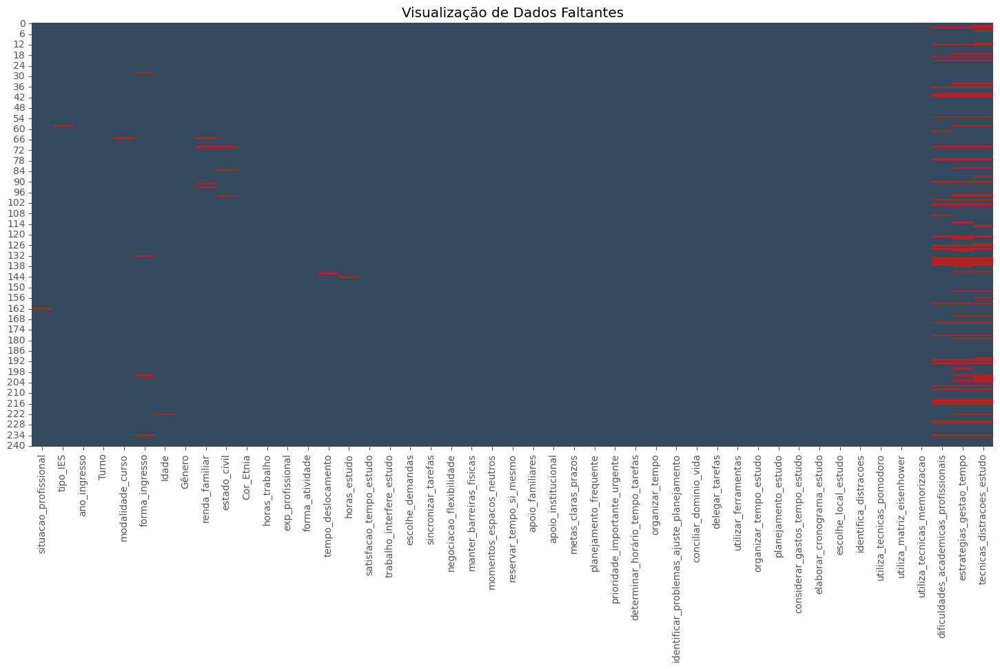

In [28]:
# Verificando se há valores nulos

## Plotando o gráfico de dados faltantes
plt.figure(figsize=(18, 8))
colours = ["#34495E", "firebrick"]
plt.title("Visualização de Dados Faltantes")
sns.heatmap(df.isnull(), cmap=sns.color_palette(colours), cbar=False)
plt.show()

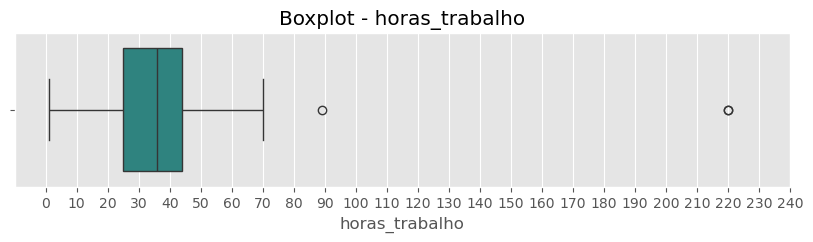

In [29]:
# Fazendo os boxplots de Horas de Trabalho para verificar se há valor atípico
fig, ax = plt.subplots(figsize=(10, 2))
sns.boxplot(x=df["horas_trabalho"], palette="viridis").set_title(
    "Boxplot - horas_trabalho"
)

plt.xticks(ticks=np.arange(0, 250, 10))

plt.show()

In [ ]:
# Verificando os valores atípicos de Horas de trabalho

z_scores_horas_trabalho = stats.zscore(df.horas_trabalho, nan_policy="omit")

df[np.abs(z_scores_horas_trabalho) > 3]

In [31]:
# Tratamento dos valores atípicos de Horas de trabalho (Trocar o valor por valor nulo)
df["horas_trabalho"] = np.where(
    df["horas_trabalho"] > 168, np.nan, df["horas_trabalho"]
)



"\n# Substituir valores nulos pela mediana\nmedian_value = df['horas_trabalho'].median()\ndf['horas_trabalho'] = df['horas_trabalho'].fillna(median_value)\n"

## Codificação e Imputação

### Codificação das variáveis

In [32]:
# Fazer a Codificação das variáveis

# Criando a lista de variáveis nominais a serem utilizados para dummy (ordem não importa)
var_categorica_nominal_lista = [
    "situacao_profissional",
    "Turno",
    "modalidade_curso",
    "forma_ingresso",
    "Gênero",
    "estado_civil",
    "Cor_Etnia",
    "forma_atividade",
    "tipo_IES",
]

# Criando uma lista das variáveis ordinais a serem aplicados com o ordinal encoding (ordem importa)

var_categorica_ordinal_lista = [
    "ano_ingresso",
    "Idade_Codificada",
    "renda_familiar",
    "exp_profissional",
    "tempo_deslocamento",
    "horas_estudo",
]


# Atribuindo tipo categórica ordinal para as variáveis categóricas ordinais ordenado
var_categorica_ordinal_lista_dict = {
    "Idade_Codificada": np.arange(0, 3 + 1, 1),
    "ano_ingresso": np.arange(0, 3 + 1, 1),
    "renda_familiar": np.arange(0, 5 + 1, 1),
    "exp_profissional": np.arange(0, 3 + 1, 1),
    "tempo_deslocamento": np.arange(0, 4 + 1, 1),
    "horas_estudo": np.arange(0, 3 + 1, 1),
}

# Dicionário de codificação/decodificação completo
var_categorica_dict_codificado = {
    "ano_ingresso": {
        "Antes de 2019": 0,
        "2019/2020": 1,
        "2021/2022": 2,
        "2023/2024": 3,
    },
    "renda_familiar": {
        "Até 1.412,00": 0,
        "Entre 1.412,00 e 2.824,00": 1,
        "Entre 2.824,00 a 5.648,00": 2,
        "Entre 5.648,00 a 14.120,00": 3,
        "Entre 14.120,00 a 28.240,00": 4,
        "Mais de 28.240,00": 5,
    },
    "exp_profissional": {
        "Menos de 6 meses": 0,
        "6 meses a 1 ano": 1,
        "1 ano a 2 anos": 2,
        "Mais de 2 anos": 3,
    },
    "tempo_deslocamento": {
        "Menos de 1 horas": 0,
        "Entre 1 a 2 horas": 1,
        "Entre 2 a 4 horas": 2,
        "Entre 4 a 6 horas": 3,
        "Mais de 6 horas": 4,
    },
    "horas_estudo": {"0 a 4": 0, "5 a 10": 1, "10 a 20": 2, "Mais de 20": 3},
    "Idade_Codificada": {
        "Entre 18 e 22 anos": 0,
        "Entre 23 e 27 anos": 1,
        "Entre 27 anos e 37 anos": 2,
        "Mais de 38 anos": 3,
    },
}

In [33]:
# Fazer a codificação da variável Idade (Categorização)

# Aplicando a codificação de Idade na DF
df["Idade_Codificada"] = df["Idade"].apply(categorizar_idade)

# Transformando em Categórica Ordinal

df["Idade_Codificada"] = pd.Categorical(
    df["Idade_Codificada"], categories=definir_idade_categorica, ordered=True
)
# Reordenando o DF
df = df[
    [
        "situacao_profissional",
        "tipo_IES",
        "ano_ingresso",
        "Turno",
        "modalidade_curso",
        "forma_ingresso",
        "Idade",
        "Idade_Codificada",
        "Gênero",
        "renda_familiar",
        "estado_civil",
        "Cor_Etnia",
        "horas_trabalho",
        "exp_profissional",
        "forma_atividade",
        "tempo_deslocamento",
        "horas_estudo",
        "satisfacao_tempo_estudo",
        "trabalho_interfere_estudo",
        "escolhe_demandas",
        "sincronizar_tarefas",
        "negociacao_flexibilidade",
        "manter_barreiras_fisicas",
        "momentos_espacos_neutros",
        "reservar_tempo_si_mesmo",
        "apoio_familiares",
        "apoio_institucional",
        "metas_claras_prazos",
        "planejamento_frequente",
        "prioridade_importante_urgente",
        "determinar_horário_tempo_tarefas",
        "organizar_tempo",
        "identificar_problemas_ajuste_planejamento",
        "conciliar_dominio_vida",
        "delegar_tarefas",
        "utilizar_ferramentas",
        "organizar_tempo_estudo",
        "planejamento_estudo",
        "considerar_gastos_tempo_estudo",
        "elaborar_cronograma_estudo",
        "escolhe_local_estudo",
        "identifica_distracoes",
        "utiliza_tecnicas_pomodoro",
        "utiliza_matriz_eisenhower",
        "utiliza_tecnicas_memorizacao",
        "dificuldades_academicas_profissionais",
        "estrategias_gestao_tempo",
        "tecnicas_distracoes_estudo",
    ]
]

In [34]:
# Tirando as colunas não relevantes
df_encoded = df.drop(
    [
        "dificuldades_academicas_profissionais",
        "estrategias_gestao_tempo",
        "tecnicas_distracoes_estudo",
    ],
    axis=1,
)

In [35]:
ordinalEncoder = []
categorias_var_ordinal = []

for coluna in var_categorica_dict_codificado:
    items = var_categorica_dict_codificado.get(coluna)
    lista = list(items.keys())
    categorias_var_ordinal.append(lista)

In [36]:
# Trocando todos os "0" em np.nan
df_encoded[var_escala_likert_lista] = df_encoded[var_escala_likert_lista].replace(
    "0", np.nan
)

# Encodificando as variáveis categóricas ordinais
# Criamos o encoder informando as categorias em ordem
ordinalEncoder = OrdinalEncoder(
    #categories= categorias_var_ordinal,
    handle_unknown='use_encoded_value',
    unknown_value= -1
)



In [37]:
# Fazemos o fit_transform e guardamos o resultado
# Criando um df sem NA
df_encoded_sem_NA = df_encoded.dropna()

# Fazendo um Fit
ordinalEncoder.fit(df_encoded_sem_NA[var_categorica_ordinal_lista])

df_encoded[var_categorica_ordinal_lista] = ordinalEncoder.transform(
    df_encoded[var_categorica_ordinal_lista]
)



In [38]:
# Agora vamos criar uma estrutura para armazenar todas as informações importantes
informacoes_encoding = {
    'encoder': ordinalEncoder,
    'variaveis': var_categorica_ordinal_lista,
    'categorias': categorias_var_ordinal,
    'mapeamento': {}
}

# Criamos um mapeamento detalhado valor original -> valor codificado para cada variável
for i, coluna in enumerate(var_categorica_ordinal_lista):
    mapeamento_coluna = dict(enumerate(ordinalEncoder.categories_[i]))
    mapeamento_reverso = {v: k for k, v in mapeamento_coluna.items()}
    informacoes_encoding['mapeamento'][coluna] = {
        'categorias_para_numeros': mapeamento_reverso,
        'numeros_para_categorias': mapeamento_coluna
    }

In [39]:
# Revertendo os valores nulos para sua forma original (-1 para np.nan)
df_encoded[var_categorica_ordinal_lista] = df_encoded[var_categorica_ordinal_lista].replace(
    -1, np.nan
)


In [40]:
# Fazer label encoding das variáveis nominais (tornar em 0,1,2,3,4 e assim por diante)
label_encoders = {}
for column in var_categorica_nominal_lista:
    le = LabelEncoder()
    series = df_encoded[column]
    df_encoded[column] = pd.Series(
        le.fit_transform(series[series.notnull()]), index=series[series.notnull()].index
    )
    label_encoders[column] = (
        le  # Armazena o codificador para decodificar após imputação
    )

### Imputação

In [41]:
# Fazendo a imputação iterativa


# Função para monitorar a convergência do IterativeImputer
def monitor_convergence(data, max_iter=10, tol=1e-3, random_state=42, verbose=True):
    """
    Monitor the convergence of IterativeImputer by tracking changes between iterations.
    
    Parameters:
    -----------
    data : pandas.DataFrame
        Input data with missing values
    max_iter : int
        Maximum number of iterations
    tol : float
        Convergence tolerance
    random_state : int
        Random seed for reproducibility
    verbose : bool
        Whether to print convergence information
        
    Returns:
    --------
    tuple
        (imputed_dataframe, list of differences between iterations)
    """
    # Store original column names
    original_columns = data.columns
    
    # Check for columns with all missing values
    all_missing = data.columns[data.isna().all()].tolist()
    if all_missing:
        if verbose:
            print(f"Warning: Following columns have all missing values and will be skipped: {all_missing}")
        # Remove columns with all missing values for imputation
        data = data.drop(columns=all_missing)
    
    imputer = IterativeImputer(max_iter=max_iter, random_state=random_state, tol=tol)
    imputations = []
    
    # Perform imputation and store intermediate values
    for i in range(max_iter):
        imputer.max_iter = i + 1
        try:
            imputed_data = imputer.fit_transform(data)
            imputations.append(imputed_data)
        except Exception as e:
            print(f"Error during iteration {i+1}: {str(e)}")
            break
    
    # Calculate differences between successive iterations
    diffs = []
    for i in range(1, len(imputations)):
        diff = np.abs(imputations[i] - imputations[i - 1]).mean()
        diffs.append(diff)
        if verbose:
            print(f"Diferença média entre a iteração {i} e {i + 1}: {diff:.6f}")
    
    # Create DataFrame with imputed values
    final_imputed = pd.DataFrame(imputations[-1], columns=data.columns)
    
    # Add back columns that were all missing with their original NaN values
    for col in all_missing:
        final_imputed[col] = np.nan
    
    # Ensure columns are in the original order
    final_imputed = final_imputed.reindex(columns=original_columns)
    
    return final_imputed, diffs


# Aplicação do IterativeImputer e monitoramento da convergência
#imputations, diffs = monitor_convergence(df_encoded)

# Seleciona a última imputação após a convergência
'''imputed_data = imputations[-1].round()
df_imputed = pd.DataFrame(imputed_data, columns=df_encoded.columns)
'''
df_imputed, convergence_diffs = monitor_convergence(df_encoded)
'''
# Exibir as diferenças médias entre iterações sucessivas para verificar convergência
for i, diff in enumerate(diffs, 1):
    print(f"Diferença média entre a iteração {i} e {i + 1}: {diff:.6f}")'''

Diferença média entre a iteração 1 e 2: 0.000110
Diferença média entre a iteração 2 e 3: 0.000056
Diferença média entre a iteração 3 e 4: 0.000039
Diferença média entre a iteração 4 e 5: 0.000027
Diferença média entre a iteração 5 e 6: 0.000020
Diferença média entre a iteração 6 e 7: 0.000014
Diferença média entre a iteração 7 e 8: 0.000010
Diferença média entre a iteração 8 e 9: 0.000007
Diferença média entre a iteração 9 e 10: 0.000000


'\n# Exibir as diferenças médias entre iterações sucessivas para verificar convergência\nfor i, diff in enumerate(diffs, 1):\n    print(f"Diferença média entre a iteração {i} e {i + 1}: {diff:.6f}")'

In [43]:
# Fazendo a "descodificação" das variáveis

df_encoded = df_imputed.copy()

print(df_encoded.isnull().sum())

situacao_profissional                        0
tipo_IES                                     0
ano_ingresso                                 0
Turno                                        0
modalidade_curso                             0
forma_ingresso                               0
Idade                                        0
Idade_Codificada                             0
Gênero                                       0
renda_familiar                               0
estado_civil                                 0
Cor_Etnia                                    0
horas_trabalho                               0
exp_profissional                             0
forma_atividade                              0
tempo_deslocamento                           0
horas_estudo                                 0
satisfacao_tempo_estudo                      0
trabalho_interfere_estudo                    0
escolhe_demandas                             0
sincronizar_tarefas                          0
negociacao_fl

In [44]:
print(df_encoded.replace("nan", np.nan).isnull().sum())

situacao_profissional                        0
tipo_IES                                     0
ano_ingresso                                 0
Turno                                        0
modalidade_curso                             0
forma_ingresso                               0
Idade                                        0
Idade_Codificada                             0
Gênero                                       0
renda_familiar                               0
estado_civil                                 0
Cor_Etnia                                    0
horas_trabalho                               0
exp_profissional                             0
forma_atividade                              0
tempo_deslocamento                           0
horas_estudo                                 0
satisfacao_tempo_estudo                      0
trabalho_interfere_estudo                    0
escolhe_demandas                             0
sincronizar_tarefas                          0
negociacao_fl

In [45]:
# Recodificando a Idade
df_encoded["Idade_Codificada"] = df_encoded["Idade"].apply(
    categorizar_idade, numero=True
)

# Retransformando em Categórica Ordinal
df_encoded["Idade_Codificada"] = pd.Categorical(
    df_encoded["Idade_Codificada"],
    categories=definir_idade_categorica_num,
    ordered=True,
)

"""
# Decodificação das variáveis nominais
for column, le in label_encoders.items():
    df_encoded[column] = le.inverse_transform(df_encoded[column].astype(int))
"""


def decodificar_valores_nominal(dataframe, variaveis, label_encoders):
    # Criamos uma cópia para não modificar o original
    df_decodificado = dataframe.copy()

    for coluna in variaveis:
        if coluna in label_encoders:
            try:
                # Verificamos se há valores nulos antes da transformação
                mascara_nulos = df_decodificado[coluna].isna()

                # Aplicamos a transformação apenas em valores não nulos
                valores_validos = df_decodificado[coluna][~mascara_nulos]

                # Garantimos que os valores são inteiros válidos
                valores_validos = valores_validos.astype(float).astype(int)

                # Decodificamos apenas os valores válidos
                valores_decodificados = label_encoders[coluna].inverse_transform(
                    valores_validos
                )

                # Atualizamos apenas os valores não nulos no dataframe
                df_decodificado.loc[~mascara_nulos, coluna] = valores_decodificados

                # Opcional: preencher valores nulos com um valor padrão
                # df_decodificado[coluna] = df_decodificado[coluna].fillna('Não classificado')

            except Exception as e:
                print(f"Erro ao processar a coluna {coluna}: {str(e)}")
                # Mantém os valores originais em caso de erro
                continue

    return df_decodificado


# Decodificando os valores
# Exemplo de uso
df_encoded = decodificar_valores_nominal(
    df_encoded, var_categorica_nominal_lista, label_encoders
)

In [46]:
print(df_encoded.isnull().sum())

situacao_profissional                        0
tipo_IES                                     0
ano_ingresso                                 0
Turno                                        0
modalidade_curso                             0
forma_ingresso                               0
Idade                                        0
Idade_Codificada                             0
Gênero                                       0
renda_familiar                               0
estado_civil                                 0
Cor_Etnia                                    0
horas_trabalho                               0
exp_profissional                             0
forma_atividade                              0
tempo_deslocamento                           0
horas_estudo                                 0
satisfacao_tempo_estudo                      0
trabalho_interfere_estudo                    0
escolhe_demandas                             0
sincronizar_tarefas                          0
negociacao_fl

In [47]:
# Atribuindo tipo categórico ordinal, mantendo a ordem e convertendo valores para string
for questao, escala in var_categorica_ordinal_lista_dict.items():

    # Converte os valores da escala para strings
    escala_str = list(map(str, escala))

    # Converte a coluna para int, depois para str, antes de definir como categórica
    df_encoded[questao] = pd.Categorical(
        df_encoded[questao].astype(int).astype(str), categories=escala_str, ordered=True
    )


In [48]:
print(df_encoded.isnull().sum())



situacao_profissional                        0
tipo_IES                                     0
ano_ingresso                                 0
Turno                                        0
modalidade_curso                             0
forma_ingresso                               0
Idade                                        0
Idade_Codificada                             0
Gênero                                       0
renda_familiar                               0
estado_civil                                 0
Cor_Etnia                                    0
horas_trabalho                               0
exp_profissional                             0
forma_atividade                              0
tempo_deslocamento                           0
horas_estudo                                 0
satisfacao_tempo_estudo                      0
trabalho_interfere_estudo                    0
escolhe_demandas                             0
sincronizar_tarefas                          0
negociacao_fl

In [49]:
print(df_encoded.replace("nan", np.nan).isnull().sum())



situacao_profissional                        0
tipo_IES                                     0
ano_ingresso                                 0
Turno                                        0
modalidade_curso                             0
forma_ingresso                               0
Idade                                        0
Idade_Codificada                             0
Gênero                                       0
renda_familiar                               0
estado_civil                                 0
Cor_Etnia                                    0
horas_trabalho                               0
exp_profissional                             0
forma_atividade                              0
tempo_deslocamento                           0
horas_estudo                                 0
satisfacao_tempo_estudo                      0
trabalho_interfere_estudo                    0
escolhe_demandas                             0
sincronizar_tarefas                          0
negociacao_fl

In [50]:
for questao, escala in var_escala_likert_dict.items():
    if questao in df_encoded.columns:
        print(f"Valores antes da conversão para '{questao}':")
        print(df_encoded[questao].value_counts(dropna=False))  # Lista todos os valores presentes


Valores antes da conversão para 'satisfacao_tempo_estudo':
satisfacao_tempo_estudo
2.000000    86
1.000000    80
3.000000    36
4.000000    30
5.000000     7
2.801340     1
2.135437     1
Name: count, dtype: int64
Valores antes da conversão para 'trabalho_interfere_estudo':
trabalho_interfere_estudo
4.0    100
5.0     61
2.0     34
3.0     31
1.0     15
Name: count, dtype: int64
Valores antes da conversão para 'escolhe_demandas':
escolhe_demandas
4.0000    84
2.0000    54
3.0000    46
5.0000    32
1.0000    24
3.3558     1
Name: count, dtype: int64
Valores antes da conversão para 'sincronizar_tarefas':
sincronizar_tarefas
4.0    96
2.0    56
5.0    42
3.0    32
1.0    15
Name: count, dtype: int64
Valores antes da conversão para 'negociacao_flexibilidade':
negociacao_flexibilidade
4.0    97
3.0    50
2.0    38
5.0    35
1.0    21
Name: count, dtype: int64
Valores antes da conversão para 'manter_barreiras_fisicas':
manter_barreiras_fisicas
4.0    77
2.0    54
1.0    53
3.0    29
5.0    2

In [51]:
'''# Atribuindo de volta o tipo categórico ordinal para as questões de Likert
for questao, escala in var_escala_likert_dict.items():
    if questao in df_encoded.columns:

        # Converte os valores da escala para Int
        escala_int = list(map(int, escala))
        df_encoded[questao] = pd.Categorical(
            df_encoded[questao], categories=escala_int, ordered=True
        )'''

for questao, escala in var_escala_likert_dict.items():
    if questao in df_encoded.columns:
        # Converte os valores da escala para Int
        escala_int = list(map(int, escala))

        # Converte para numérico e arredonda para cima os valores não inteiros
        df_encoded[questao] = pd.to_numeric(df_encoded[questao], errors="coerce")
        df_encoded[questao] = np.ceil(df_encoded[questao])  # Arredonda para cima
        
        # Verifica valores fora da escala
        valores_invalidos = df_encoded[questao][~df_encoded[questao].isin(escala_int)]
        if not valores_invalidos.empty:
            print(f"Valores fora da escala na questão {questao}:")
            print(valores_invalidos.value_counts())

        # Converte para Categorical mantendo a ordem
        df_encoded[questao] = pd.Categorical(
            df_encoded[questao], categories=escala_int, ordered=True
        )

print(df_encoded[questao].unique())  # Verifique os valores depois da conversão
print(escala_int)  # Verifique os valores permitidos

[1, 3, 4, 2, 5]
Categories (6, int64): [0 < 1 < 2 < 3 < 4 < 5]
[0, 1, 2, 3, 4, 5]


In [52]:
# Substituindo "nan" por valores nulos
df_encoded = df_encoded.replace("nan", np.nan)

# Removendo a Variável Idade
df_encoded = df_encoded.drop("Idade", axis=1)

df_encoded_sem_dummy = df_encoded.copy()

In [53]:
print(df_encoded.isnull().sum())

situacao_profissional                        0
tipo_IES                                     0
ano_ingresso                                 0
Turno                                        0
modalidade_curso                             0
forma_ingresso                               0
Idade_Codificada                             0
Gênero                                       0
renda_familiar                               0
estado_civil                                 0
Cor_Etnia                                    0
horas_trabalho                               0
exp_profissional                             0
forma_atividade                              0
tempo_deslocamento                           0
horas_estudo                                 0
satisfacao_tempo_estudo                      0
trabalho_interfere_estudo                    0
escolhe_demandas                             0
sincronizar_tarefas                          0
negociacao_flexibilidade                     0
manter_barrei

In [54]:
# Encodificando as variáveis categóricas nominais
df_encoded = pd.get_dummies(df_encoded, columns=var_categorica_nominal_lista)

# Trocando a ordem da coluna
df_encoded = df_encoded[
    [
        "situacao_profissional_Empreendedor/MEI",
        "situacao_profissional_Estágio",
        "situacao_profissional_Outro",
        "situacao_profissional_Trabalho autônomo ou Freelancer",
        "situacao_profissional_Trabalho formal/CLT",
        "tipo_IES_Privada",
        "tipo_IES_Pública",
        "ano_ingresso",
        "Turno_Diurno",
        "Turno_Noturno",
        "modalidade_curso_Híbrida",
        "modalidade_curso_Presencial",
        "modalidade_curso_Remota",
        "forma_ingresso_Ampla Concorrência",
        "forma_ingresso_Cota",
        "Idade_Codificada",
        "Gênero_Homem Cis",
        "Gênero_Homem Trans",
        "Gênero_Mulher Cis",
        "Gênero_Não Binário/Outro",
        "renda_familiar",
        "estado_civil_Outro",
        "estado_civil_Separado/ Divorciado",
        "estado_civil_Solteiro",
        "estado_civil_União estável/ Casado",
        "Cor_Etnia_Amarelo ou de Origem Oriental",
        "Cor_Etnia_Branco",
        "Cor_Etnia_Negro",
        "Cor_Etnia_Pardo",
        "horas_trabalho",
        "exp_profissional",
        "forma_atividade_Híbrida",
        "forma_atividade_Presencial",
        "forma_atividade_Remota ou Home office",
        "tempo_deslocamento",
        "horas_estudo",
        "satisfacao_tempo_estudo",
        "trabalho_interfere_estudo",
        "escolhe_demandas",
        "sincronizar_tarefas",
        "negociacao_flexibilidade",
        "manter_barreiras_fisicas",
        "momentos_espacos_neutros",
        "reservar_tempo_si_mesmo",
        "apoio_familiares",
        "apoio_institucional",
        "metas_claras_prazos",
        "planejamento_frequente",
        "prioridade_importante_urgente",
        "determinar_horário_tempo_tarefas",
        "organizar_tempo",
        "identificar_problemas_ajuste_planejamento",
        "conciliar_dominio_vida",
        "delegar_tarefas",
        "utilizar_ferramentas",
        "organizar_tempo_estudo",
        "planejamento_estudo",
        "considerar_gastos_tempo_estudo",
        "elaborar_cronograma_estudo",
        "escolhe_local_estudo",
        "identifica_distracoes",
        "utiliza_tecnicas_pomodoro",
        "utiliza_matriz_eisenhower",
        "utiliza_tecnicas_memorizacao",
    ]
]

In [55]:
print(df_encoded.isnull().sum())

situacao_profissional_Empreendedor/MEI                   0
situacao_profissional_Estágio                            0
situacao_profissional_Outro                              0
situacao_profissional_Trabalho autônomo ou Freelancer    0
situacao_profissional_Trabalho formal/CLT                0
                                                        ..
escolhe_local_estudo                                     0
identifica_distracoes                                    0
utiliza_tecnicas_pomodoro                                0
utiliza_matriz_eisenhower                                0
utiliza_tecnicas_memorizacao                             0
Length: 64, dtype: int64


In [56]:
with pd.option_context("display.max_rows", None):
    print(df_encoded.dtypes)

situacao_profissional_Empreendedor/MEI                       bool
situacao_profissional_Estágio                                bool
situacao_profissional_Outro                                  bool
situacao_profissional_Trabalho autônomo ou Freelancer        bool
situacao_profissional_Trabalho formal/CLT                    bool
tipo_IES_Privada                                             bool
tipo_IES_Pública                                             bool
ano_ingresso                                             category
Turno_Diurno                                                 bool
Turno_Noturno                                                bool
modalidade_curso_Híbrida                                     bool
modalidade_curso_Presencial                                  bool
modalidade_curso_Remota                                      bool
forma_ingresso_Ampla Concorrência                            bool
forma_ingresso_Cota                                          bool
Idade_Codi

In [57]:
# Verificando as colunas do DF, a fim de certificar que seja do tipo correto
todas_var_categorica = df_encoded.select_dtypes(include=["category", "object"]).columns

# Fazer o diagnóstico
resultados = diagnosticar_tipos_dados(df_encoded, todas_var_categorica)

# Se necessário, corrigir os dados
df_encoded = corrigir_tipos(df_encoded, todas_var_categorica)


=== DIAGNÓSTICO DETALHADO ===

Coluna: satisfacao_tempo_estudo
Tipos encontrados: ['int']
Total de registros não-string: 241 de 241
Exemplos de valores problemáticos:
  Índice 0: 1 (tipo: int)
  Índice 1: 3 (tipo: int)
  Índice 2: 2 (tipo: int)
  Índice 3: 1 (tipo: int)
  Índice 4: 1 (tipo: int)

Coluna: trabalho_interfere_estudo
Tipos encontrados: ['int']
Total de registros não-string: 241 de 241
Exemplos de valores problemáticos:
  Índice 0: 5 (tipo: int)
  Índice 1: 2 (tipo: int)
  Índice 2: 3 (tipo: int)
  Índice 3: 5 (tipo: int)
  Índice 4: 5 (tipo: int)

Coluna: escolhe_demandas
Tipos encontrados: ['int']
Total de registros não-string: 241 de 241
Exemplos de valores problemáticos:
  Índice 0: 4 (tipo: int)
  Índice 1: 1 (tipo: int)
  Índice 2: 2 (tipo: int)
  Índice 3: 4 (tipo: int)
  Índice 4: 2 (tipo: int)

Coluna: sincronizar_tarefas
Tipos encontrados: ['int']
Total de registros não-string: 241 de 241
Exemplos de valores problemáticos:
  Índice 0: 3 (tipo: int)
  Índice 1: 5 

In [58]:
# Checando se variáveis não estão nulas

print(df_encoded.isnull().sum())

situacao_profissional_Empreendedor/MEI                   0
situacao_profissional_Estágio                            0
situacao_profissional_Outro                              0
situacao_profissional_Trabalho autônomo ou Freelancer    0
situacao_profissional_Trabalho formal/CLT                0
                                                        ..
escolhe_local_estudo                                     0
identifica_distracoes                                    0
utiliza_tecnicas_pomodoro                                0
utiliza_matriz_eisenhower                                0
utiliza_tecnicas_memorizacao                             0
Length: 64, dtype: int64


In [59]:
# Criando uma df_encoded só com as variáveis ordinais E LIKERT

df_encoded_ordinal_likert = df_encoded.drop(
    [
        "situacao_profissional_Empreendedor/MEI",
        "situacao_profissional_Estágio",
        "situacao_profissional_Outro",
        "situacao_profissional_Trabalho autônomo ou Freelancer",
        "situacao_profissional_Trabalho formal/CLT",
        "tipo_IES_Privada",
        "tipo_IES_Pública",
        "Turno_Diurno",
        "Turno_Noturno",
        "modalidade_curso_Híbrida",
        "modalidade_curso_Presencial",
        "modalidade_curso_Remota",
        "forma_ingresso_Ampla Concorrência",
        "forma_ingresso_Cota",
        "Gênero_Homem Cis",
        "Gênero_Homem Trans",
        "Gênero_Mulher Cis",
        "Gênero_Não Binário/Outro",
        "estado_civil_Outro",
        "estado_civil_Separado/ Divorciado",
        "estado_civil_Solteiro",
        "estado_civil_União estável/ Casado",
        "Cor_Etnia_Amarelo ou de Origem Oriental",
        "Cor_Etnia_Branco",
        "Cor_Etnia_Negro",
        "Cor_Etnia_Pardo",
        "horas_trabalho",
        "forma_atividade_Híbrida",
        "forma_atividade_Presencial",
        "forma_atividade_Remota ou Home office",
    ],
    axis=1,
)

In [60]:
# Fazendo um backup do df_encoded

df_encoded_backup = df_encoded.copy()

### Decodificando as variáveis

In [61]:
# Decodificando as variáveis 

# Copiando o df_encoded_sem_dummy
df_decodificado = df_encoded_sem_dummy.copy()


In [62]:
# Lista de variáveis para decodificar
variaveis_para_decodificar = [
    "ano_ingresso",
    "Idade_Codificada",
    "renda_familiar",
    "exp_profissional",
    "tempo_deslocamento",
    "horas_estudo",
    "situacao_profissional",
    "Turno",
    "modalidade_curso",
    "forma_ingresso",
    "Gênero",
    "estado_civil",
    "Cor_Etnia",
    "forma_atividade",
    "tipo_IES",
]

In [63]:
# Decodificando as variáveis ordinais

"""
df_decodificado = decodificar_valores_ordinal(
    df_decodificado,
    variaveis_para_decodificar,
    var_categorica_dict_codificado
)
"""

'''# Exemplo de uso
df_decodificado = decodificar_valores_ordinal(
    df=df_encoded_sem_dummy,
    variaveis=var_categorica_ordinal_lista,
    ordinal_encoder=ordinalEncoder  # Este é o encoder que você usou no fit_transform
)
'''
df_decodificado[var_categorica_ordinal_lista] = ordinalEncoder.inverse_transform(df_encoded[var_categorica_ordinal_lista])

# Para verificar se a decodificação funcionou corretamente
for coluna in var_categorica_ordinal_lista:
    print(f"\nColuna: {coluna}")
    print("Valores únicos após decodificação:", df_decodificado[coluna].unique())
    print("Categorias esperadas:", ordinalEncoder.categories_[list(var_categorica_ordinal_lista).index(coluna)])


Coluna: ano_ingresso
Valores únicos após decodificação: ['2019/2020' '2021/2022' '2023/2024' 'Antes de 2019']
Categorias esperadas: ['2019/2020' '2021/2022' '2023/2024' 'Antes de 2019']

Coluna: Idade_Codificada
Valores únicos após decodificação: ['Entre 23 e 27 anos' 'Entre 18 e 22 anos' 'Entre 27 anos e 37 anos'
 'Mais de 38 anos']
Categorias esperadas: ['Entre 18 e 22 anos' 'Entre 23 e 27 anos' 'Entre 27 anos e 37 anos'
 'Mais de 38 anos']

Coluna: renda_familiar
Valores únicos após decodificação: ['Entre 5.648,00 a 14.120,00' 'Entre 2.824,00 a 5.648,00'
 'Entre 14.120,00 a 28.240,00' 'Entre 1.412,00 e 2.824,00' 'Até 1.412,00'
 'Mais de 28.240,00']
Categorias esperadas: ['Até 1.412,00' 'Entre 1.412,00 e 2.824,00' 'Entre 14.120,00 a 28.240,00'
 'Entre 2.824,00 a 5.648,00' 'Entre 5.648,00 a 14.120,00'
 'Mais de 28.240,00']

Coluna: exp_profissional
Valores únicos após decodificação: ['Mais de 2 anos' '1 ano a 2 anos' '6 meses a 1 ano' 'Menos de 6 meses']
Categorias esperadas: ['1 ano

In [64]:
# Ordenando em ordem correta

# Mapeando os dicionários a estas variáveis
for col, categorias in var_categorica_dict.items():
    df_decodificado[col] = pd.Categorical(df_decodificado[col], categories=categorias, ordered=True)

# Transformando em Categórica Ordinal

df_decodificado["Idade_Codificada"] = pd.Categorical(
    df_decodificado["Idade_Codificada"], categories=definir_idade_categorica, ordered=True
)

# Outras análises


## Análise Escala Likert

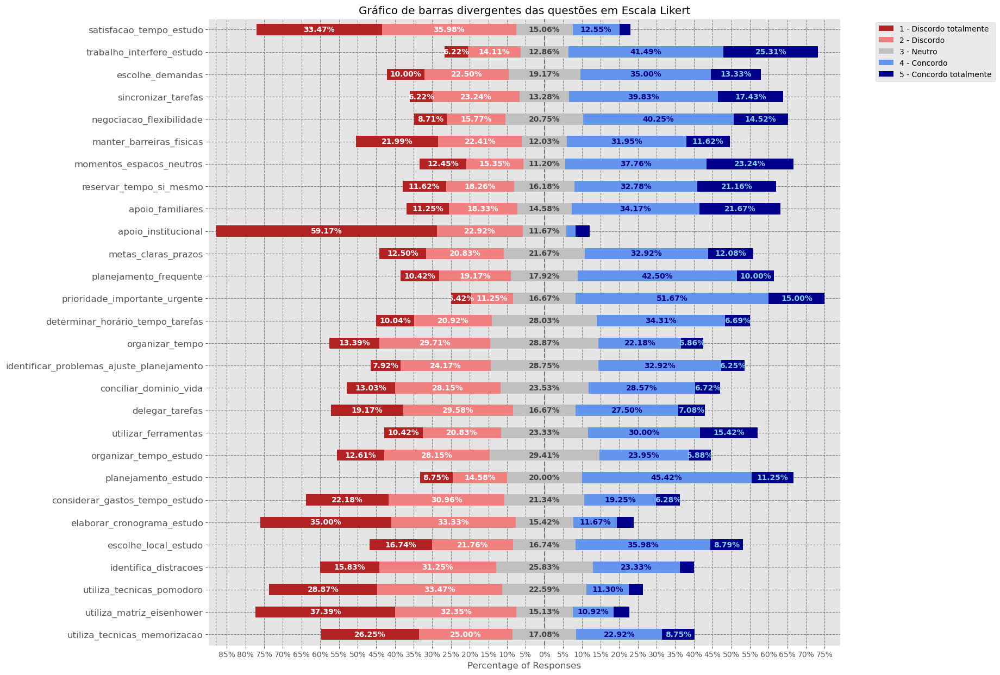

In [65]:
# Criando o plot de Likert

df_prepared = prepare_data(df, var_escala_likert_lista)
plot_likert_divergente(
    df_prepared,
    "Gráfico de barras divergentes das questões em Escala Likert",
    figsize=(15, 15),
)
plt.savefig("escala_likert.svg", bbox_inches="tight")
plt.show()

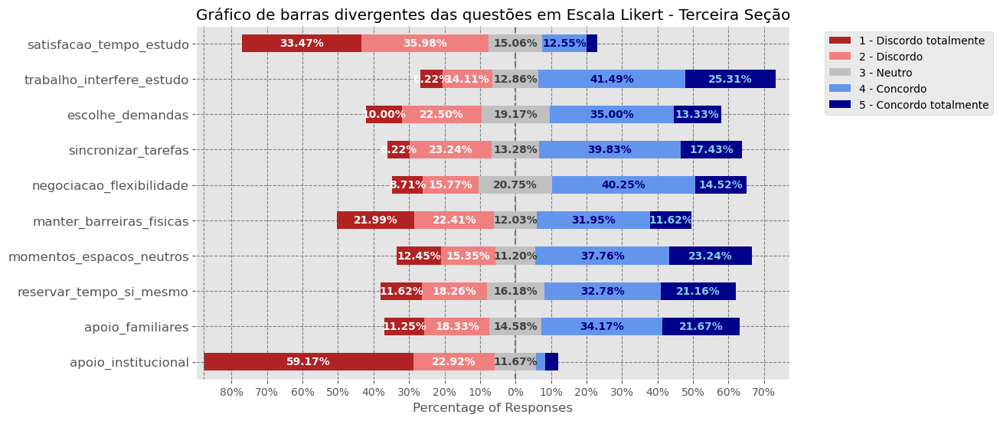

In [66]:
# Criando o plot de Likert - Terceira Seção

df_prepared = prepare_data(df, var_escala_likert_lista)
df_prepared_terceira_secao = df_prepared.loc[
    :, "satisfacao_tempo_estudo":"apoio_institucional"
]
plot_likert_divergente(
    df_prepared_terceira_secao,
    "Gráfico de barras divergentes das questões em Escala Likert - Terceira Seção",
    figsize=(10, 6),
)
plt.savefig("escala_likert_terceira_secao.svg", bbox_inches="tight")
plt.show()

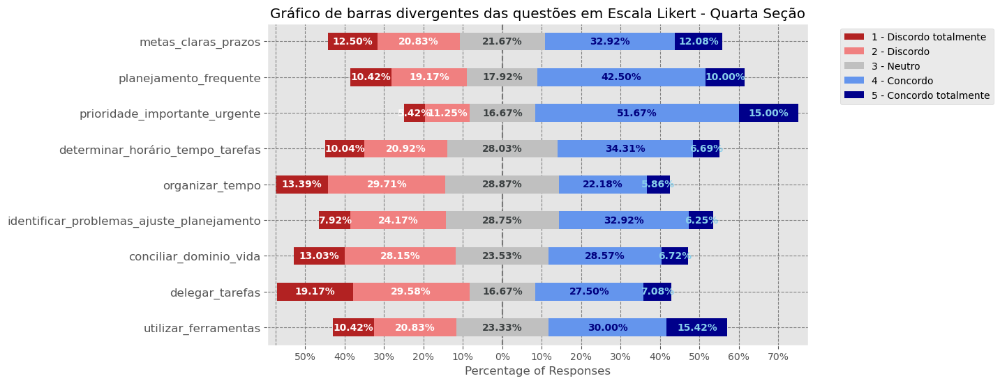

In [67]:
# Criando o plot de Likert - Quarta Seção

df_prepared = prepare_data(df, var_escala_likert_lista)
df_prepared_terceira_secao = df_prepared.loc[
    :, "metas_claras_prazos":"utilizar_ferramentas"
]
plot_likert_divergente(
    df_prepared_terceira_secao,
    "Gráfico de barras divergentes das questões em Escala Likert - Quarta Seção",
    figsize=(10, 6),
)
plt.savefig("escala_likert_quarta_secao.svg", bbox_inches="tight")
plt.show()

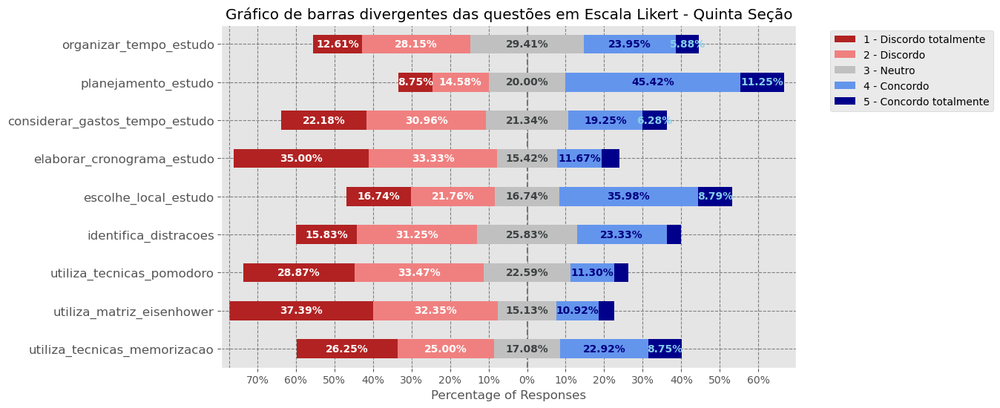

In [68]:
# Criando o plot de Likert - Quinta Seção

df_prepared = prepare_data(df, var_escala_likert_lista)
df_prepared_terceira_secao = df_prepared.loc[
    :, "organizar_tempo_estudo":"utiliza_tecnicas_memorizacao"
]
plot_likert_divergente(
    df_prepared_terceira_secao,
    "Gráfico de barras divergentes das questões em Escala Likert - Quinta Seção",
    figsize=(10, 6),
)
plt.savefig("escala_likert_quinta_secao.svg", bbox_inches="tight")
plt.show()

In [69]:
# Fazendo a "descodificação" das variáveis

print(df_encoded.isnull().sum())

situacao_profissional_Empreendedor/MEI                   0
situacao_profissional_Estágio                            0
situacao_profissional_Outro                              0
situacao_profissional_Trabalho autônomo ou Freelancer    0
situacao_profissional_Trabalho formal/CLT                0
                                                        ..
escolhe_local_estudo                                     0
identifica_distracoes                                    0
utiliza_tecnicas_pomodoro                                0
utiliza_matriz_eisenhower                                0
utiliza_tecnicas_memorizacao                             0
Length: 64, dtype: int64


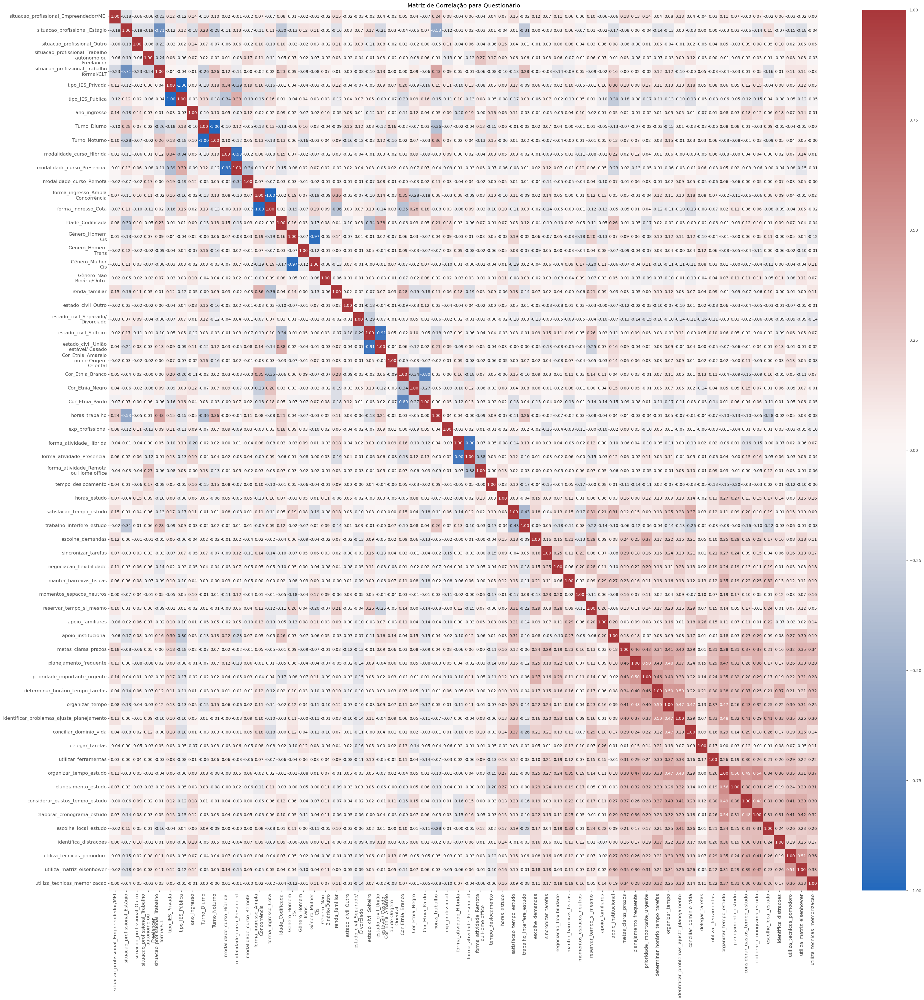

In [70]:
# Criando matriz de correlação

plot_heatmap_corr(
    df_encoded, "Matriz de Correlação para Questionário", corr_method="spearman"
)

plt.show()

In [71]:
%%R -i df_encoded

glimpse(df_encoded)

Rows: 241
Columns: 64
$ `situacao_profissional_Empreendedor/MEI`                 <lgl> FALSE, FALSE,~
$ `situacao_profissional_Estágio`                         <lgl> FALSE, TRUE, ~
$ situacao_profissional_Outro                              <lgl> FALSE, FALSE,~
$ `situacao_profissional_Trabalho autônomo ou Freelancer` <lgl> FALSE, FALSE,~
$ `situacao_profissional_Trabalho formal/CLT`              <lgl> TRUE, FALSE, ~
$ tipo_IES_Privada                                         <lgl> FALSE, FALSE,~
$ tipo_IES_Pública                                        <lgl> TRUE, TRUE, T~
$ ano_ingresso                                             <ord> 0, 1, 1, 0, 1~
$ Turno_Diurno                                             <lgl> FALSE, FALSE,~
$ Turno_Noturno                                            <lgl> TRUE, TRUE, F~
$ `modalidade_curso_Híbrida`                               <lgl> FALSE, FALSE,~
$ modalidade_curso_Presencial                              <lgl> TRUE, TRUE, T~
$ modalidade_curso_Re

In [72]:
%%R
colnames(df_encoded)

 [1] "situacao_profissional_Empreendedor/MEI"                
 [2] "situacao_profissional_Estágio"                        
 [3] "situacao_profissional_Outro"                           
 [4] "situacao_profissional_Trabalho autônomo ou Freelancer"
 [5] "situacao_profissional_Trabalho formal/CLT"             
 [6] "tipo_IES_Privada"                                      
 [7] "tipo_IES_Pública"                                     
 [8] "ano_ingresso"                                          
 [9] "Turno_Diurno"                                          
[10] "Turno_Noturno"                                         
[11] "modalidade_curso_Híbrida"                             
[12] "modalidade_curso_Presencial"                           
[13] "modalidade_curso_Remota"                               
[14] "forma_ingresso_Ampla Concorrência"                    
[15] "forma_ingresso_Cota"                                   
[16] "Idade_Codificada"                                      
[17] "Gênero_

In [73]:
%%R -i df_encoded_ordinal_likert

# Exportando o arquivo
Sys.setlocale(locale = "Portuguese_Brazil.utf8")

saveRDS(df_encoded, file = "df_encoded.Rda")
saveRDS(df_encoded_ordinal_likert, file = "df_encoded_ordinal_likert.Rda")

In addition: Warning message:
In Sys.setlocale(locale = "Portuguese_Brazil.utf8") :
  using locale code page other than 1252 may cause problems


## Análise fatorial Exploratória

* https://phylos.net/2020-11-02/analise-fatorial-usando-python
* https://github.com/cibelerusso/AnaliseMultivariadaEAprendizadoNaoSupervisionado/blob/master/Comandos%20em%20Python/8%20An%C3%A1lise%20Fatorial.ipynb
* https://ichi.pro/pt/introducao-a-analise-fatorial-em-python-116625965253739



https://journals.sagepub.com/doi/full/10.1177/0095798418771807


In [74]:
df_encoded_numérico = df_encoded.copy()


print(df_encoded_numérico.isnull().sum())

situacao_profissional_Empreendedor/MEI                   0
situacao_profissional_Estágio                            0
situacao_profissional_Outro                              0
situacao_profissional_Trabalho autônomo ou Freelancer    0
situacao_profissional_Trabalho formal/CLT                0
                                                        ..
escolhe_local_estudo                                     0
identifica_distracoes                                    0
utiliza_tecnicas_pomodoro                                0
utiliza_matriz_eisenhower                                0
utiliza_tecnicas_memorizacao                             0
Length: 64, dtype: int64


In [75]:
# Revertendo as variáveis nominais na sua forma original
for variavel in var_categorica_nominal_lista:
    colunas_dummies = [
        col for col in df_encoded_numérico.columns if str(variavel) + "_" in col
    ]

    # Cria a coluna original a partir das dummies
    df_encoded_numérico[variavel] = (
        df_encoded_numérico[colunas_dummies]
        .idxmax(axis=1)
        .str.replace(f"{variavel}_", "")
    )

# Remove as colunas de dummies originais
df_encoded_numérico = df_encoded_numérico.drop(
    columns=[
        col
        for col in df_encoded_numérico.columns
        if any(
            col.startswith(f"{variavel}_") for variavel in var_categorica_nominal_lista
        )
    ]
)

# Aplicando o Label Encoding
for column in df_encoded_numérico.select_dtypes(include=["category", "object"]).columns:
    df_encoded_numérico[column] = label_encoder.fit_transform(
        df_encoded_numérico[column]
    ).astype(int)

In [77]:
# Fazendo os testes de Barltlett e Teste de Kaiser Meyer Olkin

# Verifica se as variáveis estão correlacionadas entre si mesma, comparando as matrizes de correlação e matriz de identidade
# Quando maior o valor de chi-quadrado, maior a magnitude da diferença entre as matrizes
# Se p = 0, rejeitamos a hipótese nula e conclui-se que as variavéis não são correlacionadas

chi_square_value, p_value = factor_analyzer.calculate_bartlett_sphericity(
    df_encoded_numérico
)


kmo_all, kmo_model = factor_analyzer.calculate_kmo(df_encoded_numérico.astype(float))

print(
    "Teste da Esfericidade de Bartlett: chi² = %d,  p_value = %d"
    % (chi_square_value, p_value)
)


# Verifica com Teste de KMO. Se o valor for menor que 0.6, então não é boa variável para a análise fatorial
print("Valores de kmo_all =\n", kmo_all, "\n")
print("KMO =", kmo_model)

liminar = 0.6
print("Colunas com baixo valor de KMO:\n")
for coluna, valor in zip(df_encoded_numérico, kmo_all):
    if valor < liminar:
        print(f"{coluna}: {valor}")

Teste da Esfericidade de Bartlett: chi² = 2989,  p_value = 0
Valores de kmo_all =
 [0.66245976 0.60598731 0.62651011 0.66840174 0.42147432 0.608402
 0.77251735 0.73596625 0.73245831 0.76120229 0.76543488 0.7243469
 0.75331216 0.56045074 0.74238405 0.6269147  0.63047536 0.86040822
 0.84702978 0.80410149 0.82329412 0.86019585 0.88833694 0.81722932
 0.5761555  0.8479942  0.83388194 0.83538645 0.89465261 0.86472095
 0.7750243  0.78891807 0.8292914  0.86706467 0.89256393 0.6388704
 0.66904043 0.48908766 0.65718826 0.59043892 0.51650617 0.58527528
 0.59077652 0.56227211] 

KMO = 0.7792243809143167
Colunas com baixo valor de KMO:

exp_profissional: 0.421474318389894
momentos_espacos_neutros: 0.5604507436799996
delegar_tarefas: 0.5761555019327896
modalidade_curso: 0.48908766123046377
Gênero: 0.5904389200612065
estado_civil: 0.5165061663893015
Cor_Etnia: 0.5852752789356328
forma_atividade: 0.5907765224708452
tipo_IES: 0.562272114854413


In [78]:
import pandas as pd

correlation_matrix = df_encoded_numérico[var_escala_likert_lista].corr()
print(correlation_matrix)

                                           satisfacao_tempo_estudo  \
satisfacao_tempo_estudo                                   1.000000   
trabalho_interfere_estudo                                -0.441408   
escolhe_demandas                                          0.187031   
sincronizar_tarefas                                      -0.013241   
negociacao_flexibilidade                                  0.157452   
manter_barreiras_fisicas                                  0.165416   
momentos_espacos_neutros                                 -0.164251   
reservar_tempo_si_mesmo                                   0.306855   
apoio_familiares                                          0.217452   
apoio_institucional                                       0.275908   
metas_claras_prazos                                       0.087074   
planejamento_frequente                                    0.134504   
prioridade_importante_urgente                             0.114083   
determinar_horário_t

In [79]:
# Fazendo os testes de Barltlett e Teste de Kaiser Meyer Olkin


# Verifica se as variáveis estão correlacionadas entre si mesma, comparando as matrizes de correlação e matriz de identidade
# Quando maior o valor de chi-quadrado, maior a magnitude da diferença entre as matrizes
# Se p = 0, rejeitamos a hipótese nula e conclui-se que as variavéis não são correlacionadas

chi_square_value, p_value = factor_analyzer.calculate_bartlett_sphericity(
    df_encoded_numérico[var_escala_likert_lista]
)

kmo_all, kmo_model= factor_analyzer.calculate_kmo(
    df_encoded_numérico[var_escala_likert_lista].astype(float)
)

print(
    "Teste da Esfericidade de Bartlett: chi² = %.4f,  p_value = %4g"
    % (chi_square_value, p_value)
)
print("Valores de kmo_all =\n", kmo_all, "\n")
print("KMO =", kmo_model)

liminar = 0.6
print("Colunas com baixo valor de KMO:\n")
for coluna, valor in zip(df_encoded[var_escala_likert_lista], kmo_all):
    if valor < liminar:
        print(f"{coluna}: {valor}")

Teste da Esfericidade de Bartlett: chi² = 2090.0602,  p_value = 2.51626e-234
Valores de kmo_all =
 [0.73452237 0.7026577  0.77816086 0.79479171 0.77844768 0.77660189
 0.60408086 0.71819961 0.64835859 0.64145881 0.9045389  0.88882852
 0.86781419 0.85953404 0.88380889 0.90480166 0.84515283 0.55103506
 0.89915276 0.85492723 0.84791684 0.91246044 0.87710751 0.82331015
 0.81200197 0.86034502 0.88227952 0.93271841] 

KMO = 0.8428332150000654
Colunas com baixo valor de KMO:

delegar_tarefas: 0.5510350648109749


In [80]:
# Fazendo os testes de Barltlett e Teste de Kaiser Meyer Olkin
kmo_df = pd.DataFrame(kmo_all,
                     index=df_encoded[var_escala_likert_lista].columns.tolist()
                     )
kmo_df

,0
satisfacao_tempo_estudo,0.734522
trabalho_interfere_estudo,0.702658
escolhe_demandas,0.778161
sincronizar_tarefas,0.794792
negociacao_flexibilidade,0.778448
manter_barreiras_fisicas,0.776602
momentos_espacos_neutros,0.604081
reservar_tempo_si_mesmo,0.718200
apoio_familiares,0.648359
apoio_institucional,0.641459


In [81]:

# Buscando os melhores parâmetros para a análise fatorial

rotacoes = ['varimax', 'oblimax', 'quartimax', 'equamax', 'geomin_ort', 'promax', 'oblimin', 'quartimin', 'geomin_obl', None]
n_fatores_range = range(5, 20)
melhor_escore = 0.6
melhor_config = {}

# Loop sobre o número de fatores e rotações
for n_fatores in n_fatores_range:
  for rotacao in rotacoes:
    try:
      # Configurando o modelo de análise fatorial
      fa = factor_analyzer.FactorAnalyzer(
          n_fatores,
          rotation = rotacao
      )
      fa.fit(df_encoded_numérico[var_escala_likert_lista])

      # Calculando a variância explicada acumulativa
      variancia_explicada = sum(fa.get_factor_variance()[1])  # Pega o valor acumulado da variância explicada

      # Critério para considerar uma configuração como melhor (ajuste a critério)
      if variancia_explicada > melhor_escore:  # Exemplo: foco em variância > 60%
          melhor_score = variancia_explicada
          melhor_config = {
              'num_fatores': n_fatores,
              'rotacao': rotacao,
              'variancia_explicada': variancia_explicada,
          }

      print(f"Num Fatores: {n_fatores}, Rotação: {rotacao}, Variância Explicada: {variancia_explicada:.2f}")

    except Exception as e:
        print(f"Erro com {n_fatores} fatores e rotação {rotacao}: {e}")

# Exibe a melhor configuração encontrada
print("\nMelhor Configuração Encontrada:")
print(melhor_config)


Num Fatores: 5, Rotação: varimax, Variância Explicada: 0.37
Num Fatores: 5, Rotação: oblimax, Variância Explicada: 0.37
Num Fatores: 5, Rotação: quartimax, Variância Explicada: 0.37
Num Fatores: 5, Rotação: equamax, Variância Explicada: 0.37
Num Fatores: 5, Rotação: geomin_ort, Variância Explicada: 0.37
Num Fatores: 5, Rotação: promax, Variância Explicada: 0.34
Num Fatores: 5, Rotação: oblimin, Variância Explicada: 0.32
Num Fatores: 5, Rotação: quartimin, Variância Explicada: 0.32
Num Fatores: 5, Rotação: geomin_obl, Variância Explicada: 0.33
Num Fatores: 5, Rotação: None, Variância Explicada: 0.37
Num Fatores: 6, Rotação: varimax, Variância Explicada: 0.40
Num Fatores: 6, Rotação: oblimax, Variância Explicada: 0.40
Num Fatores: 6, Rotação: quartimax, Variância Explicada: 0.40
Num Fatores: 6, Rotação: equamax, Variância Explicada: 0.40
Num Fatores: 6, Rotação: geomin_ort, Variância Explicada: 0.40
Num Fatores: 6, Rotação: promax, Variância Explicada: 0.38
Num Fatores: 6, Rotação: oblim

In [82]:

from itertools import product


def otimizar_analise_fatorial(dados,
                            n_fatores_range=(2, 8),
                            rotacoes=['varimax', 'oblimax', 'quartimax', 'equamax', 'geomin_ort', 'promax', 'oblimin', 'quartimin', 'geomin_obl', None],
                            min_loading=0.3,
                            metodo='ml'):
    """
    Realiza análise fatorial com diferentes parâmetros e avalia resultados.

    Args:
        dados: DataFrame com as variáveis para análise
        n_fatores_range: Tupla com range de número de fatores a testar
        rotacoes: Lista de métodos de rotação a testar
        min_loading: Carga fatorial mínima a considerar
        metodo: Método de extração ('ml' para máxima verossimilhança)

    Returns:
        DataFrame com resultados e melhor modelo
    """

    # Criar lista para armazenar resultados
    resultados = []

    # Iterar sobre combinações de parâmetros
    for n_fatores in range(n_fatores_range[0], n_fatores_range[1] + 1):
        for rotacao in rotacoes:
            try:
                # Criar e ajustar modelo
                fa = factor_analyzer.FactorAnalyzer(
                    rotation=rotacao,
                    n_factors=n_fatores,
                    method=metodo
                )
                fa.fit(dados)

                # Obter cargas fatoriais
                loadings = pd.DataFrame(
                    fa.loadings_,
                    columns=[f'Fator{i+1}' for i in range(n_fatores)],
                    index=dados.columns
                )

                # Calcular métricas
                var_explicada = fa.get_factor_variance()[1].sum()  # Variância explicada

                # Contar variáveis com carga significativa por fator
                vars_significativas = (abs(loadings) >= min_loading).sum()
                min_vars_por_fator = vars_significativas.min()
                max_vars_por_fator = vars_significativas.max()

                # Verificar comunalidades
                comunalidades = fa.get_communalities()
                media_comunalidades = np.mean(comunalidades)
                min_comunalidade = np.min(comunalidades)

                # Calcular simplicidade do modelo
                # (quanto menor o número de cargas cruzadas, melhor)
                cargas_cruzadas = ((abs(loadings) >= min_loading).sum(axis=1) > 1).sum()

                # Armazenar resultados
                resultados.append({
                    'n_fatores': n_fatores,
                    'rotacao': rotacao,
                    'var_explicada': var_explicada,
                    'media_comunalidades': media_comunalidades,
                    'min_comunalidade': min_comunalidade,
                    'min_vars_por_fator': min_vars_por_fator,
                    'max_vars_por_fator': max_vars_por_fator,
                    'cargas_cruzadas': cargas_cruzadas,
                    'modelo': fa,
                    'loadings': loadings
                })

            except Exception as e:
                print(f"Erro com {n_fatores} fatores e rotação {rotacao}: {str(e)}")
                continue

    # Converter resultados para DataFrame
    resultados_df = pd.DataFrame([
        {k: v for k, v in r.items() if k not in ['modelo', 'loadings']}
        for r in resultados
    ])

    # Encontrar melhor modelo
    # Critérios:
    # 1. Maior variância explicada
    # 2. Menor número de cargas cruzadas
    # 3. Maior média de comunalidades
    resultados_df['score'] = (
        resultados_df['var_explicada'] * 0.4 +
        (1 / (resultados_df['cargas_cruzadas'] + 1)) * 0.3 +
        resultados_df['media_comunalidades'] * 0.3
    )

    melhor_modelo_idx = resultados_df['score'].idxmax()
    melhor_modelo = resultados[melhor_modelo_idx]

    return resultados_df, melhor_modelo

def exibir_resultados_detalhados(melhor_modelo, min_loading=0.3):
    """
    Exibe resultados detalhados do melhor modelo.

    Args:
        melhor_modelo: Dicionário com informações do melhor modelo
        min_loading: Carga fatorial mínima a considerar
    """
    print("\n=== RESULTADOS DO MELHOR MODELO ===")
    print(f"Número de fatores: {melhor_modelo['n_fatores']}")
    print(f"Método de rotação: {melhor_modelo['rotacao']}")
    print(f"\nVariância explicada: {melhor_modelo['var_explicada']:.2%}")
    print(f"Média das comunalidades: {melhor_modelo['media_comunalidades']:.3f}")

    print("\nCargas fatoriais significativas:")
    loadings = melhor_modelo['loadings']

    for fator in loadings.columns:
        print(f"\n{fator}:")
        cargas_sig = loadings[abs(loadings[fator]) >= min_loading][fator]
        cargas_ordenadas = cargas_sig.sort_values(ascending=False)
        for var, carga in cargas_ordenadas.items():
            print(f"  {var}: {carga:.3f}")

# Exemplo de uso:


# Executar otimização
resultados_df, melhor_modelo = otimizar_analise_fatorial(
    df_encoded_numérico[var_escala_likert_lista],
    n_fatores_range=(5, 15),  # Testar de 2 a 8 fatores
    min_loading=0.3
)

# Ver resultados gerais
print("\nResultados de todas as combinações:")
print(resultados_df.sort_values('score', ascending=False))

# Ver resultados detalhados do melhor modelo
exibir_resultados_detalhados(melhor_modelo)



Resultados de todas as combinações:
     n_fatores     rotacao  var_explicada  media_comunalidades  \
105         15      promax       0.602531             0.602531   
85          13      promax       0.735834             0.735834   
95          14      promax       0.611909             0.611909   
75          12      promax       0.594290             0.594290   
107         15   quartimin       0.508546             0.508546   
..         ...         ...            ...                  ...   
0            5     varimax       0.379286             0.379286   
17           6   quartimin       0.337930             0.337930   
16           6     oblimin       0.337930             0.337930   
28           7  geomin_obl       0.361335             0.361335   
18           6  geomin_obl       0.351133             0.351133   

     min_comunalidade  min_vars_por_fator  max_vars_por_fator  \
105          0.165960                   1                   3   
85           0.114453                   

### Só com as variáveis na escala Likert (VARIMAX)

Deve dar uma preferência para variância total com mais de 60% na ciência social

In [83]:
# Escolhendo o  número de fatores ao criar um objeto de factor analuzisis e executá-lo
# Selecionei apenas as questões que estavam na escala de Likert
fatores = 13
rotacao = "varimax"

fa = factor_analyzer.FactorAnalyzer(fatores, rotation=rotacao)
fa.fit(df_encoded_numérico[var_escala_likert_lista])

# Verificando o Eigenvalues
ev, v = fa.get_eigenvalues()
ev

array([7.06581487, 2.14235898, 1.55786235, 1.41988059, 1.31941384,
       1.21507873, 1.13352083, 1.0366812 , 0.95630428, 0.86230013,
       0.79946083, 0.7637313 , 0.74449377, 0.70145274, 0.64919586,
       0.63724589, 0.59818181, 0.55585598, 0.5255364 , 0.49518448,
       0.4833059 , 0.42577776, 0.41015662, 0.37038786, 0.32589657,
       0.32034137, 0.26912305, 0.21545602])

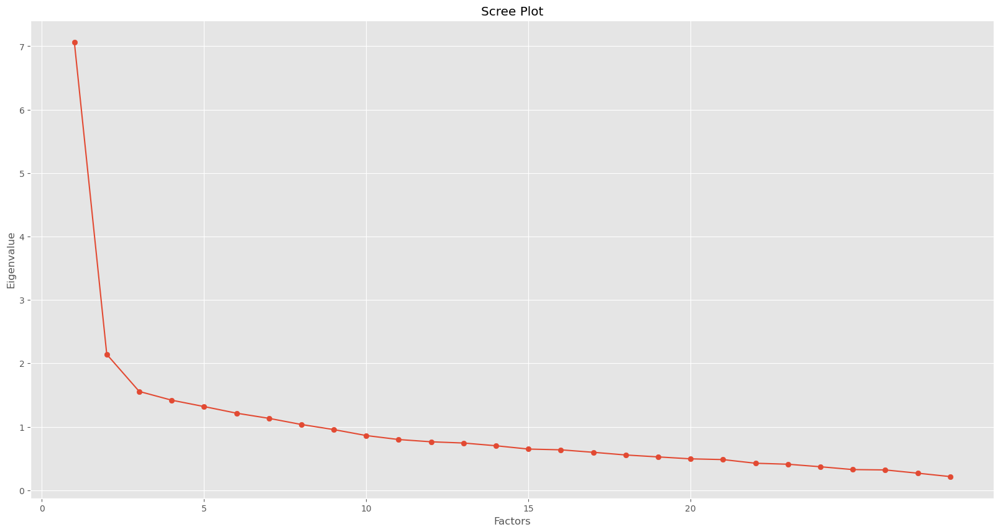

In [84]:
# Create scree plot using matplotlib

plt.figure(figsize=(20, 10))
plt.scatter(range(1, df_encoded_numérico[var_escala_likert_lista].shape[1] + 1), ev)
plt.plot(range(1, df_encoded_numérico[var_escala_likert_lista].shape[1] + 1), ev)
plt.title("Scree Plot")
plt.xlabel("Factors")
plt.ylabel("Eigenvalue")

plt.xticks(np.arange(0, 25, step=5))

plt.show()

In [85]:
# Tentar com 13 fatores
fa = factor_analyzer.FactorAnalyzer(fatores, rotation=rotacao)
fa.fit(df_encoded_numérico[var_escala_likert_lista])

L = pd.DataFrame(fa.loadings_)
np.round(L, 2)
L.index = df_encoded_numérico[var_escala_likert_lista].columns
L.columns = [
    "FA1",
    "FA2",
    "FA3",
    "FA4",
    "FA5",
    "FA6",
    "FA7",
    "FA8",
    "FA9",
    "FA10",
    "FA11",
    "FA12",
    "FA13",
 #   "FA14",
 #   "FA15",
#    "FA16"
]


In [86]:
#Verificar se a matriz rotacionada possui valores negativos ou abaixo de 0.4

'''loadings = fa.loadings_
print(loadings)
print((loadings < 0.4).sum())  # Conta quantos valores estão abaixo de 0.4
print((loadings < 0).sum())  # Conta quantos valores são negativos'''


# Cargas fatoriais após rotação Varimax
loadings = pd.DataFrame(
    fa.loadings_,
    columns=[f'FA{i+1}' for i in range(fatores)],
    index=df_encoded_numérico[var_escala_likert_lista].columns
)

print("\nMatriz de Cargas Fatoriais (após rotação Varimax):")
print(loadings)

# Verificar valores abaixo de 0.4
print("\nVerificação de cargas fatoriais:")
print("Valores abaixo de 0.4 ou negativos encontrados nas seguintes posições:")
for col in loadings.columns:
    for idx in loadings.index:
        if abs(loadings.loc[idx, col]) < 0.4 or loadings.loc[idx, col] < 0:
            print(f"Variável {idx}, {col}: {loadings.loc[idx, col]:.3f}")


Matriz de Cargas Fatoriais (após rotação Varimax):
                                                FA1       FA2       FA3  \
satisfacao_tempo_estudo                    0.061704  0.075153  0.060441   
trabalho_interfere_estudo                 -0.049378  0.074079  0.000239   
escolhe_demandas                           0.198126  0.051546  0.174574   
sincronizar_tarefas                        0.102322  0.155075  0.139329   
negociacao_flexibilidade                   0.221375  0.107593  0.123875   
manter_barreiras_fisicas                   0.057227 -0.000822  0.236862   
momentos_espacos_neutros                   0.074635  0.052306  0.119142   
reservar_tempo_si_mesmo                    0.052077  0.114162  0.032653   
apoio_familiares                          -0.037898 -0.024669  0.073241   
apoio_institucional                        0.050863  0.216384  0.061474   
metas_claras_prazos                        0.490129  0.327036  0.121886   
planejamento_frequente                     0.661

In [87]:
print((loadings < 0.4).sum())  # Conta quantos valores estão abaixo de 0.4
print((loadings < 0).sum())  # Conta quantos valores são negativos

FA1     22
FA2     24
FA3     26
FA4     26
FA5     27
FA6     27
FA7     26
FA8     27
FA9     27
FA10    27
FA11    27
FA12    26
FA13    27
dtype: int64
FA1      2
FA2      2
FA3      1
FA4      8
FA5      6
FA6      6
FA7      8
FA8     12
FA9      6
FA10     7
FA11    12
FA12     6
FA13    12
dtype: int64


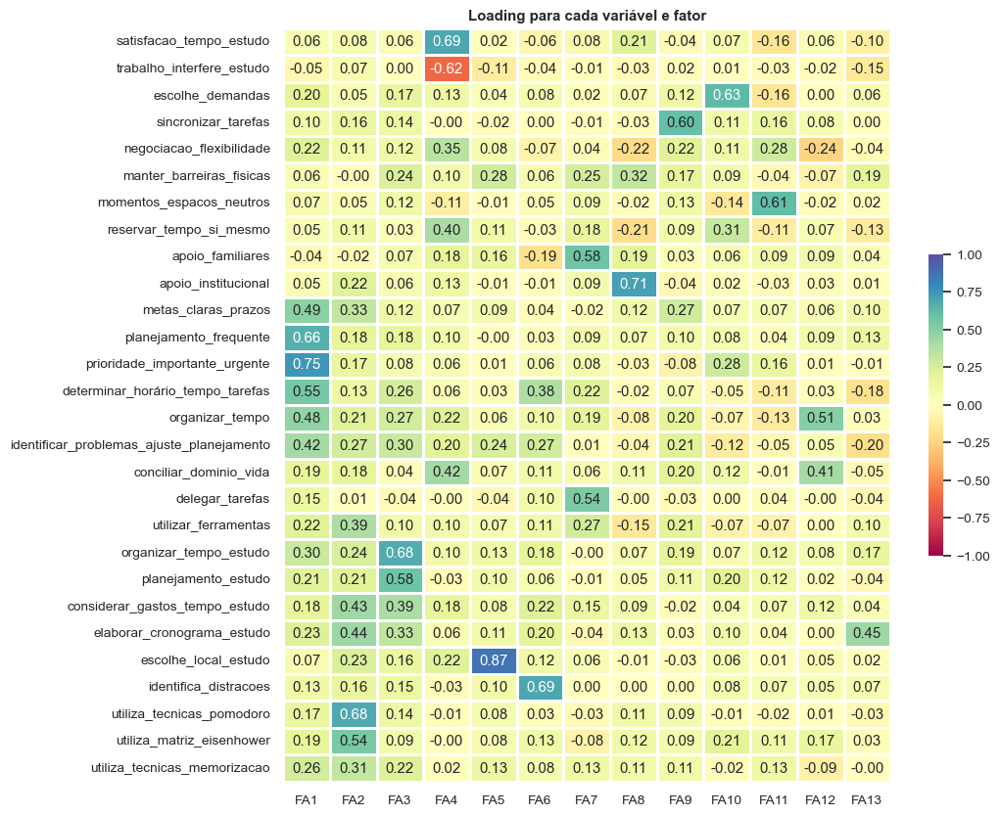

In [88]:
plt.figure(figsize=(10, 10))
sns.set(font_scale=0.9)
sns.heatmap(
    L,
    linewidths=1,
    linecolor="#ffffff",
    cmap="Spectral",
    annot=True,
    vmax=1,
    vmin=-1,
    xticklabels=1,
    yticklabels=1,
    fmt=".2f",
    cbar_kws={"shrink": 0.4, "orientation": "vertical"},
)
plt.title("Loading para cada variável e fator", weight="bold")

plt.savefig("Loading_variaveis_factor.svg",
            bbox_inches='tight')

plt.show()

In [89]:
# Avaliar a variância dos fatores

fator_variancia = pd.DataFrame(fa.get_factor_variance())
#fator_variancia.index = ["SS Loadings", "Proportion Var", "Cumulative Var"]
fator_variancia.index = ["Carga SS", "Proporção da Variância", "Variância Cumulativa"]
fator_variancia.columns = [
    "FA1",
    "FA2",
    "FA3",
    "FA4",
    "FA5",
    "FA6",
    "FA7",
    "FA8",
    "FA9",
    "FA10",
    "FA11",
    "FA12",
    "FA13",
#    "FA14",
#    "FA15",
#    'FA16'
]

fator_variancia

,FA1,FA2,FA3,FA4,FA5,FA6,FA7,FA8,FA9,FA10,FA11,FA12,FA13
Carga SS,2.54045,2.025092,1.627512,1.623470,1.069633,0.978223,0.972639,0.925428,0.829516,0.794540,0.697580,0.594105,0.446951
Proporção da Variância,0.09073,0.072325,0.058125,0.057981,0.038201,0.034937,0.034737,0.033051,0.029626,0.028376,0.024914,0.021218,0.015963
Variância Cumulativa,0.09073,0.163055,0.221181,0.279162,0.317363,0.352299,0.387036,0.420087,0.449713,0.478089,0.503003,0.524221,0.540183


O total da variância cumulativa é de 0,4488, ou seja 44,88%

In [90]:
# Comunalidades

comunalidade = pd.DataFrame(fa.get_communalities())
np.round(L, 2)
comunalidade.index = df_encoded_numérico[var_escala_likert_lista].columns

comunalidade

,0
satisfacao_tempo_estudo,0.587667
trabalho_interfere_estudo,0.437123
escolhe_demandas,0.541126
sincronizar_tarefas,0.466499
negociacao_flexibilidade,0.454711
manter_barreiras_fisicas,0.401122
momentos_espacos_neutros,0.458784
reservar_tempo_si_mesmo,0.405428
apoio_familiares,0.493953
apoio_institucional,0.591278


In [91]:
# Avaliando o desempenho do modelo

# Quando maior comunalidade, melhor fica o desempenho
n_var = len(df_encoded_numérico[var_escala_likert_lista].columns)

print(
    "Soma de Comunalidades:",
    fa.get_communalities().sum(),
    "\n",
    "Média de Comunalidade:",
    (fa.get_communalities().sum() / n_var),
)

Soma de Comunalidades: 15.125137554358181 
 Média de Comunalidade: 0.5401834840842208


In [92]:
# Aplicando ao df

fa_likert = pd.DataFrame.from_records(
    fa.transform(df_encoded_numérico[var_escala_likert_lista])
)

df_fa_likert = pd.concat([df_encoded_numérico, fa_likert], axis=1)
df_fa_likert = df_fa_likert.drop(var_escala_likert_lista, axis=1)

# Renomeando os fatores

df_fa_likert = df_fa_likert.rename(
    columns={
        0: "FA1_planejamento_priorizacao", #Ok
        1: "FA2_ferramentas_estudo", #Ok
        2: "FA3_planejamento_organizacao_estudo", #ok
        3: "FA4_satisfacao_interferencia_estudo", #Ok
        4: "FA5_escolhe_local_estudo",#ok
        5: "FA6_det_horario_iden_distracoes", #Ok
        6: "FA7_apoio_familiar_delega_tarefa", #ok
        7: "FA8_apoio_institucional", #ok
        8: "FA9_sincronizar_tarefas",
        9: "FA10_escolhe_demandas",
        10: "FA11_momentos_espacos_neutros",
        11: "FA12_organizar_tempo_conciliar_dominios",
        12: "FA13_elaborar_cronograma_estudo",
    }
)

## Análise de Componentes Principais

Será selecionado apenas as variáveis na escala de Likert

*   https://github.com/cibelerusso/AnaliseMultivariadaEAprendizadoNaoSupervisionado/blob/master/Comandos%20em%20Python/7%20ACP.ipynb
*   https://ichi.pro/pt/aprenda-analise-de-componentes-principais-pca-em-python-com-exemplos-116374902586518
*   https://datagy.io/python-pca/





### Apenas variáveis em Likert


In [93]:
# Calculating eigenvectors and eigenvalues on covariance matrix

# Matriz de covariância
cov_mat2 = pd.DataFrame(np.cov(df_encoded_numérico[var_escala_likert_lista].T))
cov_mat2.index = df_encoded_numérico[var_escala_likert_lista].columns
cov_mat2.columns = df_encoded_numérico[var_escala_likert_lista].columns

# Matriz de Eigenvalues e eigenvector
eig_vals, eig_vecs = np.linalg.eig(cov_mat2)

eig_vals = pd.DataFrame(
    eig_vals, index=df_encoded_numérico[var_escala_likert_lista].columns
)


eig_vecs = pd.DataFrame(
    eig_vecs,
    index=df_encoded_numérico[var_escala_likert_lista].columns,
    columns=df_encoded_numérico[var_escala_likert_lista].columns,
)

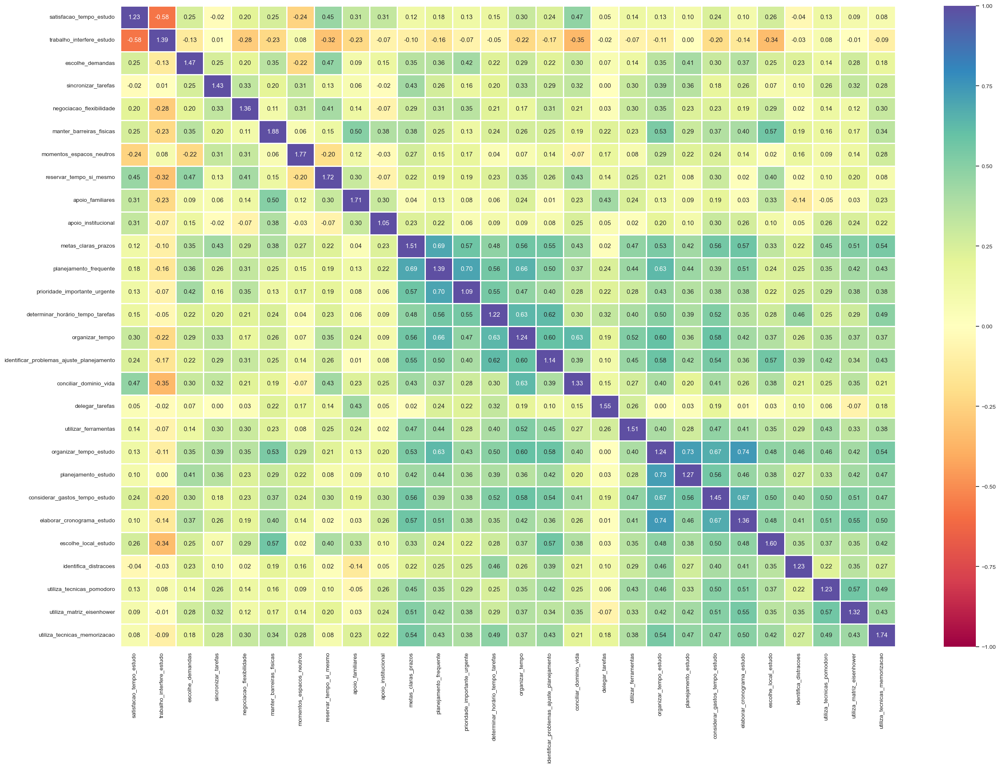

In [94]:
plt.figure(figsize=(30, 20))
sns.set(font_scale=0.9)
sns.heatmap(
    cov_mat2,
    linewidths=1,
    linecolor="#ffffff",
    cmap="Spectral",
    annot=True,
    fmt=".2f",
    vmax=1,
    vmin=-1,
    xticklabels=1,
    yticklabels=1,
)
plt.show()

In [95]:
# Verificando o eigenvalues
eig_vals

,0
satisfacao_tempo_estudo,9.590698
trabalho_interfere_estudo,3.137925
escolhe_demandas,2.345899
sincronizar_tarefas,2.152820
negociacao_flexibilidade,1.880932
manter_barreiras_fisicas,1.674371
momentos_espacos_neutros,1.583810
reservar_tempo_si_mesmo,1.484079
apoio_familiares,1.373172
apoio_institucional,1.309310


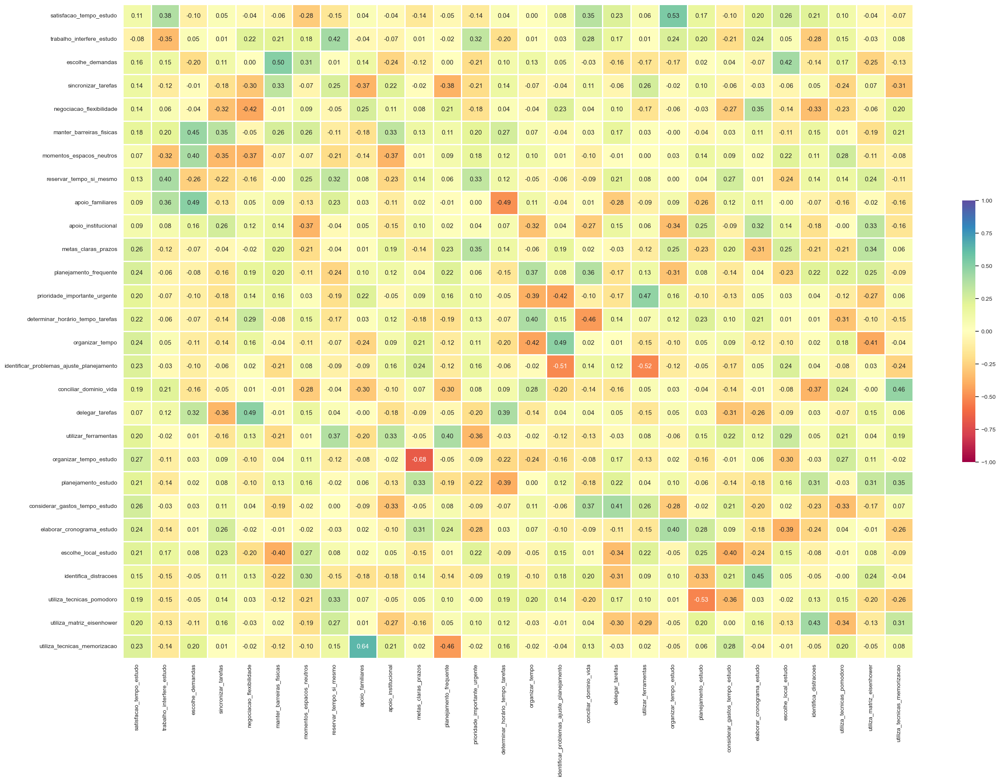

In [96]:
# Eigen_vector
plt.figure(figsize=(30, 20))
sns.set(font_scale=0.9)
sns.heatmap(
    eig_vecs,
    linewidths=1,
    linecolor="#ffffff",
    cmap="Spectral",
    annot=True,
    fmt=".2f",
    vmax=1,
    vmin=-1,
    xticklabels=1,
    yticklabels=1,
    cbar_kws={"shrink": 0.4, "orientation": "vertical"},
)
plt.show()

In [97]:
# Criando PCA
n_componentes = 13
pca = PCA(n_components=n_componentes)

pca.fit(df_encoded_numérico[var_escala_likert_lista])

PCA(n_components=13)

In [98]:
# Verificando o spesos dos componentes principais

pca.components_[0, :]

array([ 0.10667243, -0.08397052,  0.16132244,  0.14437064,  0.13895529,
        0.18078512,  0.07441669,  0.13446013,  0.09233354,  0.09004088,
        0.25712608,  0.24310417,  0.19845643,  0.21656493,  0.24427882,
        0.23108286,  0.18878116,  0.07223279,  0.20323342,  0.26893416,
        0.20837931,  0.2607094 ,  0.23692554,  0.21251426,  0.14901156,
        0.18787408,  0.20185941,  0.22906088])

In [99]:
# 3. Quantas componentes explicam ao menos 90% da variabilidade dos dados?

# Variância das componentes principais e Variância cumulativa

expl_var = pca.explained_variance_ratio_
df_expl_var = (
    pd.DataFrame(
        data=zip(range(1, len(expl_var) + 1), expl_var, expl_var.cumsum()),
        columns=["PCA", "Variância explicada (%)", "Variância total Explicada (%)"],
    )
    .set_index("PCA")
    .mul(100)
    .round(1)
)

df_expl_var

,Variância explicada (%),Variância total Explicada (%)
PCA,,
1,24.3,24.3
2,8.0,32.3
3,5.9,38.2
4,5.5,43.7
5,4.8,48.5
6,4.2,52.7
7,4.0,56.7
8,3.8,60.5
9,3.5,64.0


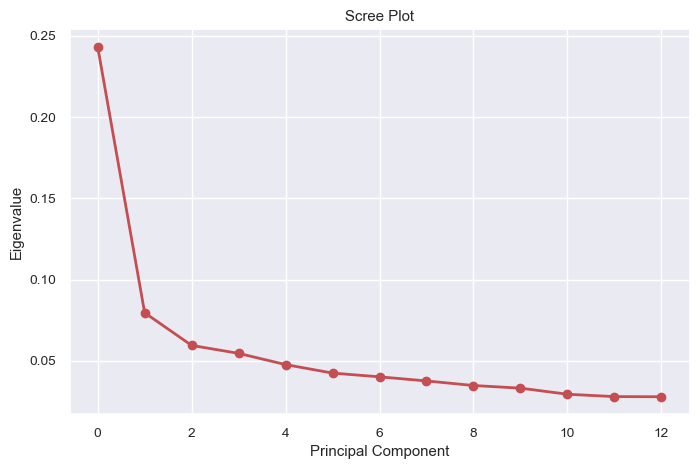

In [100]:
fig = plt.figure(figsize=(8, 5))

plt.plot(pca.explained_variance_ratio_, "ro-", linewidth=2)
plt.title("Scree Plot")
plt.xlabel("Principal Component")
plt.ylabel("Eigenvalue")

plt.show()

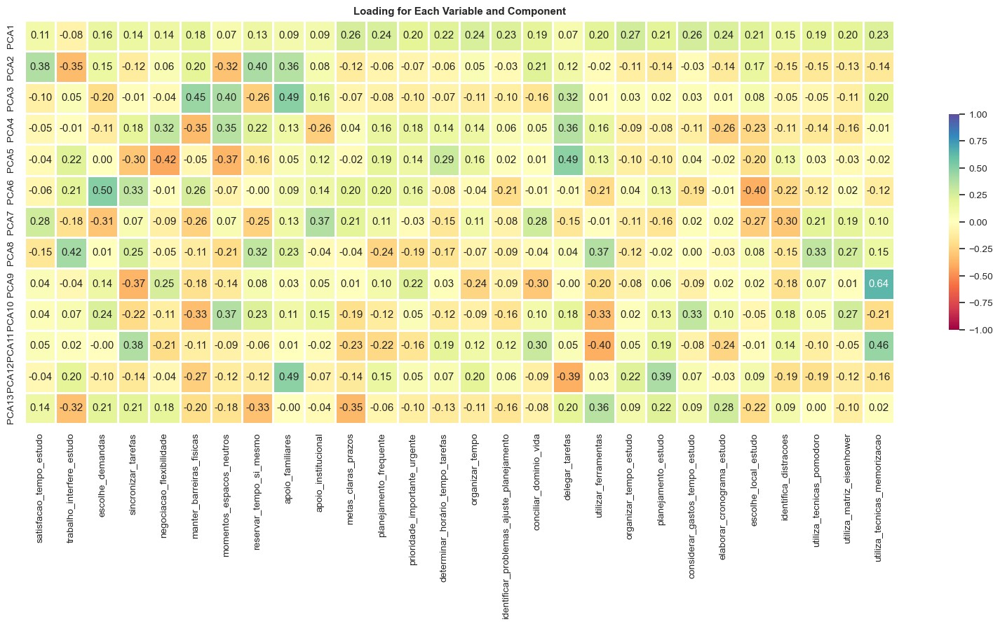

In [101]:
fig, ax = plt.subplots(figsize=(20, 10))

ax = sns.heatmap(
    pca.components_,
    cmap="Spectral",
    yticklabels=[f"PCA{x}" for x in range(1, pca.n_components_ + 1)],
    xticklabels=list(df_encoded_numérico[var_escala_likert_lista].columns),
    linewidths=1,
    annot=True,
    fmt=",.2f",
    vmax=1,
    vmin=-1,
    cbar_kws={"shrink": 0.4, "orientation": "vertical"},
)

ax.set_aspect("equal")
plt.title("Loading for Each Variable and Component", weight="bold")
plt.show()

## Clusterização

Será utilizado 3 algoritmos diferentes:

* K-prototypes
* Hierarchial Clusterisng com Distância de Gower
* DBSCAN com Distância de Gower

Avaliar quais deles tem melhor desempenho

In [102]:
# Verificando a quantidade de cluster a selecionar
custo = []

# Pegando as variáveis categóricas
coluna_categorica = df_encoded_numérico.columns.to_list()
coluna_categorica.remove("horas_trabalho")

# Pegando as posições de cada um
posicao = [df_encoded_numérico.columns.get_loc(coluna) for coluna in coluna_categorica]

# Registrando o valor de custo de cada K para criar uma curva de elbow
for k in np.arange(1, 10):
    kprototype = KPrototypes(n_clusters=k, random_state=42)
    kprototype.fit_predict(df_encoded_numérico, categorical=posicao)
    custo.append(kprototype.cost_)

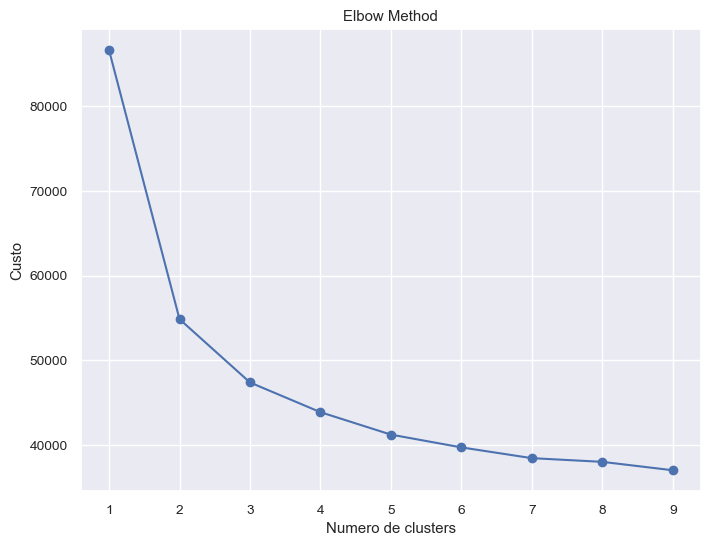

In [103]:
# Plotando um gráfico de elbow curve para ver qual é melhor número de clusters

plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, 10), custo, "-o")
plt.title("Elbow Method")
plt.xlabel("Numero de clusters")
plt.ylabel("Custo")

# 3 clusters parece ser melhor
plt.show()

In [104]:
# Aplicando as trasnformações
df_encoded_numérico_cluster_kprototype = df_encoded_numérico.copy()
n_clusters = 3

kprototype = KPrototypes(n_clusters=n_clusters, random_state=42)
df_encoded_numérico_cluster_kprototype["Cluster"] = kprototype.fit_predict(
    df_encoded_numérico, categorical=posicao
)

df_encoded_numérico_cluster_kprototype["Cluster"] = (
    df_encoded_numérico_cluster_kprototype["Cluster"].astype("category")
)

In [105]:
df_encoded_numérico_cluster_kprototype

,ano_ingresso,Idade_Codificada,renda_familiar,horas_trabalho,exp_profissional,tempo_deslocamento,horas_estudo,satisfacao_tempo_estudo,trabalho_interfere_estudo,escolhe_demandas,sincronizar_tarefas,negociacao_flexibilidade,manter_barreiras_fisicas,momentos_espacos_neutros,reservar_tempo_si_mesmo,apoio_familiares,apoio_institucional,metas_claras_prazos,planejamento_frequente,prioridade_importante_urgente,determinar_horário_tempo_tarefas,organizar_tempo,identificar_problemas_ajuste_planejamento,conciliar_dominio_vida,delegar_tarefas,utilizar_ferramentas,organizar_tempo_estudo,planejamento_estudo,considerar_gastos_tempo_estudo,elaborar_cronograma_estudo,escolhe_local_estudo,identifica_distracoes,utiliza_tecnicas_pomodoro,utiliza_matriz_eisenhower,utiliza_tecnicas_memorizacao,situacao_profissional,Turno,modalidade_curso,forma_ingresso,Gênero,estado_civil,Cor_Etnia,forma_atividade,tipo_IES,Cluster
0,0,1,4,50.0,2,2,0,0,4,3,2,4,3,4,3,3,0,1,2,2,3,1,3,1,0,2,3,3,1,0,2,1,0,0,0,4,1,1,1,0,2,2,0,1,0
1,1,0,4,30.0,0,1,0,2,1,0,4,3,0,4,2,3,0,4,3,2,1,2,3,1,3,4,1,2,0,2,3,0,2,2,2,1,1,1,0,2,2,1,1,1,1
2,1,0,3,30.0,0,3,0,1,2,1,3,4,1,2,3,3,1,2,3,3,3,2,2,2,1,1,2,3,2,1,1,1,1,2,3,1,0,1,1,2,2,3,1,1,1
3,0,0,2,47.0,2,1,0,0,4,3,3,1,1,3,3,4,0,1,2,1,1,2,1,3,4,1,0,2,0,0,0,1,0,2,0,4,1,1,0,0,2,1,0,1,0
4,1,0,4,44.0,2,0,0,0,4,1,4,3,0,4,3,1,0,3,3,3,1,1,1,0,3,4,3,3,0,0,0,0,3,0,3,4,1,1,0,2,2,1,0,1,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,3,3,3,44.0,2,4,2,3,3,3,1,2,1,1,3,1,1,3,3,3,3,3,3,3,1,2,3,2,2,1,3,3,1,1,1,3,1,2,0,0,3,1,1,0,0
237,2,0,1,45.0,2,0,0,0,3,0,1,2,1,3,3,1,1,1,3,3,1,1,3,2,1,1,2,2,1,2,1,2,2,2,2,4,1,2,0,2,2,3,1,0,0
238,2,0,1,24.0,0,4,0,1,3,1,1,3,0,2,1,2,2,1,3,3,2,1,3,0,2,2,2,2,2,3,3,2,2,1,1,3,0,1,0,2,3,3,1,1,1
239,2,3,2,30.0,2,4,2,3,0,3,1,3,3,3,2,3,2,3,3,3,3,3,3,3,1,3,3,3,3,3,3,3,3,1,3,2,0,1,0,2,3,3,1,1,1


In [106]:
df_encoded_numérico_cluster_kprototype["Cluster"].value_counts()

Cluster
0    120
1     67
2     54
Name: count, dtype: int64

In [107]:
## Verificando
df_encoded_numérico_cluster_kprototype[
    [
        "satisfacao_tempo_estudo",
        "trabalho_interfere_estudo",
        "escolhe_demandas",
        "sincronizar_tarefas",
        "negociacao_flexibilidade",
        "manter_barreiras_fisicas",
        "momentos_espacos_neutros",
        "reservar_tempo_si_mesmo",
        "apoio_familiares",
        "apoio_institucional",
        "metas_claras_prazos",
        "planejamento_frequente",
        "prioridade_importante_urgente",
        "determinar_horário_tempo_tarefas",
        "organizar_tempo",
        "identificar_problemas_ajuste_planejamento",
        "conciliar_dominio_vida",
        "delegar_tarefas",
        "utilizar_ferramentas",
        "organizar_tempo_estudo",
        "planejamento_estudo",
        "considerar_gastos_tempo_estudo",
        "elaborar_cronograma_estudo",
        "escolhe_local_estudo",
        "identifica_distracoes",
        "utiliza_tecnicas_pomodoro",
        "utiliza_matriz_eisenhower",
        "utiliza_tecnicas_memorizacao",
        "Cluster",
    ]
].groupby("Cluster").apply(lambda x: x.apply(pd.Series.value_counts)).fillna(0).astype(
    int
)

satisfacao_tempo_estudo  trabalho_interfere_estudo  \
Cluster                                                         
0       0                       44                          2   
        1                       43                         16   
        2                       18                          8   
        3                       15                         49   
        4                        0                         45   
1       0                       20                          7   
        1                       28                         12   
        2                       11                         11   
        3                        7                         30   
        4                        1                          7   
2       0                       16                          6   
        1                       15                          6   
        2                        9                         12   
        3                        8                         21   
        4                        6                          9   

           escolhe_demandas  sincronizar_tarefas  negociacao_flexibilidade  \
Cluster                                                                      
0       0                12                    6                        13   
        1                28                   28                        22   
        2                26                   17                        25   
        3                39                   46                        42   
        4                15                   23                        18   
1       0                 7                    7                         4   
        1                15                   21                         8   
        2                11                    6                        12   
        3                24                   24                        34   
        4                10                    9                         9   
2       0                 5                    2                         4   
        1                11                    7                         8   
        2                 9                    9                        13   
        3                22                   26                        21   
        4                 7                   10                         8   

           manter_barreiras_fisicas  momentos_espacos_neutros  \
Cluster                                                         
0       0                        23                        12   
        1                        32                        17   
        2                        14                        13   
        3                        39                        50   
        4                        12                        28   
1       0                        22                        10   
        1                        13                        11   
        2                         6                         8   
        3                        19                        21   
        4                         7                        17   
2       0                         8                         8   
        1                         9                         9   
        2                         9                         6   
        3                        19                        20   
        4                         9                        11   

           reservar_tempo_si_mesmo  apoio_familiares  apoio_institucional  \
Cluster                                                                     
0       0                       15                13                   65   
        1                       28                25                   33   
        2                       18                14                   14   
        3                       36                43                    3   
        4 

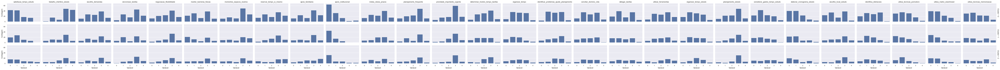

In [108]:
# Plotando vários gráficos
df_encoded_numérico_cluster_kprototype_melt = (
    df_encoded_numérico_cluster_kprototype.melt(
        id_vars=["Cluster"],
        value_vars=var_escala_likert_lista,
        var_name="Variável",
        value_name="Respostas",
    )
)


g = sns.FacetGrid(
    df_encoded_numérico_cluster_kprototype_melt,
    row="Cluster",
    col="Variável",
    height=2,
    aspect=1.5,
    margin_titles=True,
)

# Adicionar os gráficos de barras
g.map(
    sns.countplot,
    "Respostas",
    order=df_encoded_numérico_cluster_kprototype_melt["Respostas"]
    .value_counts()
    .sort_index()
    .index.to_list(),
)

# Ajustar o layout
g.set_axis_labels("Variável", "Contagem")
g.set_titles("Cluster: {row_name}", col_template="{col_name}")
g.tight_layout(pad=1.0)

plt.show()

In [109]:
## Verificando as horas de trabalho
df_encoded_numérico_cluster_kprototype[["Cluster", "horas_trabalho"]].groupby(
    "Cluster"
).apply(lambda x: x.apply(pd.Series.mean)).fillna(0)

,horas_trabalho
Cluster,
0,44.845976
1,29.298507
2,13.444444


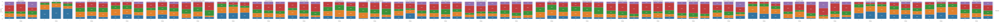

In [110]:
## Verificando as características de cada cluster

# Verificando a escala de likert
# Paleta de cores personalizadas
cores = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Transformar o DataFrame para o formato "long"
df_long = df_encoded_numérico_cluster_kprototype.reset_index(drop=True).melt(
    id_vars=["Cluster"],
    value_vars=var_escala_likert_lista,
    var_name="Variavel",
    value_name="Resposta",
)

# Calcular as proporções
proportions = (
    df_long.groupby(["Cluster", "Variavel", "Resposta"])
    .size()
    .reset_index(name="Count")
)

# Calcular as proporções dentro de cada grupo Cluster-Variavel
proportions["Proporcao"] = proportions.groupby(["Cluster", "Variavel"])[
    "Count"
].transform(lambda x: x / x.sum())

# Criar o FacetGrid
g = sns.FacetGrid(proportions, col="Variavel", height=4, aspect=1.5, sharey=True)


# Função para criar as barras empilhadas com rótulos de porcentagem
def stacked_barplot(data, color=cores, **kwargs):
    # Ordenar as respostas para manter consistência nas cores
    respostas_ordenadas = sorted(data["Resposta"].unique())

    # Definir cores para cada resposta
    color_dict = dict(zip(respostas_ordenadas, cores[: len(respostas_ordenadas)]))

    clusters = sorted(data["Cluster"].unique())
    bottom = pd.Series(0, index=clusters)

    for resposta in respostas_ordenadas:
        subset = data[data["Resposta"] == resposta]
        ax = plt.gca()

        # Plotar barras com cores personalizadas
        bars = sns.barplot(
            x="Cluster",
            y="Proporcao",
            data=subset,
            color=color_dict[resposta],
            bottom=bottom[subset["Cluster"].values],
            **kwargs,
        )

        # Adicionar rótulos de porcentagem
        for i, cluster in enumerate(subset["Cluster"]):
            altura = subset[subset["Cluster"] == cluster]["Proporcao"].values[0]
            pos_y = bottom[cluster] + altura / 2

            # Formatar a porcentagem
            porcentagem = f"{altura*100:.1f}%"

            # Adicionar rótulo com condição de visibilidade
            if altura > 0.05:  # Só mostra se a barra for maior que 5%
                ax.text(
                    i,
                    pos_y,
                    porcentagem,
                    ha="center",
                    va="center",
                    color="white",
                    fontweight="bold",
                    fontsize=8,
                )

        # Atualizar a base para a próxima barra
        bottom[subset["Cluster"].values] += subset["Proporcao"].values

    # Rotacionar os rótulos do eixo x para melhor legibilidade
    plt.xticks(rotation=0, ha="right")


# Aplicar o plot personalizado
g.map_dataframe(stacked_barplot)

# Ajustar os rótulos e títulos
g.set_axis_labels("Cluster", "Proporção")
g.set_titles(col_template="{col_name}")
g.fig.subplots_adjust(hspace=0.4, wspace=0.2, bottom=0.2)

# Adicionar a legenda
g.add_legend(title="Resposta", bbox_to_anchor=(1, 0.5), loc="center left")

plt.tight_layout()
plt.show()

In [111]:
# Função para calcular proporções
def calcular_proporcoes(df):
    contagem = (
        df.groupby(["Cluster", "Variavel", "Resposta"]).size().reset_index(name="Count")
    )
    proporcoes = (
        contagem.groupby(["Cluster", "Variavel"])
        .apply(lambda x: x.assign(Proporcao=x["Count"] / x["Count"].sum()))
        .reset_index(drop=True)
    )
    return proporcoes


# Função ajustada para trabalhar com map_dataframe
def plot_stacked_bars(data, **kwargs):
    # Pegar a variável do primeiro registro
    variable = data["Variavel"].iloc[0]

    # Ordenar respostas
    respostas_ordenadas = sorted(data["Resposta"].unique())
    clusters = sorted(data["Cluster"].unique())

    # Criar o plot
    ax = plt.gca()
    bottom = np.zeros(len(clusters))

    for i, resposta in enumerate(respostas_ordenadas):
        mask = data["Resposta"] == resposta
        heights = data[mask].set_index("Cluster")["Proporcao"]

        # Garantir que temos valores para todos os clusters
        heights = heights.reindex(clusters, fill_value=0)

        ax.bar(
            clusters,
            heights,
            bottom=bottom,
            label=resposta,
            color=cores[i % len(cores)],
        )
        bottom += heights.values

    # Formatar o gráfico
    ax.set_xlabel("Cluster")
    ax.set_ylabel("Proporção")


# Paleta de cores personalizadas
cores = ["#1f77b4", "#ff7f0e", "#2ca02c", "#d62728", "#9467bd", "#8c564b"]

# Lista de variáveis para decodificar
variaveis_para_decodificar = [
    "ano_ingresso",
    "Idade_Codificada",
    "renda_familiar",
    "exp_profissional",
    "tempo_deslocamento",
    "horas_estudo",
    "situacao_profissional",
    "Turno",
    "modalidade_curso",
    "forma_ingresso",
    "Gênero",
    "estado_civil",
    "Cor_Etnia",
    "forma_atividade",
    "tipo_IES",
]


### K-prototypes (Versão Fatorial)

In [112]:
# Verificando a quantidade de cluster a selecionar
custo = []

# Pegando as variáveis categóricas
coluna_categorica = df_fa_likert.columns.to_list()


# Lista de colunas a serem removidas
colunas_para_remover = [
    "horas_trabalho",
    "FA1_planejamento_priorizacao",
    "FA2_ferramentas_estudo",
    "FA3_planejamento_organizacao_estudo",
    "FA4_satisfacao_interferencia_estudo",
    "FA5_escolhe_local_estudo",
    "FA6_det_horario_iden_distracoes",
    "FA7_apoio_familiar_delega_tarefa",
    "FA8_apoio_institucional",
    "FA9_sincronizar_tarefas",
    "FA10_escolhe_demandas",
    "FA11_momentos_espacos_neutros",
    "FA12_organizar_tempo_conciliar_dominios",
    "FA13_elaborar_cronograma_estudo",
]

# Removendo as colunas
for coluna in colunas_para_remover:
    if coluna in coluna_categorica:
        coluna_categorica.remove(coluna)


# Pegando as posições de cada um
posicao = [df_fa_likert.columns.get_loc(coluna) for coluna in coluna_categorica]

# Registrando o valor de custo de cada K para criar uma curva de elbow
for k in np.arange(1, 10):
    kprototype = KPrototypes(n_clusters=k, random_state=42)
    kprototype.fit_predict(df_fa_likert, categorical=posicao)
    custo.append(kprototype.cost_)

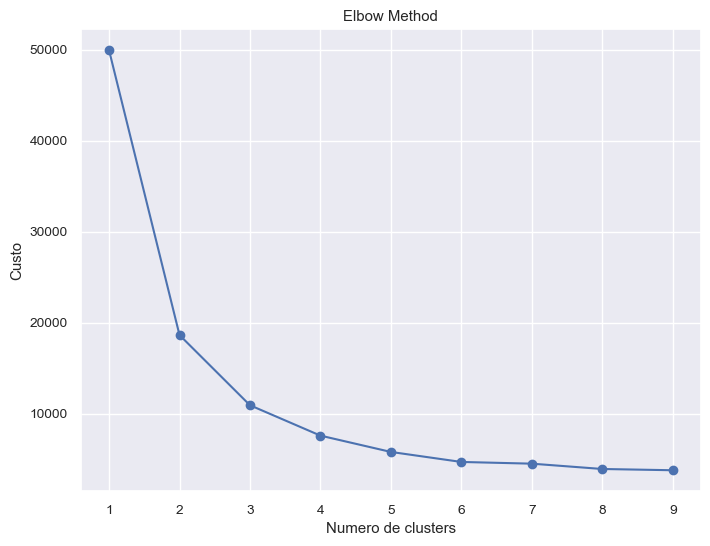

In [113]:
# Plotando um gráfico de elbow curve para ver qual é melhor número de clusters

plt.figure(figsize=(8, 6))
plt.plot(np.arange(1, 10), custo, "-o")
plt.title("Elbow Method")
plt.xlabel("Numero de clusters")
plt.ylabel("Custo")

plt.show()
# 3 clusters parece ser melhor

In [114]:
# Aplicando as trasnformações
df_fa_likert_cluster_kprototype = df_fa_likert.copy()
n_clusters = 3

kprototype = KPrototypes(n_clusters=n_clusters, random_state=42)
df_fa_likert_cluster_kprototype["Cluster"] = kprototype.fit_predict(
    df_fa_likert, categorical=posicao
)

df_fa_likert_cluster_kprototype["Cluster"] = df_fa_likert_cluster_kprototype[
    "Cluster"
].astype("category")

In [115]:
df_fa_likert_cluster_kprototype

,ano_ingresso,Idade_Codificada,renda_familiar,horas_trabalho,exp_profissional,tempo_deslocamento,horas_estudo,situacao_profissional,Turno,modalidade_curso,forma_ingresso,Gênero,estado_civil,Cor_Etnia,forma_atividade,tipo_IES,FA1_planejamento_priorizacao,FA2_ferramentas_estudo,FA3_planejamento_organizacao_estudo,FA4_satisfacao_interferencia_estudo,FA5_escolhe_local_estudo,FA6_det_horario_iden_distracoes,FA7_apoio_familiar_delega_tarefa,FA8_apoio_institucional,FA9_sincronizar_tarefas,FA10_escolhe_demandas,FA11_momentos_espacos_neutros,FA12_organizar_tempo_conciliar_dominios,FA13_elaborar_cronograma_estudo,Cluster
0,0,1,4,50.0,2,2,0,4,1,1,1,0,2,2,0,1,-0.205203,-1.385281,1.457042,-0.459411,0.345575,-0.136218,0.081861,-0.632766,0.614586,0.157513,0.327472,-0.991931,-0.851844,0
1,1,0,4,30.0,0,1,0,1,1,1,0,2,2,1,1,1,0.199967,1.047698,-1.012100,0.682924,0.872720,-1.366150,-0.024161,-0.683632,0.986067,-1.615866,0.764233,-0.230413,0.539755,2
2,1,0,3,30.0,0,3,0,1,0,1,1,2,2,3,1,1,0.566383,0.049070,0.279265,0.412399,-0.899380,-0.536668,-0.077334,-0.005532,0.095087,-0.222116,0.544354,-0.101601,-0.496883,2
3,0,0,2,47.0,2,1,0,4,1,1,0,0,2,1,0,1,-1.031554,-0.611457,-1.015759,-0.863651,-1.251145,-0.342215,1.165480,-0.221741,0.851174,0.779024,-0.018739,1.597672,-0.241214,0
4,1,0,4,44.0,2,0,0,4,1,1,0,2,2,1,0,1,0.400186,0.601043,0.525520,-1.161962,-1.309271,-1.712092,-0.027829,-0.963086,0.976373,-0.414176,0.874856,-1.125841,-0.161444,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
236,3,3,3,44.0,2,4,2,3,1,2,0,0,3,1,1,0,0.655038,-0.274467,0.475633,0.916878,0.519491,0.888523,-0.864688,0.035254,-0.634856,0.071417,-1.095646,0.823473,-0.456468,0
237,2,0,1,45.0,2,0,0,4,1,2,0,2,2,3,1,0,0.272643,0.690560,-0.354453,-0.383437,-0.828140,0.140802,-1.040226,0.083220,-0.864447,-0.680922,0.679093,-0.096567,0.110915,0
238,2,0,1,24.0,0,4,0,3,0,1,0,2,3,3,1,1,0.361167,0.774607,0.069878,-0.220184,0.627952,0.179179,-0.483685,0.371734,-1.556802,-0.866571,0.079173,-1.021385,0.387886,2
239,2,3,2,30.0,2,4,2,2,0,1,0,2,3,3,1,1,0.443172,0.787578,0.658069,1.616415,0.059629,0.769210,0.025056,0.933355,-0.575601,-0.452415,-0.092441,-0.047270,0.665023,2


In [116]:
df_fa_likert_cluster_kprototype["Cluster"].value_counts()

Cluster
0    122
2     91
1     28
Name: count, dtype: int64

In [117]:
## Verificando
df_fa_likert_cluster_kprototype[
    [
        "FA1_planejamento_priorizacao",
        "FA2_ferramentas_estudo",
        "FA3_planejamento_organizacao_estudo",
        "FA4_satisfacao_interferencia_estudo",
        "FA5_escolhe_local_estudo",
        "FA6_det_horario_iden_distracoes",
        "FA7_apoio_familiar_delega_tarefa",
        "FA8_apoio_institucional",
        "FA9_sincronizar_tarefas",
        "FA10_escolhe_demandas",
        "FA11_momentos_espacos_neutros",
        "FA12_organizar_tempo_conciliar_dominios",
        "FA13_elaborar_cronograma_estudo",
        "Cluster",
    ]
].groupby("Cluster").apply(lambda x: x.apply(pd.Series.value_counts)).fillna(0).astype(
    int
)

FA1_planejamento_priorizacao  FA2_ferramentas_estudo  \
Cluster                                                                   
0       -2.345485                             1                       0   
        -2.086191                             0                       0   
        -2.030743                             0                       0   
        -2.018720                             0                       0   
        -1.992874                             1                       0   
...                                         ...                     ...   
2        2.504504                             0                       0   
         2.574337                             0                       0   
         2.744242                             0                       0   
         2.749609                             0                       0   
         2.851286                             0                       0   

                   FA3_planejamento_organizacao_estudo  \
Cluster                                                  
0       -2.345485                                    0   
        -2.086191                                    0   
        -2.030743                                    0   
        -2.018720                                    1   
        -1.992874                                    0   
...                                                ...   
2        2.504504                                    0   
         2.574337                                    0   
         2.744242                                    0   
         2.749609                                    0   
         2.851286                                    0   

                   FA4_satisfacao_interferencia_estudo  \
Cluster                                                  
0       -2.345485                                    0   
        -2.086191                                    0   
        -2.030743                                    0   
        -2.018720                                    0   
        -1.992874                                    0   
...                                                ...   
2        2.504504                                    1   
         2.574337                                    1   
         2.744242                                    0   
         2.749609                                    0   
         2.851286                                    0   

                   FA5_escolhe_local_estudo  FA6_det_horario_iden_distracoes  \
Cluster                                                                        
0       -2.345485                         0                                0   
        -2.086191                         0                                0   
        -2.030743                         0                                0   
        -2.018720                         0                                0   
        -1.992874                         0                                0   
...                                     ...                              ...   
2        2.504504                         0                                0   
         2.574337                         0                                0   
         2.744242                         0                                0   
         2.749609                         0                                0   
         2.851286                         0                                0   

                   FA7_apoio_familiar_delega_tarefa  FA8_apoio_institucional  \
Cluster                                                                        
0       -2.345485                                 0                        0   
        -2.086191                                 0                        0   
        -2.030743                                 0                        0   
        -2.018720                                 0                        0   
        -1.9

In [118]:
# Criando um resumo de média
df_fa_likert_cluster_kprototype[
    [
        "FA1_planejamento_priorizacao",
        "FA2_ferramentas_estudo",
        "FA3_planejamento_organizacao_estudo",
        "FA4_satisfacao_interferencia_estudo",
        "FA5_escolhe_local_estudo",
        "FA6_det_horario_iden_distracoes",
        "FA7_apoio_familiar_delega_tarefa",
        "FA8_apoio_institucional",
        "FA9_sincronizar_tarefas",
        "FA10_escolhe_demandas",
        "FA11_momentos_espacos_neutros",
        "FA12_organizar_tempo_conciliar_dominios",
        "FA13_elaborar_cronograma_estudo",
        "Cluster",
    ]
].groupby("Cluster").apply(lambda x: x.apply(pd.Series.mean)).fillna(0)

,FA1_planejamento_priorizacao,FA2_ferramentas_estudo,FA3_planejamento_organizacao_estudo,FA4_satisfacao_interferencia_estudo,FA5_escolhe_local_estudo,FA6_det_horario_iden_distracoes,FA7_apoio_familiar_delega_tarefa,FA8_apoio_institucional,FA9_sincronizar_tarefas,FA10_escolhe_demandas,FA11_momentos_espacos_neutros,FA12_organizar_tempo_conciliar_dominios,FA13_elaborar_cronograma_estudo
Cluster,,,,,,,,,,,,,
0,0.040760,0.061025,-0.074057,-0.166671,-0.200024,0.017778,0.049851,0.043614,0.066272,-0.077333,-0.020104,0.124657,-0.050382
1,0.011512,0.245387,0.234435,-0.101462,0.256329,0.347239,0.242970,0.050896,0.057771,-0.040983,0.121463,-0.050078,0.197156
2,-0.058187,-0.157318,0.027152,0.254669,0.189294,-0.130677,-0.141593,-0.074132,-0.106623,0.116287,-0.010420,-0.151714,0.006882


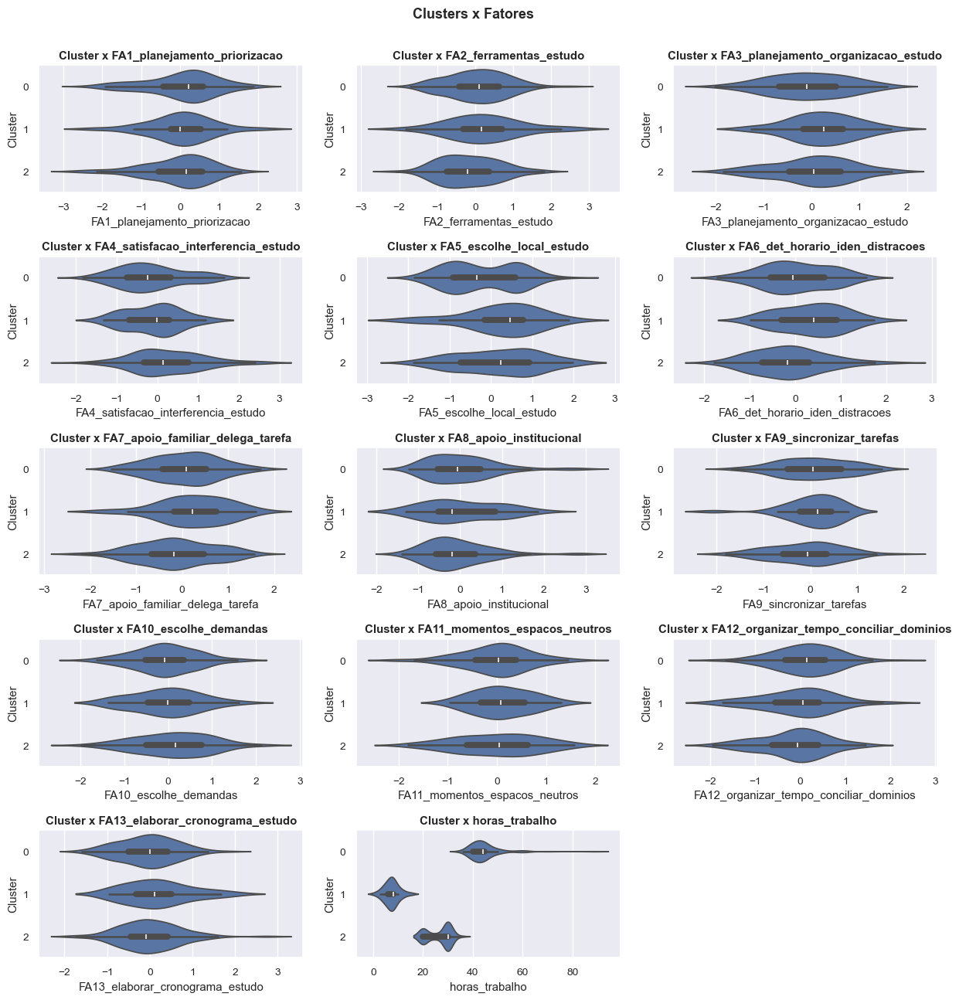

In [119]:
factor_list = [
    "FA1_planejamento_priorizacao",
    "FA2_ferramentas_estudo",
    "FA3_planejamento_organizacao_estudo",
    "FA4_satisfacao_interferencia_estudo",
    "FA5_escolhe_local_estudo",
    "FA6_det_horario_iden_distracoes",
    "FA7_apoio_familiar_delega_tarefa",
    "FA8_apoio_institucional",
    "FA9_sincronizar_tarefas",
    "FA10_escolhe_demandas",
    "FA11_momentos_espacos_neutros",
    "FA12_organizar_tempo_conciliar_dominios",
    "FA13_elaborar_cronograma_estudo",
    "horas_trabalho",
]
x_var = "Cluster"
# Calcular o número de linhas necessárias
n_plots = len(factor_list)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

# Criar a figura com o novo número de linhas
fig = plt.figure(figsize=(15, 15))
plt.suptitle("Clusters x Fatores", weight="bold", y=0.93)

# Calcular as posições dos subplots
for i, t in enumerate(factor_list):
    # Calcular a posição do subplot
    row = i // n_cols
    col = i % n_cols
    
    # Se for um dos dois últimos plots e sobrar espaço
    if i >= n_plots - 2 and n_plots % n_cols != 0:
        # Centralizar os últimos plots
        offset = (n_cols - (n_plots % n_cols)) // 2
        col += offset
    
    # Criar o subplot na posição calculada
    ax = plt.subplot(n_rows, n_cols, row * n_cols + col + 1)
    
    sns.violinplot(
        data=df_fa_likert_cluster_kprototype,
        y=x_var,
        x=t,
        orient="h",
        ax=ax
    )
    ax.set_title(f"Cluster x {t}", weight="bold")

plt.subplots_adjust(hspace=0.5)


plt.savefig("Clusters_Fatores.svg",
            bbox_inches='tight')



plt.show()

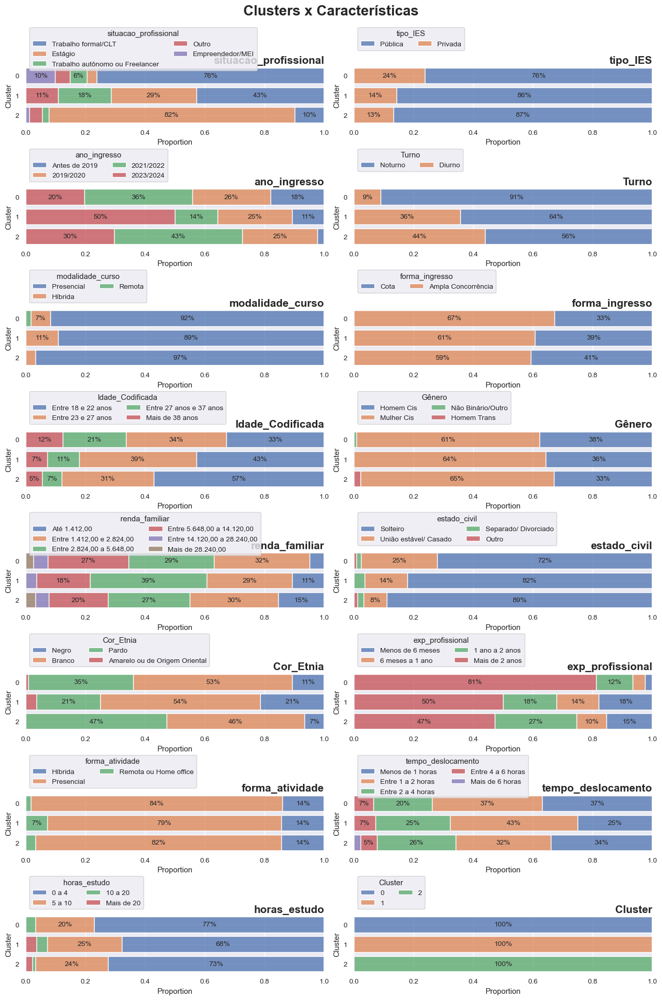

In [121]:
caracteristica_list = [
    "situacao_profissional",
    "tipo_IES",
    "ano_ingresso",
    "Turno",
    "modalidade_curso",
    "forma_ingresso",
    "Idade_Codificada",
    "Gênero",
    "renda_familiar",
    "estado_civil",
    "Cor_Etnia",
    "exp_profissional",
    "forma_atividade",
    "tempo_deslocamento",
    "horas_estudo",
    "Cluster",
]

#Criando um DF contendo as informações dos fatores e dos clusters

df_decodificado_cluster_kprototype = pd.concat(
    [df_decodificado,
     df_fa_likert_cluster_kprototype[[
        "FA1_planejamento_priorizacao",
        "FA2_ferramentas_estudo",
        "FA3_planejamento_organizacao_estudo",
        "FA4_satisfacao_interferencia_estudo",
        "FA5_escolhe_local_estudo",
        "FA6_det_horario_iden_distracoes",
        "FA7_apoio_familiar_delega_tarefa",
        "FA8_apoio_institucional",
        "FA9_sincronizar_tarefas",
        "FA10_escolhe_demandas",
        "FA11_momentos_espacos_neutros",
        "FA12_organizar_tempo_conciliar_dominios",
        "FA13_elaborar_cronograma_estudo",
        "Cluster",
    ]]],
    axis=1
)

# Criar subplots organizados em uma grade
fig, axes = plt.subplots(8, 2, figsize=(13, 20))
axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle("Clusters x Características", weight="bold", y = 0.97,
            fontsize = 20)

# Iterar sobre as características e criar os gráficos
for i, t in enumerate(caracteristica_list):
    ax = axes[i]  # Selecionar o eixo correspondente
    sns.histplot(
        data=df_decodificado_cluster_kprototype,
        y="Cluster",  # Usar "Cluster" no eixo x
        hue=t,  # Cor com base na característica atual
        multiple="fill",
        stat="proportion",
        discrete=True,
        shrink=0.8,
        ax=ax,  # Especificar o eixo atual
    )

    # Adicionar título ao gráfico0
    ax.set_title(t, fontsize=15, weight="bold",loc ="right")


    # Adicionando legenda
    legend = ax.get_legend()
    handles = legend.legend_handles
    labels = legend.texts

    lista_rótulo = []
    
    for rótulo in labels:
        rótulo = rótulo._text
        lista_rótulo.append(rótulo)
#    print(legend,handles, lista_rótulo)


    ax.legend(
        handles = handles,
        labels = lista_rótulo,
        title = t,
         bbox_to_anchor=(0, 1.8),  # Posição da legenda (fora do eixo atual)
        loc = "upper left",
        ncol = 2
    )

# Adicionar rótulos de proporção às barras (esconder rótulos muito pequenos)
    # Adicionar rótulos de proporção às barras
    for container in ax.containers:
        ax.bar_label(
            container,
            labels=[f"{v:.0%}" if v > 0.05 else "" for v in container.datavalues],
            label_type="center",
            fontsize=10,
            padding=0,
        )

# Ajustar o layout e espaçamento
plt.tight_layout()
plt.subplots_adjust(hspace=1.2, wspace=0.1)

plt.savefig("Clusters_variavel.svg",
            bbox_inches='tight')




plt.show()

# Testes estatísticas

## Teste Qui-Quadrado

In [122]:
# %% Teste Qui-Quadrado

# Kruskal Wallis
# Intervalo de Confiança = 95% ou 0,95

# H0 = As variáveis não possuem associações entre eles
# H1 = As variáveis  possuem associações entre eles

# Se p<0,05 -> Rejeita H0, logo há associação significativa entre grupos
# Se p>0,05 -> Não rejeita H0, logo NÃO há associação significativa entre grupos

ano_ingresso
chi2 = 24.11734697313,
valor-p:0.019606154180711714,
significância:True


Turno
chi2 = 24.1912075624335,
valor-p:7.312595471598383e-05,
significância:True


Idade_Codificada
chi2 = 34.58850018136169,
valor-p:0.0005444198291617691,
significância:True


renda_familiar
chi2 = 44.631385946032246,
valor-p:0.0012377410694738966,
significância:True


horas_trabalho
chi2 = 434.82143076576733,
valor-p:4.771625146132573e-35,
significância:True


exp_profissional
chi2 = 48.46796561009531,
valor-p:2.5906654130321646e-06,
significância:True


forma_atividade
chi2 = 19.792019263240686,
valor-p:0.011152211507143083,
significância:True


horas_estudo
chi2 = 24.48763447964738,
valor-p:0.017446387876690214,
significância:True


trabalho_interfere_estudo
chi2 = 36.26415599942332,
valor-p:0.0026587337050753604,
significância:True




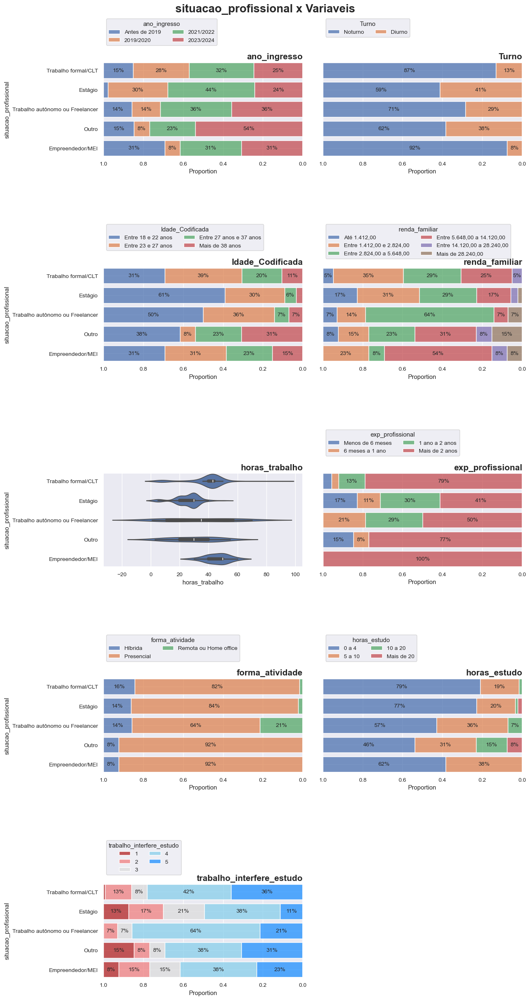

In [123]:
# Cruzando Situação Profissional x as variáveis (com DF Kprototype)
x = "situacao_profissional"
lista_var_significante = []
data = df_decodificado


for variavel in data.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        data, x, variavel
    )
    if significant == True and variavel != x:
        lista_var_significante.append(variavel)
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")



# Criar subplots organizados em uma grade
num_plots = len(lista_var_significante)
rows = (num_plots // 2) + (num_plots % 2)
fig, axes = plt.subplots(rows, 2,
                         figsize=(13, rows * 5),
                        sharey="all",
                        sharex = "none")


axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle(f"{x} x Variaveis", weight="bold", y = 0.97,
            fontsize = 20)

# Iterar sobre as características e criar os gráficos
for i, t in enumerate(lista_var_significante):
    ax = axes[i]  # Selecionar o eixo correspondente

# Se for em escala de Likert, faça isso
    if t in var_escala_likert_lista:
        palette = [
    "#ffffff00",
    "firebrick",
    "lightcoral",
    "gainsboro",
    "skyblue",
    "dodgerblue",
]
    else:
        palette = sns.color_palette()

    
    if data[t].dtype in ['category', 'object']:
        # Plot categorical data
        sns.histplot(
            data=data,
            y=x,
            hue=t,
            multiple="fill",
            stat="proportion",
            discrete=True,
            shrink=0.8,
            ax=ax,
            palette = palette
                )
        # Invertendo a ordem de ploting
        ax.xaxis.set_inverted(True)  # Invert X-axis
        ax.yaxis.set_inverted(True)  # Invert Y-axis
    else:
        # Plot numerical data
        sns.violinplot(
            data=data,
            x=t,
            y=x,
            ax=ax
            )
                # Invertendo a ordem de ploting
        ax.xaxis.set_inverted(False)  # Invert X-axis
        ax.yaxis.set_inverted(False)  # Invert Y-axis

    # Adicionar título ao gráfico0
    ax.set_title(t, fontsize=15, weight="bold",loc ="right")


    
    # Adicionando legenda
    if ax.get_legend():
        legend = ax.get_legend()
        handles = legend.legend_handles
        labels = legend.texts

        lista_rótulo = []
        
        for rótulo in labels:
            rótulo = rótulo._text
            lista_rótulo.append(rótulo)
    #    print(legend,handles, lista_rótulo)

        # Se for variável da lista de likert
        if t in var_escala_likert_lista:
            lista_rótulo.pop(0)
            handles.pop(0)
    
        ax.legend(
            handles = handles,
            labels = lista_rótulo,
            title = t,
             bbox_to_anchor=(0, 1.5),  # Posição da legenda (fora do eixo atual)
            loc = "upper left",
            ncol = 2
        )

# Adicionar rótulos de proporção às barras (esconder rótulos muito pequenos)
    # Adicionar rótulos de proporção às barras
    if data[t].dtype in ['category', 'object']:
        for container in ax.containers:
            ax.bar_label(
                container,
                labels=[f"{v:.0%}" if v > 0.05 else "" for v in container.datavalues],
                label_type="center",
                fontsize=10
            )

# Remover axes não utilizados
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar o layout e espaçamento
plt.tight_layout()
plt.subplots_adjust(hspace=1.2, wspace=0.1)
'''
plt.savefig("Clusters_variavel.svg",
            bbox_inches='tight')
'''
plt.show()

In [124]:
# Cruzando Tipo de IES x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "tipo_IES", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

tipo_IES
chi2 = 234.4598361825834,
valor-p:6.349891726499238e-53,
significância:True


Turno
chi2 = 6.861575986952156,
valor-p:0.008806883947041568,
significância:True


modalidade_curso
chi2 = 36.74754259799158,
valor-p:1.0480271006428908e-08,
significância:True


forma_ingresso
chi2 = 5.66327061338003,
valor-p:0.017323788983719675,
significância:True


Cor_Etnia
chi2 = 11.444390331376074,
valor-p:0.009550312635074276,
significância:True


satisfacao_tempo_estudo
chi2 = 10.161648899991503,
valor-p:0.037791005179693034,
significância:True


apoio_institucional
chi2 = 37.953538806535356,
valor-p:1.1455631112259075e-07,
significância:True


metas_claras_prazos
chi2 = 10.615081365747006,
valor-p:0.03124815853422653,
significância:True


determinar_horário_tempo_tarefas
chi2 = 10.415131809973456,
valor-p:0.033986324711297665,
significância:True


elaborar_cronograma_estudo
chi2 = 14.522092504503888,
valor-p:0.005802334120482778,
significância:True


identifica_distracoes
chi2 = 12.04325487

In [125]:
# Cruzando Ano de Ingresso x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "ano_ingresso", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 24.117346973130005,
valor-p:0.019606154180711752,
significância:True


ano_ingresso
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


Idade_Codificada
chi2 = 78.83293488104849,
valor-p:2.7551572514094466e-13,
significância:True


exp_profissional
chi2 = 28.55593295693726,
valor-p:0.0007697492301433134,
significância:True


forma_atividade
chi2 = 14.873385818942584,
valor-p:0.02126468109062194,
significância:True


tempo_deslocamento
chi2 = 24.632245605201877,
valor-p:0.016664969013094798,
significância:True


apoio_institucional
chi2 = 21.052573401870635,
valor-p:0.049615875377409,
significância:True


utilizar_ferramentas
chi2 = 22.795434814918714,
valor-p:0.02951369776345086,
significância:True


planejamento_estudo
chi2 = 21.035420688921132,
valor-p:0.049864169917656145,
significância:True




In [126]:
# Cruzando Turno x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(df_decodificado, "Turno", variavel)
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 24.191207562433505,
valor-p:7.312595471598373e-05,
significância:True


tipo_IES
chi2 = 6.861575986952156,
valor-p:0.008806883947041568,
significância:True


Turno
chi2 = 235.73931738987264,
valor-p:3.340093082723915e-53,
significância:True


estado_civil
chi2 = 11.839119774048054,
valor-p:0.007955086603142572,
significância:True


horas_trabalho
chi2 = 78.71112600164386,
valor-p:8.23016526189055e-06,
significância:True


exp_profissional
chi2 = 10.812803872407699,
valor-p:0.012782402827513443,
significância:True


horas_estudo
chi2 = 9.281083482148487,
valor-p:0.02577801042552887,
significância:True


elaborar_cronograma_estudo
chi2 = 10.965531455729902,
valor-p:0.02695413668226617,
significância:True


utiliza_matriz_eisenhower
chi2 = 10.297104094567086,
valor-p:0.035709610217633865,
significância:True




In [127]:
# Cruzando forma_ingresso x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "forma_ingresso", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

tipo_IES
chi2 = 5.66327061338003,
valor-p:0.017323788983719675,
significância:True


forma_ingresso
chi2 = 236.70550404305408,
valor-p:2.0562362064575002e-53,
significância:True


Gênero
chi2 = 11.444604079530999,
valor-p:0.009549368639828552,
significância:True


renda_familiar
chi2 = 37.23318269399168,
valor-p:5.378146246700144e-07,
significância:True


Cor_Etnia
chi2 = 36.97793320505377,
valor-p:4.6511117216234025e-08,
significância:True


tempo_deslocamento
chi2 = 11.410110074836483,
valor-p:0.022321759536315332,
significância:True


identificar_problemas_ajuste_planejamento
chi2 = 11.260894536118439,
valor-p:0.023783219621594697,
significância:True


conciliar_dominio_vida
chi2 = 12.119808185860446,
valor-p:0.016482227066707537,
significância:True


utiliza_matriz_eisenhower
chi2 = 10.372172801167132,
valor-p:0.03460407742177603,
significância:True




In [128]:
# Cruzando Idade x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "Idade_Codificada", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 34.58850018136168,
valor-p:0.0005444198291617692,
significância:True


ano_ingresso
chi2 = 78.83293488104849,
valor-p:2.7551572514094466e-13,
significância:True


Idade_Codificada
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


Gênero
chi2 = 17.629066809873116,
valor-p:0.03972920836087596,
significância:True


estado_civil
chi2 = 62.514176301748854,
valor-p:4.381698217537084e-10,
significância:True


exp_profissional
chi2 = 34.15631624445873,
valor-p:8.385858674673042e-05,
significância:True


sincronizar_tarefas
chi2 = 22.416902126890967,
valor-p:0.03310445486208012,
significância:True


apoio_institucional
chi2 = 31.7739240209405,
valor-p:0.001499368960710081,
significância:True


prioridade_importante_urgente
chi2 = 24.816402853841314,
valor-p:0.01571724834799324,
significância:True


utiliza_matriz_eisenhower
chi2 = 23.087299680656425,
valor-p:0.026993872317295376,
significância:True




In [129]:
# Cruzando Gênero x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(df_decodificado, "Gênero", variavel)
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

forma_ingresso
chi2 = 11.444604079530999,
valor-p:0.009549368639828552,
significância:True


Idade_Codificada
chi2 = 17.629066809873116,
valor-p:0.03972920836087596,
significância:True


Gênero
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


satisfacao_tempo_estudo
chi2 = 27.998196446000822,
valor-p:0.005535411415298647,
significância:True


elaborar_cronograma_estudo
chi2 = 26.308893040783225,
valor-p:0.00970359705741573,
significância:True


identifica_distracoes
chi2 = 31.57838402871725,
valor-p:0.001606823483945187,
significância:True


utiliza_matriz_eisenhower
chi2 = 27.75090731320276,
valor-p:0.006015264043005885,
significância:True




In [130]:
# Cruzando renda_familiar x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "renda_familiar", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 44.631385946032246,
valor-p:0.0012377410694738966,
significância:True


forma_ingresso
chi2 = 37.23318269399168,
valor-p:5.378146246700144e-07,
significância:True


renda_familiar
chi2 = 1205.0000000000002,
valor-p:1.5108185787243713e-238,
significância:True


Cor_Etnia
chi2 = 30.05022636346563,
valor-p:0.011741668045836432,
significância:True


horas_trabalho
chi2 = 201.80136736077202,
valor-p:0.01404236489344618,
significância:True


exp_profissional
chi2 = 26.592171147008866,
valor-p:0.03224031789805276,
significância:True


forma_atividade
chi2 = 24.236012868697554,
valor-p:0.0069979876599572995,
significância:True


horas_estudo
chi2 = 36.16996142733699,
valor-p:0.0016706617418294893,
significância:True


satisfacao_tempo_estudo
chi2 = 40.04644652836429,
valor-p:0.0049283051185053895,
significância:True


manter_barreiras_fisicas
chi2 = 34.689311746634914,
valor-p:0.021822799913059673,
significância:True


reservar_tempo_si_mesmo
chi2 = 37.234208664162

In [131]:
# Cruzando estado_civil x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "estado_civil", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

Turno
chi2 = 11.839119774048054,
valor-p:0.007955086603142572,
significância:True


Idade_Codificada
chi2 = 62.51417630174885,
valor-p:4.381698217537102e-10,
significância:True


estado_civil
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


reservar_tempo_si_mesmo
chi2 = 23.317965882771407,
valor-p:0.025144644683985688,
significância:True




In [132]:
# Cruzando Cor_Etnia x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "Cor_Etnia", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

tipo_IES
chi2 = 11.444390331376075,
valor-p:0.00955031263507427,
significância:True


forma_ingresso
chi2 = 36.977933205053766,
valor-p:4.651111721623419e-08,
significância:True


renda_familiar
chi2 = 30.050226363465633,
valor-p:0.01174166804583641,
significância:True


Cor_Etnia
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


horas_trabalho
chi2 = 135.8251172592843,
valor-p:0.004683470157630398,
significância:True


manter_barreiras_fisicas
chi2 = 28.01587595425091,
valor-p:0.0055025417989465605,
significância:True


apoio_institucional
chi2 = 29.857173882966762,
valor-p:0.002934010747324722,
significância:True


considerar_gastos_tempo_estudo
chi2 = 25.401440515075215,
valor-p:0.013031030919518034,
significância:True


utiliza_tecnicas_pomodoro
chi2 = 26.04903932689834,
valor-p:0.010563694467386416,
significância:True




In [133]:
# Cruzando horas_trabalho x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "horas_trabalho", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 434.8214307657673,
valor-p:4.7716251461327097e-35,
significância:True


Turno
chi2 = 78.71112600164386,
valor-p:8.23016526189055e-06,
significância:True


renda_familiar
chi2 = 201.80136736077202,
valor-p:0.01404236489344618,
significância:True


Cor_Etnia
chi2 = 135.8251172592843,
valor-p:0.004683470157630398,
significância:True


horas_trabalho
chi2 = 7712.000000000002,
valor-p:0.0,
significância:True


exp_profissional
chi2 = 157.28418540832928,
valor-p:8.074728157376865e-05,
significância:True


horas_estudo
chi2 = 210.16464716805143,
valor-p:1.6381881615959237e-10,
significância:True


apoio_institucional
chi2 = 171.13737375372497,
valor-p:0.0065278977552667445,
significância:True


considerar_gastos_tempo_estudo
chi2 = 160.88109833240043,
valor-p:0.026045819116388206,
significância:True


utiliza_tecnicas_pomodoro
chi2 = 174.4859940074237,
valor-p:0.003978021926592511,
significância:True




In [134]:
# Cruzando exp_profissional x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "exp_profissional", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 48.46796561009531,
valor-p:2.5906654130321646e-06,
significância:True


ano_ingresso
chi2 = 28.555932956937255,
valor-p:0.0007697492301433152,
significância:True


Turno
chi2 = 10.812803872407699,
valor-p:0.012782402827513443,
significância:True


Idade_Codificada
chi2 = 34.15631624445872,
valor-p:8.385858674673072e-05,
significância:True


renda_familiar
chi2 = 26.59217114700887,
valor-p:0.03224031789805269,
significância:True


horas_trabalho
chi2 = 157.28418540832925,
valor-p:8.074728157377091e-05,
significância:True


exp_profissional
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


satisfacao_tempo_estudo
chi2 = 22.821830464205775,
valor-p:0.02927719478922608,
significância:True


trabalho_interfere_estudo
chi2 = 21.81455526922681,
valor-p:0.03965153292232913,
significância:True


manter_barreiras_fisicas
chi2 = 21.89786467934629,
valor-p:0.03868057738651495,
significância:True


apoio_institucional
chi2 = 23.282886172469507,
valor-p:

In [135]:
# Cruzando forma_atividade x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "forma_atividade", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 19.792019263240686,
valor-p:0.011152211507143083,
significância:True


ano_ingresso
chi2 = 14.873385818942584,
valor-p:0.02126468109062194,
significância:True


renda_familiar
chi2 = 24.236012868697554,
valor-p:0.0069979876599572995,
significância:True


forma_atividade
chi2 = 482.0,
valor-p:5.234138705116962e-103,
significância:True




In [136]:
# Cruzando tempo_deslocamento x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "tempo_deslocamento", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

ano_ingresso
chi2 = 24.63224560520188,
valor-p:0.01666496901309477,
significância:True


forma_ingresso
chi2 = 11.410110074836485,
valor-p:0.022321759536315322,
significância:True


tempo_deslocamento
chi2 = 964.0,
valor-p:5.692440055104635e-195,
significância:True


satisfacao_tempo_estudo
chi2 = 35.00701142460701,
valor-p:0.003965526763095527,
significância:True


trabalho_interfere_estudo
chi2 = 29.39260816056931,
valor-p:0.021419294695006377,
significância:True


conciliar_dominio_vida
chi2 = 30.096724102942822,
valor-p:0.01750708317053871,
significância:True




In [137]:
# Cruzando horas_estudo x as variáveis (com DF Kprototype)

for variavel in df_decodificado.columns.to_list():
    chi2, p, significant = perform_chi_square_test(
        df_decodificado, "horas_estudo", variavel
    )
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 24.48763447964738,
valor-p:0.017446387876690214,
significância:True


Turno
chi2 = 9.281083482148485,
valor-p:0.025778010425528877,
significância:True


renda_familiar
chi2 = 36.16996142733699,
valor-p:0.0016706617418294893,
significância:True


horas_trabalho
chi2 = 210.16464716805146,
valor-p:1.638188161595901e-10,
significância:True


horas_estudo
chi2 = 723.0,
valor-p:7.843196149554227e-150,
significância:True


manter_barreiras_fisicas
chi2 = 27.05683737198275,
valor-p:0.007582906078689443,
significância:True


metas_claras_prazos
chi2 = 21.03185232608936,
valor-p:0.049915964398877626,
significância:True


identificar_problemas_ajuste_planejamento
chi2 = 25.711729371851977,
valor-p:0.01178787620409163,
significância:True


organizar_tempo_estudo
chi2 = 81.58428830189524,
valor-p:2.0563317245128506e-12,
significância:True


planejamento_estudo
chi2 = 29.300352573132866,
valor-p:0.0035547227150327927,
significância:True


elaborar_cronograma_estudo
chi2 

In [138]:
# Cruzando FA1_planejamento_priorizacao x as variáveis (com DF Kprototype)

for variavel in df_decodificado_cluster_kprototype.columns.to_list():
    chi2, p, significant = perform_chi_square_test(df_decodificado_cluster_kprototype, "Cluster", variavel)
    if significant == True:
        print(f"{variavel}\nchi2 = {chi2},\nvalor-p:{p},\nsignificância:{significant}")
        print("\n")

situacao_profissional
chi2 = 159.3640997532877,
valor-p:2.1722345040373417e-30,
significância:True


ano_ingresso
chi2 = 24.70066869340432,
valor-p:0.0003878842190929326,
significância:True


Turno
chi2 = 35.471809170404974,
valor-p:1.9833278352641788e-08,
significância:True


Idade_Codificada
chi2 = 18.514489572195952,
valor-p:0.00506721652848828,
significância:True


Cor_Etnia
chi2 = 12.725623955692136,
valor-p:0.047605977608990664,
significância:True


horas_trabalho
chi2 = 481.99999999999994,
valor-p:2.0990957896537335e-65,
significância:True


exp_profissional
chi2 = 33.24961184954879,
valor-p:9.387567255537432e-06,
significância:True


trabalho_interfere_estudo
chi2 = 36.6238668218142,
valor-p:1.3494396631866607e-05,
significância:True


manter_barreiras_fisicas
chi2 = 15.509742078121068,
valor-p:0.049959520233719974,
significância:True


escolhe_local_estudo
chi2 = 17.712227392080646,
valor-p:0.02349052722164923,
significância:True


identifica_distracoes
chi2 = 16.7863646236906

## Teste de Anova

In [139]:
# Teste de NORMALIDADE

In [140]:
# Fazendo teste de Anova (Unidirecional)

# Ordinary Least Squares (OLS) model
modelo = ols('FA1_planejamento_priorizacao ~ situacao_profissional',
            data = df_decodificado_cluster_kprototype).fit()

anova_resultado = sm.stats.anova_lm(modelo, typ=2)

print("Resultado da ANOVA:")
print(anova_resultado)

Resultado da ANOVA:
                           sum_sq     df         F    PR(>F)
situacao_profissional    6.618600    4.0  2.231381  0.066357
Residual               175.002573  236.0       NaN       NaN


In [141]:
import pandas as pd
import numpy as np
from statsmodels.formula.api import ols
import statsmodels.api as sm

variaveis_categoricas = var_categorica_nominal_lista + var_categorica_ordinal_lista
variaveis_categoricas.append("Cluster")
def executar_anova(df, fator, variaveis_categoricas, nivel_significancia=0.05):
    """
    Executa o teste de ANOVA unidirecional em várias variáveis categóricas em relação a um fator contínuo.
    
    Parâmetros:
    - df: DataFrame contendo os dados.
    - fator: Nome da variável contínua (dependente) como string.
    - variaveis_categoricas: Lista de nomes das variáveis categóricas para testar.
    - nivel_significancia: Nível de significância para determinar a significância (default = 0.05).
    
    Retorna:
    - DataFrame com os resultados da ANOVA.
    """
    resultados = []
    
    # Verificar se as variáveis existem no DataFrame
    if fator not in df.columns:
        raise ValueError(f"A variável '{fator}' não foi encontrada no DataFrame")
    
    for var in variaveis_categoricas:
        if var not in df.columns:
            resultados.append({
                "Variável": var,
                "F-Estatística": None,
                "Valor-p": None,
                "Significativo": None,
                "Erro": f"Variável '{var}' não encontrada no DataFrame"
            })
            continue
            
        # Remover linhas com valores nulos para a análise
        dados_analise = df[[fator, var]].dropna()
        
        try:
            # Criar a fórmula sem crases, usando C() para variáveis categóricas
            formula = f"{fator} ~ C({var})"
            modelo = ols(formula, data=dados_analise).fit()
            anova_resultado = sm.stats.anova_lm(modelo, typ=2)
            
            # Extrair o valor-p
            p_valor = anova_resultado["PR(>F)"].iloc[0]
            
            # Verificar significância
            significativo = p_valor < nivel_significancia
            
            # Salvar os resultados
            resultados.append({
                "Variável": var,
                "F-Estatística": anova_resultado["F"].iloc[0],
                "Valor-p": p_valor,
                "Significativo": significativo
            })
        except Exception as e:
            resultados.append({
                "Variável": var,
                "F-Estatística": None,
                "Valor-p": None,
                "Significativo": None,
                "Erro": str(e)
            })
    
    # Retornar um DataFrame com os resultados
    return pd.DataFrame(resultados)

# Exemplo de uso:
# resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 
#                                'FA1_planejamento_priorizacao', 
#                                ['situacao_profissional', 'tempo_deslocamento', 'renda_familiar', 'estado_civil'])




In [142]:
# Fator 1
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA1_planejamento_priorizacao', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       2.231381  0.066357          False
1                   Turno       2.513185  0.114220          False
2        modalidade_curso       1.159110  0.315530          False
3          forma_ingresso       0.060116  0.806523          False
4                  Gênero       2.143520  0.095426          False
5            estado_civil       2.980108  0.032155           True
6               Cor_Etnia       0.507490  0.677479          False
7         forma_atividade       1.222080  0.296459          False
8                tipo_IES       6.639627  0.010575           True
9            ano_ingresso       1.663290  0.175611          False
10       Idade_Codificada       2.441843  0.064924          False
11         renda_familiar       0.415537  0.837726          False
12       exp_profissional       0.008341  0.998952          False
13     tempo_deslocamento       1.182742  0.319045          False
14        

In [143]:
# Fator 2
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA2_ferramentas_estudo', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       2.972485  0.020162           True
1                   Turno       0.217303  0.641527          False
2        modalidade_curso       1.263601  0.284524          False
3          forma_ingresso       0.453377  0.501386          False
4                  Gênero       1.243633  0.294575          False
5            estado_civil       1.611831  0.187288          False
6               Cor_Etnia       0.780677  0.505766          False
7         forma_atividade       0.154197  0.857189          False
8                tipo_IES       1.583596  0.209471          False
9            ano_ingresso       1.220223  0.303013          False
10       Idade_Codificada       0.444747  0.721241          False
11         renda_familiar       0.514022  0.765552          False
12       exp_profissional       0.946822  0.418663          False
13     tempo_deslocamento       1.337646  0.256648          False
14        

In [144]:
# Fator 3
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA3_planejamento_organizacao_estudo', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       0.457029  0.767215          False
1                   Turno       2.736446  0.099395          False
2        modalidade_curso       1.185688  0.307334          False
3          forma_ingresso       2.101891  0.148428          False
4                  Gênero       1.423837  0.236453          False
5            estado_civil       1.155636  0.327432          False
6               Cor_Etnia       0.494966  0.686111          False
7         forma_atividade       0.288721  0.749483          False
8                tipo_IES       0.007211  0.932400          False
9            ano_ingresso       1.324215  0.267134          False
10       Idade_Codificada       0.723487  0.538849          False
11         renda_familiar       0.351546  0.880955          False
12       exp_profissional       1.569079  0.197544          False
13     tempo_deslocamento       0.987128  0.415235          False
14        

In [145]:
# Fator 4
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA4_satisfacao_interferencia_estudo', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       3.532957  0.008022           True
1                   Turno       0.084515  0.771522          False
2        modalidade_curso       0.114447  0.891909          False
3          forma_ingresso       5.694444  0.017798           True
4                  Gênero       5.023128  0.002151           True
5            estado_civil       0.594876  0.618929          False
6               Cor_Etnia       1.646761  0.179285          False
7         forma_atividade       2.001479  0.137403          False
8                tipo_IES       3.396721  0.066565          False
9            ano_ingresso       0.258292  0.855379          False
10       Idade_Codificada       0.208744  0.890289          False
11         renda_familiar       3.611497  0.003632           True
12       exp_profissional       3.447827  0.017370           True
13     tempo_deslocamento       3.718498  0.005898           True
14        

In [146]:
# Fator 5
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA5_escolhe_local_estudo', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       2.616909  0.035887           True
1                   Turno       2.468437  0.117476          False
2        modalidade_curso       0.060369  0.941431          False
3          forma_ingresso       1.207445  0.272945          False
4                  Gênero       0.798373  0.495851          False
5            estado_civil       0.155664  0.925968          False
6               Cor_Etnia       0.968149  0.408440          False
7         forma_atividade       2.065012  0.129083          False
8                tipo_IES       2.607394  0.107686          False
9            ano_ingresso       0.223102  0.880290          False
10       Idade_Codificada       0.221925  0.881114          False
11         renda_familiar       1.500980  0.190281          False
12       exp_profissional       0.222454  0.880744          False
13     tempo_deslocamento       0.937455  0.442904          False
14        

In [147]:
# Fator 6
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA6_det_horario_iden_distracoes', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       0.905965  0.461127          False
1                   Turno       0.052202  0.819471          False
2        modalidade_curso       0.527717  0.590639          False
3          forma_ingresso       2.197653  0.139538          False
4                  Gênero       1.483821  0.219589          False
5            estado_civil       1.110431  0.345553          False
6               Cor_Etnia       0.279342  0.840284          False
7         forma_atividade       0.877728  0.417068          False
8                tipo_IES       0.416674  0.519221          False
9            ano_ingresso       1.938065  0.124099          False
10       Idade_Codificada       2.383632  0.070012          False
11         renda_familiar       0.322822  0.898963          False
12       exp_profissional       1.973743  0.118584          False
13     tempo_deslocamento       1.099934  0.357305          False
14        

In [148]:
# Fator 7
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA7_apoio_familiar_delega_tarefa', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       0.788342  0.533743          False
1                   Turno       2.189574  0.140265          False
2        modalidade_curso       1.583650  0.207379          False
3          forma_ingresso       4.191706  0.041716           True
4                  Gênero       3.372259  0.019192           True
5            estado_civil       1.761968  0.155123          False
6               Cor_Etnia       3.280536  0.021659           True
7         forma_atividade       0.123343  0.884017          False
8                tipo_IES       1.453203  0.229207          False
9            ano_ingresso       0.088407  0.966357          False
10       Idade_Codificada       0.582234  0.627205          False
11         renda_familiar       2.277065  0.047766           True
12       exp_profissional       0.838574  0.473896          False
13     tempo_deslocamento       0.309966  0.871162          False
14        

In [149]:
# Fator 8
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA8_apoio_institucional', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       1.418717  0.228420          False
1                   Turno       1.005270  0.317053          False
2        modalidade_curso       3.868265  0.022221           True
3          forma_ingresso       0.022009  0.882189          False
4                  Gênero       0.635013  0.593118          False
5            estado_civil       2.157576  0.093718          False
6               Cor_Etnia       2.986489  0.031887           True
7         forma_atividade       2.680754  0.070580          False
8                tipo_IES      17.113660  0.000049           True
9            ano_ingresso       0.398670  0.754080          False
10       Idade_Codificada       4.476514  0.004445           True
11         renda_familiar       0.806121  0.546276          False
12       exp_profissional       1.766364  0.154265          False
13     tempo_deslocamento       1.874855  0.115568          False
14        

In [150]:
# Fator 9
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA9_sincronizar_tarefas', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       1.096728  0.358858          False
1                   Turno       0.033439  0.855060          False
2        modalidade_curso       2.313192  0.101166          False
3          forma_ingresso       9.703721  0.002064           True
4                  Gênero       0.292126  0.831070          False
5            estado_civil       2.124355  0.097803          False
6               Cor_Etnia       1.676046  0.172825          False
7         forma_atividade       1.815131  0.165063          False
8                tipo_IES       0.285527  0.593598          False
9            ano_ingresso       0.664698  0.574499          False
10       Idade_Codificada       0.699055  0.553465          False
11         renda_familiar       0.626377  0.679800          False
12       exp_profissional       2.001394  0.114474          False
13     tempo_deslocamento       1.419364  0.228207          False
14        

In [151]:
# Fator 10
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA10_escolhe_demandas', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       0.771017  0.545018          False
1                   Turno       1.364380  0.243944          False
2        modalidade_curso       0.162076  0.850471          False
3          forma_ingresso       0.643319  0.423308          False
4                  Gênero       1.196521  0.311778          False
5            estado_civil       1.382874  0.248652          False
6               Cor_Etnia       0.138963  0.936625          False
7         forma_atividade       0.180317  0.835119          False
8                tipo_IES       0.299724  0.584566          False
9            ano_ingresso       4.096456  0.007361           True
10       Idade_Codificada       1.149480  0.329849          False
11         renda_familiar       0.364895  0.872265          False
12       exp_profissional       0.393037  0.758126          False
13     tempo_deslocamento       1.450559  0.218107          False
14        

In [152]:
# Fator 11
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA11_momentos_espacos_neutros', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       0.521304  0.720160          False
1                   Turno       0.754921  0.385794          False
2        modalidade_curso       1.028870  0.358995          False
3          forma_ingresso       0.340175  0.560278          False
4                  Gênero       6.647117  0.000250           True
5            estado_civil       0.310614  0.817706          False
6               Cor_Etnia       2.032911  0.109956          False
7         forma_atividade       0.233237  0.792147          False
8                tipo_IES       0.114854  0.734981          False
9            ano_ingresso       0.887694  0.448135          False
10       Idade_Codificada       0.917620  0.433011          False
11         renda_familiar       0.709403  0.616906          False
12       exp_profissional       1.747711  0.157935          False
13     tempo_deslocamento       3.757503  0.005528           True
14        

In [153]:
# Fator 12
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA12_organizar_tempo_conciliar_dominios', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       2.114974  0.079668          False
1                   Turno       4.310667  0.038943           True
2        modalidade_curso       0.439598  0.644818          False
3          forma_ingresso       1.027307  0.311817          False
4                  Gênero       1.176800  0.319243          False
5            estado_civil       1.467265  0.224128          False
6               Cor_Etnia       0.751723  0.522317          False
7         forma_atividade       1.832251  0.162303          False
8                tipo_IES       1.457415  0.228535          False
9            ano_ingresso       1.077056  0.359493          False
10       Idade_Codificada       0.711130  0.546206          False
11         renda_familiar       1.640871  0.149979          False
12       exp_profissional       1.226406  0.300764          False
13     tempo_deslocamento       0.743421  0.563264          False
14        

In [154]:
# Fator 13
resultado_anova = executar_anova(df_decodificado_cluster_kprototype, 'FA13_elaborar_cronograma_estudo', variaveis_categoricas)

print(resultado_anova)

                 Variável  F-Estatística   Valor-p  Significativo
0   situacao_profissional       0.568351  0.685856          False
1                   Turno       0.006316  0.936722          False
2        modalidade_curso       0.107691  0.897949          False
3          forma_ingresso       3.748595  0.054031          False
4                  Gênero       2.474037  0.062268          False
5            estado_civil       0.248464  0.862385          False
6               Cor_Etnia       1.460438  0.226025          False
7         forma_atividade       2.006007  0.136793          False
8                tipo_IES       0.026724  0.870284          False
9            ano_ingresso       0.528432  0.663173          False
10       Idade_Codificada       0.453865  0.714806          False
11         renda_familiar       2.624833  0.024809           True
12       exp_profissional       0.484411  0.693428          False
13     tempo_deslocamento       0.146981  0.964204          False
14        

In [155]:
import pandas as pd
import numpy as np
from statsmodels.formula.api import ols
import statsmodels.api as sm

def executar_anova_var_categorica(df, variavel_categorica, fatores, nivel_significancia=0.05):
    """
    Executa o teste de ANOVA unidirecional para uma variável categórica em relação a vários fatores contínuos.
    
    Parâmetros:
    - df: DataFrame contendo os dados.
    - variavel_categorica: Nome da variável categórica como string.
    - fatores: Lista de nomes das variáveis contínuas para testar.
    - nivel_significancia: Nível de significância para determinar a significância (default = 0.05).
    
    Retorna:
    - DataFrame com os resultados da ANOVA.
    """
    resultados = []
    
    # Verificar se a variável categórica existe no DataFrame
    if variavel_categorica not in df.columns:
        raise ValueError(f"A variável categórica '{variavel_categorica}' não foi encontrada no DataFrame")
    
    for fator in fatores:
        if fator not in df.columns:
            resultados.append({
                "Fator": fator,
                "F-Estatística": None,
                "Valor-p": None,
                "Significativo": None,
                "Erro": f"Fator '{fator}' não encontrado no DataFrame"
            })
            continue
            
        # Remover linhas com valores nulos para a análise
        dados_analise = df[[variavel_categorica, fator]].dropna()
        
        try:
            # Criar a fórmula sem crases, usando C() para a variável categórica
            formula = f"{fator} ~ C({variavel_categorica})"
            modelo = ols(formula, data=dados_analise).fit()
            anova_resultado = sm.stats.anova_lm(modelo, typ=2)
            
            # Extrair o valor-p
            p_valor = anova_resultado["PR(>F)"].iloc[0]
            
            # Verificar significância
            significativo = p_valor < nivel_significancia
            
            # Salvar os resultados
            resultados.append({
                "Fator": fator,
                "F-Estatística": anova_resultado["F"].iloc[0],
                "Valor-p": p_valor,
                "Significativo": significativo
            })
        except Exception as e:
            resultados.append({
                "Fator": fator,
                "F-Estatística": None,
                "Valor-p": None,
                "Significativo": None,
                "Erro": str(e)
            })
    
    # Retornar um DataFrame com os resultados
    return pd.DataFrame(resultados)

# Exemplo de uso:
# fatores_continuos = ['FA1_planejamento_priorizacao', 'FA2_comunicacao', 'FA3_tomada_decisao']
# resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
#                                                'estado_civil', 
#                                                fatores_continuos)


In [156]:
resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
                                                'Cluster', 
                                                factor_list)

resultado_anova

,Fator,F-Estatística,Valor-p,Significativo
0,FA1_planejamento_priorizacao,0.338063,7.134920e-01,False
1,FA2_ferramentas_estudo,3.433153,3.389248e-02,True
2,FA3_planejamento_organizacao_estudo,1.774219,1.718517e-01,False
3,FA4_satisfacao_interferencia_estudo,7.169880,9.470250e-04,True
4,FA5_escolhe_local_estudo,5.964379,2.968427e-03,True
5,FA6_det_horario_iden_distracoes,4.298247,1.466281e-02,True
6,FA7_apoio_familiar_delega_tarefa,3.243984,4.073957e-02,True
7,FA8_apoio_institucional,0.628754,5.341392e-01,False
8,FA9_sincronizar_tarefas,1.578139,2.085105e-01,False
9,FA10_escolhe_demandas,1.694511,1.858975e-01,False


In [157]:
resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
                                                'situacao_profissional', 
                                                factor_list)

resultado_anova

,Fator,F-Estatística,Valor-p,Significativo
0,FA1_planejamento_priorizacao,2.231381,6.635683e-02,False
1,FA2_ferramentas_estudo,2.972485,2.016177e-02,True
2,FA3_planejamento_organizacao_estudo,0.457029,7.672152e-01,False
3,FA4_satisfacao_interferencia_estudo,3.532957,8.022110e-03,True
4,FA5_escolhe_local_estudo,2.616909,3.588671e-02,True
5,FA6_det_horario_iden_distracoes,0.905965,4.611275e-01,False
6,FA7_apoio_familiar_delega_tarefa,0.788342,5.337431e-01,False
7,FA8_apoio_institucional,1.418717,2.284205e-01,False
8,FA9_sincronizar_tarefas,1.096728,3.588579e-01,False
9,FA10_escolhe_demandas,0.771017,5.450179e-01,False


In [158]:
resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
                                                'Turno', 
                                                factor_list)

resultado_anova

,Fator,F-Estatística,Valor-p,Significativo
0,FA1_planejamento_priorizacao,2.513185,1.142198e-01,False
1,FA2_ferramentas_estudo,0.217303,6.415270e-01,False
2,FA3_planejamento_organizacao_estudo,2.736446,9.939539e-02,False
3,FA4_satisfacao_interferencia_estudo,0.084515,7.715220e-01,False
4,FA5_escolhe_local_estudo,2.468437,1.174763e-01,False
5,FA6_det_horario_iden_distracoes,0.052202,8.194706e-01,False
6,FA7_apoio_familiar_delega_tarefa,2.189574,1.402646e-01,False
7,FA8_apoio_institucional,1.005270,3.170526e-01,False
8,FA9_sincronizar_tarefas,0.033439,8.550603e-01,False
9,FA10_escolhe_demandas,1.364380,2.439437e-01,False


In [159]:
resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
                                                'ano_ingresso', 
                                                factor_list)

resultado_anova

,Fator,F-Estatística,Valor-p,Significativo
0,FA1_planejamento_priorizacao,1.663290,0.175611,False
1,FA2_ferramentas_estudo,1.220223,0.303013,False
2,FA3_planejamento_organizacao_estudo,1.324215,0.267134,False
3,FA4_satisfacao_interferencia_estudo,0.258292,0.855379,False
4,FA5_escolhe_local_estudo,0.223102,0.880290,False
5,FA6_det_horario_iden_distracoes,1.938065,0.124099,False
6,FA7_apoio_familiar_delega_tarefa,0.088407,0.966357,False
7,FA8_apoio_institucional,0.398670,0.754080,False
8,FA9_sincronizar_tarefas,0.664698,0.574499,False
9,FA10_escolhe_demandas,4.096456,0.007361,True


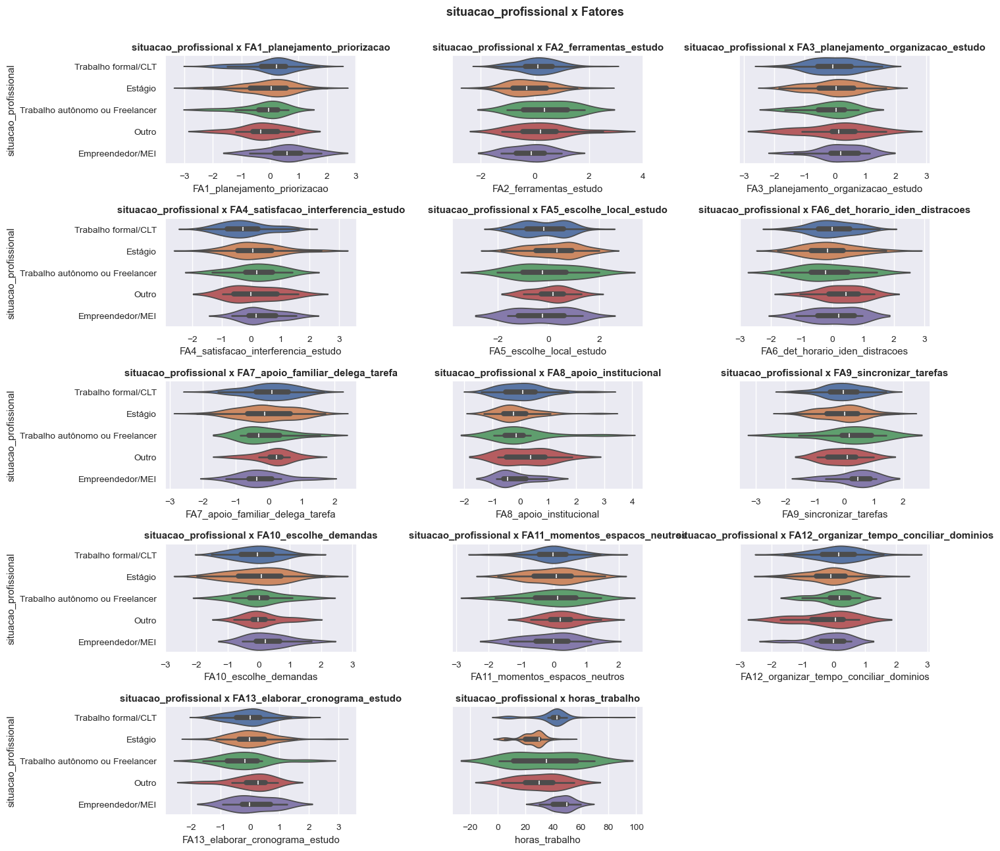

In [160]:
x_var = "situacao_profissional"

# Calcular o número de linhas necessárias
n_plots = len(factor_list)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

# Criar a figura com subplots e compartilhar eixos Y
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15), sharey=True)
axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle(f"{x_var} x Fatores", weight="bold", y=0.93)

# Iterar sobre os fatores e criar os gráficos
for i, t in enumerate(factor_list):
    ax = axes[i]  # Selecionar o eixo correspondente
    
    sns.violinplot(
        data=df_decodificado_cluster_kprototype,
        y=x_var,
        x=t,
        orient="h",
        ax=ax,
        hue = x_var
    )
    ax.set_title(f"{x_var} x {t}", weight="bold")

# Remover subplots vazios (caso o número de fatores não seja múltiplo de colunas)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar o layout para melhorar o espaçamento
plt.subplots_adjust(hspace=0.5, wspace=0.5)

# Salvar a figura
#plt.savefig(f"{x_var}_Fatores.svg", bbox_inches='tight')

plt.show()

In [161]:
resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
                                                'renda_familiar', 
                                                factor_list)

resultado_anova

,Fator,F-Estatística,Valor-p,Significativo
0,FA1_planejamento_priorizacao,0.415537,0.837726,False
1,FA2_ferramentas_estudo,0.514022,0.765552,False
2,FA3_planejamento_organizacao_estudo,0.351546,0.880955,False
3,FA4_satisfacao_interferencia_estudo,3.611497,0.003632,True
4,FA5_escolhe_local_estudo,1.500980,0.190281,False
5,FA6_det_horario_iden_distracoes,0.322822,0.898963,False
6,FA7_apoio_familiar_delega_tarefa,2.277065,0.047766,True
7,FA8_apoio_institucional,0.806121,0.546276,False
8,FA9_sincronizar_tarefas,0.626377,0.679800,False
9,FA10_escolhe_demandas,0.364895,0.872265,False


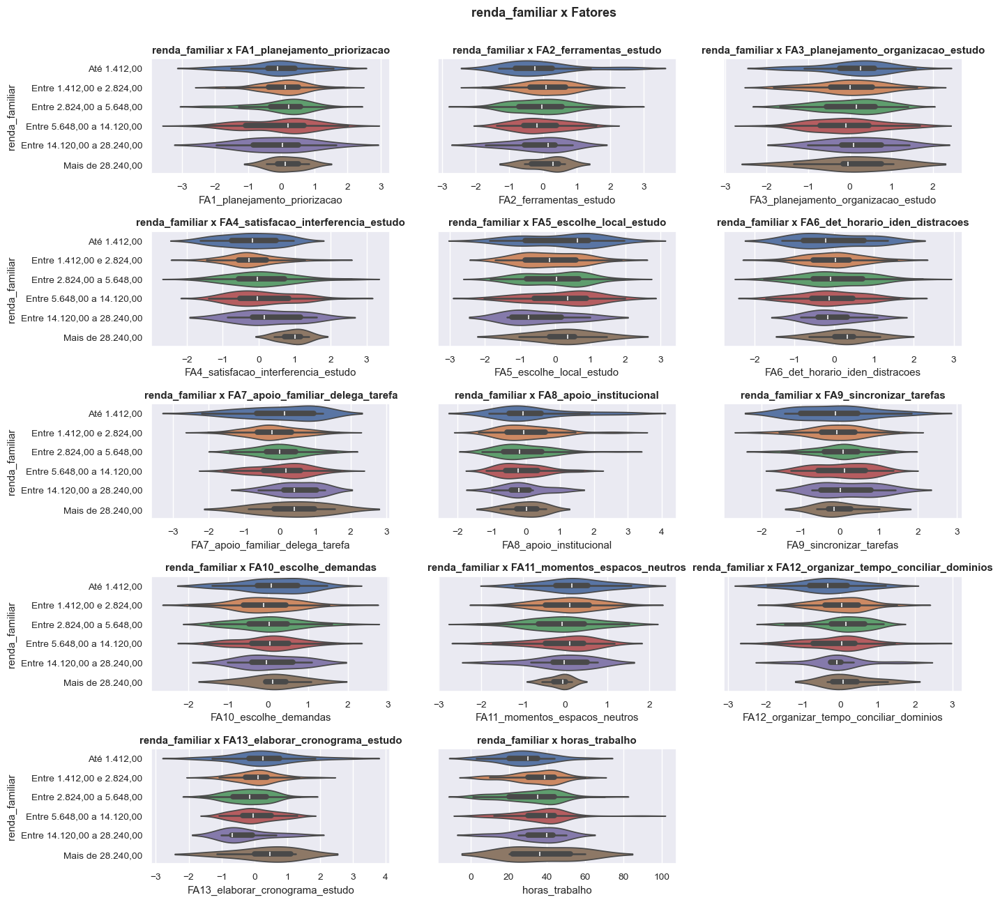

In [162]:
x_var = "renda_familiar"

# Calcular o número de linhas necessárias
n_plots = len(factor_list)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

# Criar a figura com subplots e compartilhar eixos Y
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15), sharey=True)
axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle(f"{x_var} x Fatores", weight="bold", y=0.93)

# Iterar sobre os fatores e criar os gráficos
for i, t in enumerate(factor_list):
    ax = axes[i]  # Selecionar o eixo correspondente
    
    sns.violinplot(
        data=df_decodificado_cluster_kprototype,
        y=x_var,
        x=t,
        orient="h",
        ax=ax,
        hue = x_var
    )
    ax.set_title(f"{x_var} x {t}", weight="bold")

# Remover subplots vazios (caso o número de fatores não seja múltiplo de colunas)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar o layout para melhorar o espaçamento
plt.subplots_adjust(hspace=0.5, wspace=0.2)

# Salvar a figura
#plt.savefig(f"{x_var}_Fatores.svg", bbox_inches='tight')

plt.show()


In [163]:
resultado_anova = executar_anova_var_categorica(df_decodificado_cluster_kprototype, 
                                                'horas_estudo', 
                                                factor_list)

resultado_anova


,Fator,F-Estatística,Valor-p,Significativo
0,FA1_planejamento_priorizacao,1.850957,0.138617,False
1,FA2_ferramentas_estudo,2.286289,0.079401,False
2,FA3_planejamento_organizacao_estudo,5.313078,0.001464,True
3,FA4_satisfacao_interferencia_estudo,0.906426,0.438618,False
4,FA5_escolhe_local_estudo,1.043053,0.374199,False
5,FA6_det_horario_iden_distracoes,1.018434,0.385170,False
6,FA7_apoio_familiar_delega_tarefa,0.034210,0.991497,False
7,FA8_apoio_institucional,1.400828,0.243235,False
8,FA9_sincronizar_tarefas,0.878741,0.452744,False
9,FA10_escolhe_demandas,2.827291,0.039286,True


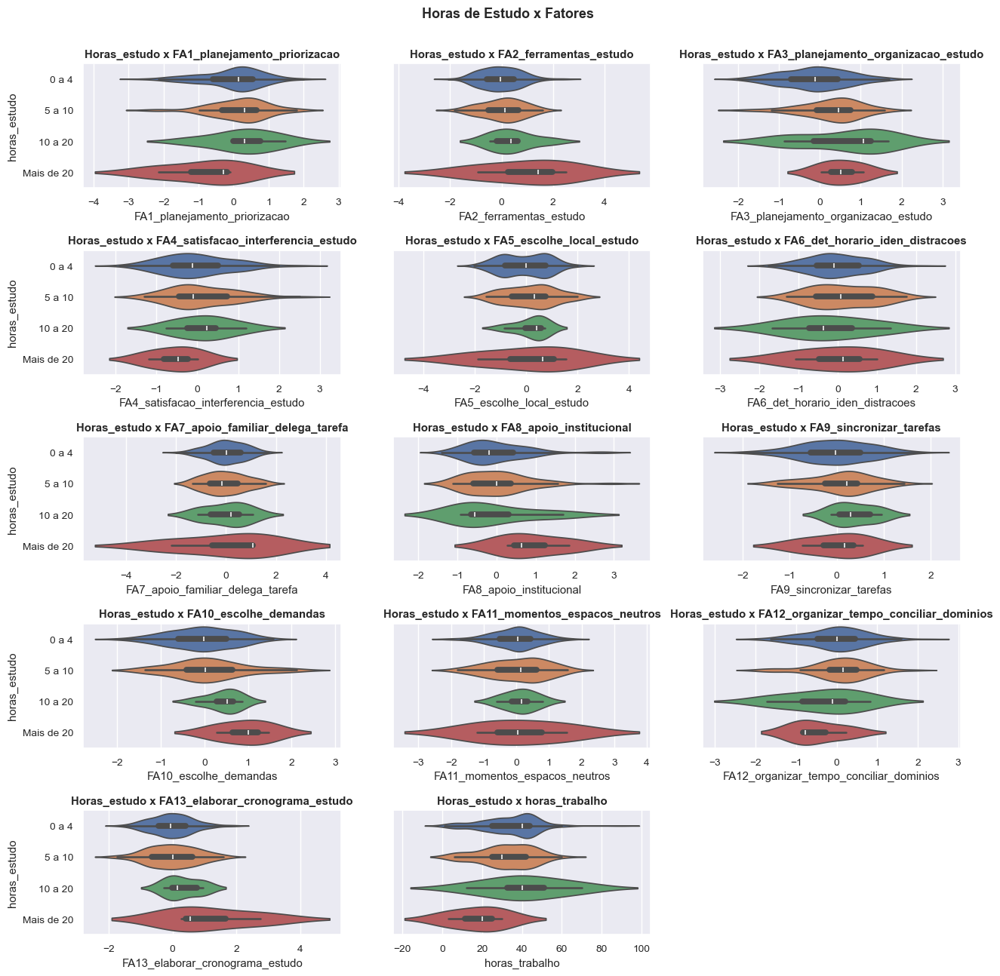

In [164]:
x_var = "horas_estudo"

# Calcular o número de linhas necessárias
n_plots = len(factor_list)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

# Criar a figura com subplots e compartilhar eixos Y
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15), sharey=True)
axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle("Horas de Estudo x Fatores", weight="bold", y=0.93)

# Iterar sobre os fatores e criar os gráficos
for i, t in enumerate(factor_list):
    ax = axes[i]  # Selecionar o eixo correspondente
    
    sns.violinplot(
        data=df_decodificado_cluster_kprototype,
        y=x_var,
        x=t,
        orient="h",
        ax=ax,
        hue = x_var
    )
    ax.set_title(f"Horas_estudo x {t}", weight="bold")

# Remover subplots vazios (caso o número de fatores não seja múltiplo de colunas)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar o layout para melhorar o espaçamento
plt.subplots_adjust(hspace=0.5, wspace=0.2)

# Salvar a figura
plt.savefig("Horas_Estudo_Fatores.svg", bbox_inches='tight')

plt.show()


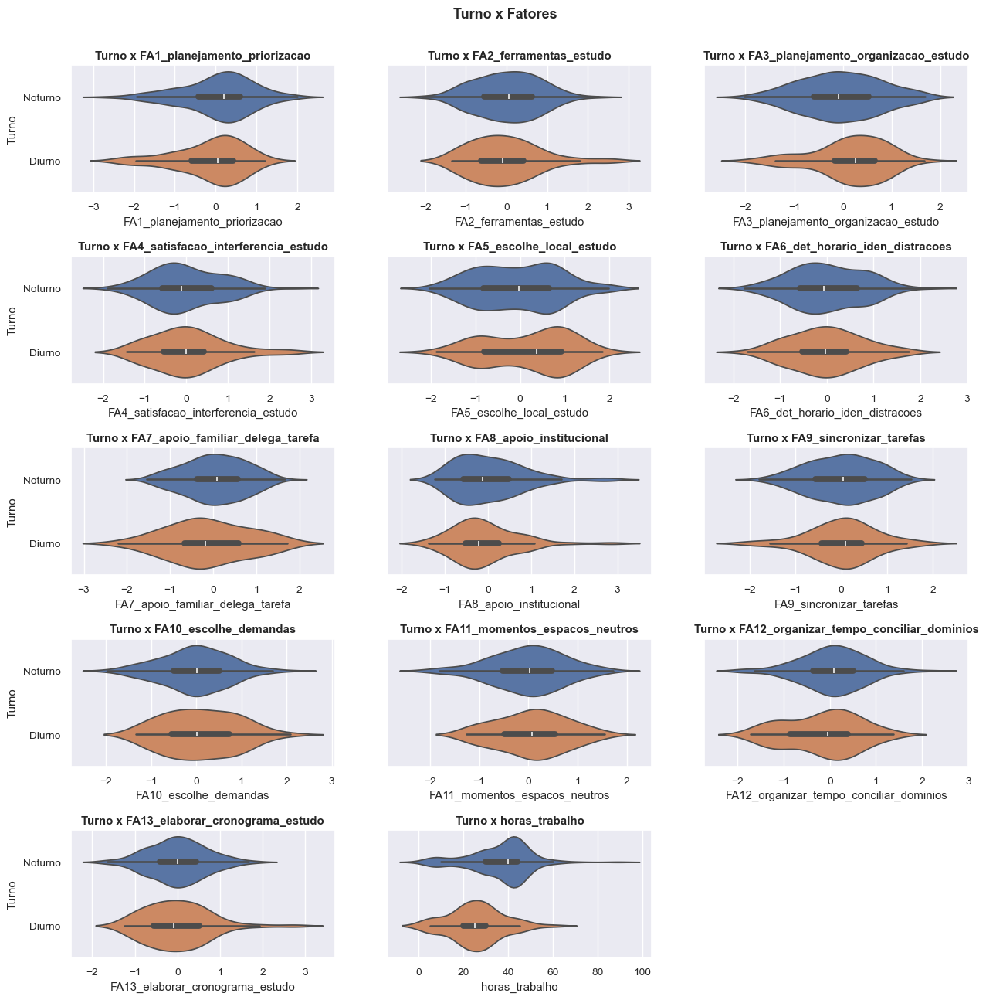

In [165]:
x_var = "Turno"

# Calcular o número de linhas necessárias
n_plots = len(factor_list)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

# Criar a figura com subplots e compartilhar eixos Y
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15), sharey=True)
axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle("Turno x Fatores", weight="bold", y=0.93)

# Iterar sobre os fatores e criar os gráficos
for i, t in enumerate(factor_list):
    ax = axes[i]  # Selecionar o eixo correspondente
    
    sns.violinplot(
        data=df_decodificado_cluster_kprototype,
        y=x_var,
        x=t,
        orient="h",
        ax=ax,
        hue = x_var
    )
    ax.set_title(f"Turno x {t}", weight="bold")

# Remover subplots vazios (caso o número de fatores não seja múltiplo de colunas)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar o layout para melhorar o espaçamento
plt.subplots_adjust(hspace=0.5, wspace=0.2)

# Salvar a figura
plt.savefig("Turno_Fatores.svg", bbox_inches='tight')

plt.show()


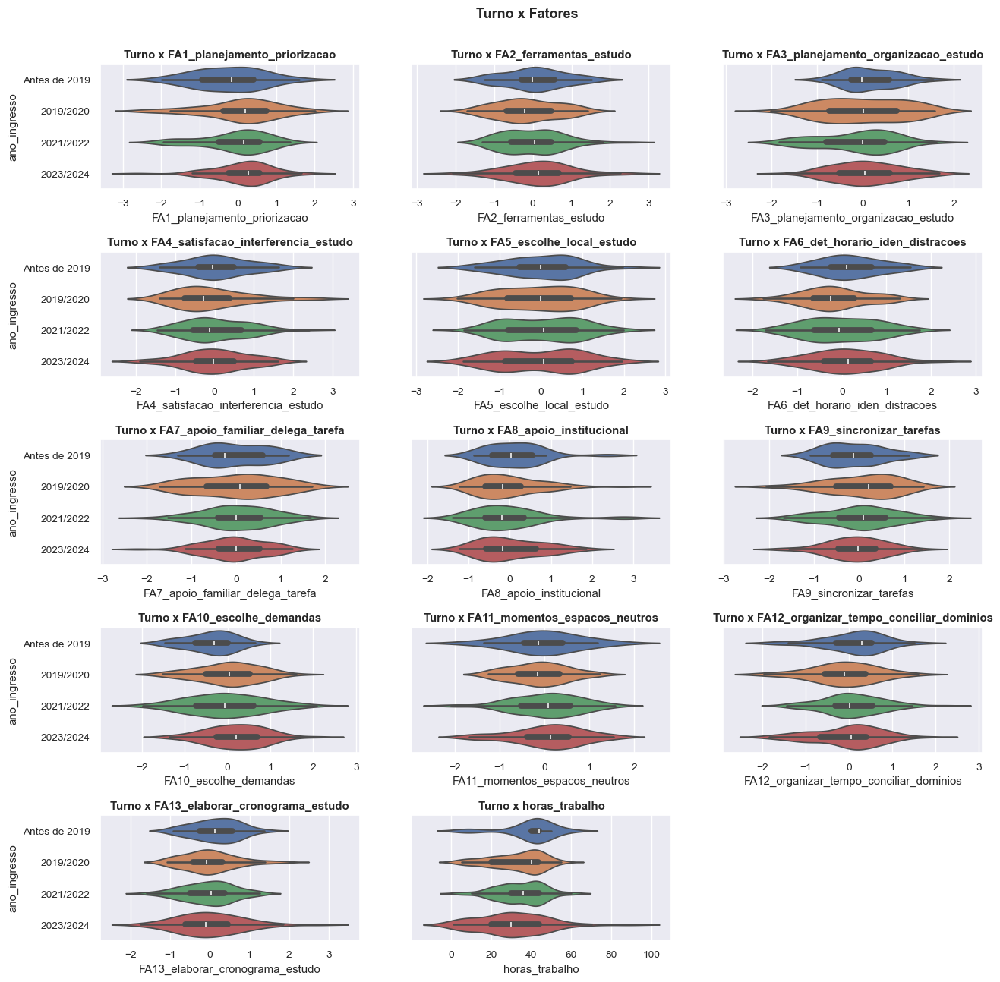

In [166]:
x_var = "ano_ingresso"

# Calcular o número de linhas necessárias
n_plots = len(factor_list)
n_cols = 3
n_rows = (n_plots + n_cols - 1) // n_cols

# Criar a figura com subplots e compartilhar eixos Y
fig, axes = plt.subplots(n_rows, n_cols, figsize=(15, 15), sharey=True)
axes = axes.flatten()  # Achatar os eixos para acesso por índice
plt.suptitle("Turno x Fatores", weight="bold", y=0.93)

# Iterar sobre os fatores e criar os gráficos
for i, t in enumerate(factor_list):
    ax = axes[i]  # Selecionar o eixo correspondente
    
    sns.violinplot(
        data=df_decodificado_cluster_kprototype,
        y=x_var,
        x=t,
        orient="h",
        ax=ax,
        hue = x_var
    )
    ax.set_title(f"Turno x {t}", weight="bold")

# Remover subplots vazios (caso o número de fatores não seja múltiplo de colunas)
for j in range(i + 1, len(axes)):
    fig.delaxes(axes[j])

# Ajustar o layout para melhorar o espaçamento
plt.subplots_adjust(hspace=0.5, wspace=0.2)

# Salvar a figura
plt.savefig("Turno_Fatores.svg", bbox_inches='tight')

plt.show()


# Análise Descritiva Básica

Serão explorados os dados sociodemográficos, econômico e tais.

## Tabelas de Frequência

#### Demográfica


In [169]:
# Frequência e proporção de Intervalos de Idade - Parte 1

idade_intervalo = pd.cut(
    df["Idade"],
    bins=np.arange(18, df.Idade.max() + 3, 3),
    include_lowest=True,
    right=False,
)
print(idade_intervalo.count())
freq_idade = pd.concat(
    [
        idade_intervalo.value_counts(sort=False),
        round(idade_intervalo.value_counts(sort=False, normalize=True), 4),
    ],
    axis=1,
)

freq_idade

240


,count,proportion
Idade,,
"[18.0, 21.0)",41,0.1708
"[21.0, 24.0)",83,0.3458
"[24.0, 27.0)",46,0.1917
"[27.0, 30.0)",31,0.1292
"[30.0, 33.0)",7,0.0292
"[33.0, 36.0)",6,0.0250
"[36.0, 39.0)",6,0.0250
"[39.0, 42.0)",8,0.0333
"[42.0, 45.0)",3,0.0125


In [170]:
# Frequência e proporção de Intervalos de Idade - Parte 2

idade_intervalo = pd.cut(
    df["Idade"], bins=[18.0, 23.0, 28.0, 38.0, np.inf], include_lowest=True, right=False
)
print(idade_intervalo.count())
freq_idade = pd.concat(
    [
        idade_intervalo.value_counts(sort=False),
        round(idade_intervalo.value_counts(sort=False, normalize=True), 4),
    ],
    axis=1,
)

freq_idade

240


,count,proportion
Idade,,
"[18.0, 23.0)",104,0.4333
"[23.0, 28.0)",80,0.3333
"[28.0, 38.0)",34,0.1417
"[38.0, inf)",22,0.0917


In [171]:
# Frequência e Proporção de Gênero
distribuicao_gênero = pd.concat(
    [df["Gênero"].value_counts(), round(df["Gênero"].value_counts(normalize=True), 4)],
    axis=1,
)

distribuicao_gênero

,count,proportion
Gênero,,
Mulher Cis,152,0.6307
Homem Cis,86,0.3568
Homem Trans,2,0.0083
Não Binário/Outro,1,0.0041


In [172]:
# Tabela de frequência de GÊNERO X IDADE
round(pd.crosstab(idade_intervalo, df["Gênero"], normalize=True, margins=True) * 100, 2)

Gênero,Homem Cis,Homem Trans,Mulher Cis,Não Binário/Outro,All
Idade,,,,,
"[18.0, 23.0)",11.67,0.00,31.67,0.00,43.33
"[23.0, 28.0)",13.33,0.83,19.17,0.00,33.33
"[28.0, 38.0)",7.08,0.00,6.67,0.42,14.17
"[38.0, inf)",3.75,0.00,5.42,0.00,9.17
All,35.83,0.83,62.92,0.42,100.00


In [173]:
# Frequência e Proporção de estado_civil

distribuicao_estado_civil = pd.concat(
    [
        df["estado_civil"].value_counts(),
        round(df["estado_civil"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

distribuicao_estado_civil

,count,proportion
estado_civil,,
Solteiro,191,0.8025
União estável/ Casado,42,0.1765
Separado/ Divorciado,3,0.0126
Outro,2,0.0084


In [174]:
# estado_civil x Gênero

round(
    pd.crosstab(df["estado_civil"], df["Gênero"], normalize=True, margins=True) * 100, 2
)

Gênero,Homem Cis,Homem Trans,Mulher Cis,Não Binário/Outro,All
estado_civil,,,,,
Outro,0.00,0.00,0.84,0.00,0.84
Separado/ Divorciado,0.42,0.00,0.84,0.00,1.26
Solteiro,28.57,0.84,50.42,0.42,80.25
União estável/ Casado,6.72,0.00,10.92,0.00,17.65
All,35.71,0.84,63.03,0.42,100.00


In [175]:
# Frequência e distribuição de renda

pd.concat(
    [
        df["renda_familiar"].value_counts(),
        round(df["renda_familiar"].value_counts(normalize=True) * 100, 2),
    ],
    axis=1,
)

,count,proportion
renda_familiar,,
"Entre 1.412,00 e 2.824,00",72,30.38
"Entre 2.824,00 a 5.648,00",71,29.96
"Entre 5.648,00 a 14.120,00",56,23.63
"Até 1.412,00",23,9.70
"Entre 14.120,00 a 28.240,00",9,3.80
"Mais de 28.240,00",6,2.53


In [176]:
# Renda x Gênero

round(
    pd.crosstab(df["renda_familiar"], df["Gênero"], normalize=True, margins=True) * 100,
    2,
)

Gênero,Homem Cis,Homem Trans,Mulher Cis,Não Binário/Outro,All
renda_familiar,,,,,
"Até 1.412,00",2.53,0.00,7.17,0.00,9.70
"Entre 1.412,00 e 2.824,00",8.86,0.00,21.10,0.42,30.38
"Entre 2.824,00 a 5.648,00",10.55,0.42,18.99,0.00,29.96
"Entre 5.648,00 a 14.120,00",9.70,0.00,13.92,0.00,23.63
"Entre 14.120,00 a 28.240,00",2.11,0.42,1.27,0.00,3.80
"Mais de 28.240,00",2.11,0.00,0.42,0.00,2.53
All,35.86,0.84,62.87,0.42,100.00


In [177]:
# Distribuição de frequência de Cor e Etnia

pd.concat(
    [
        df["Cor_Etnia"].value_counts(),
        round(df["Cor_Etnia"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
Cor_Etnia,,
Branco,122,0.5062
Pardo,92,0.3817
Negro,25,0.1037
Amarelo ou de Origem Oriental,2,0.0083


In [178]:
# Crosstab entre Cor_Etnia e Gênero

round(pd.crosstab(df["Cor_Etnia"], df["Gênero"], normalize=True, margins=True) * 100, 2)

Gênero,Homem Cis,Homem Trans,Mulher Cis,Não Binário/Outro,All
Cor_Etnia,,,,,
Amarelo ou de Origem Oriental,0.00,0.00,0.83,0.00,0.83
Branco,19.50,0.83,30.29,0.00,50.62
Negro,4.15,0.00,6.22,0.00,10.37
Pardo,12.03,0.00,25.73,0.41,38.17
All,35.68,0.83,63.07,0.41,100.00


#### Acadêmico


In [179]:
# Distribuição de frequência de Tipo de IES


pd.concat(
    [
        df["tipo_IES"].value_counts(),
        round(df["tipo_IES"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
tipo_IES,,
Pública,196,0.8167
Privada,44,0.1833


In [180]:
# Distribuição de frequência de ano de ingresso


pd.concat(
    [
        df["ano_ingresso"].value_counts(sort=False, dropna=False),
        round(df["ano_ingresso"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
ano_ingresso,,
Antes de 2019,27,0.1120
2019/2020,62,0.2573
2021/2022,87,0.3610
2023/2024,65,0.2697


In [181]:
# Distribuição de Frequência de turno

pd.concat(
    [
        df["Turno"].value_counts(sort=False, dropna=False),
        round(df["Turno"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
Turno,,
Diurno,61,0.2531
Noturno,180,0.7469


In [182]:
# Distribuição de Frequência de modalidade do curso

pd.concat(
    [
        df["modalidade_curso"].value_counts(sort=False, dropna=False),
        round(df["modalidade_curso"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
modalidade_curso,,
Híbrida,13,0.0542
Presencial,225,0.9375
Remota,2,0.0083
NaN,1,NaN


In [183]:
# Forma de Ingresso

pd.concat(
    [
        df["forma_ingresso"].value_counts(sort=False, dropna=False),
        round(df["forma_ingresso"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
forma_ingresso,,
Ampla Concorrência,149,0.6287
Cota,88,0.3713
NaN,4,NaN


In [184]:
# horas de estudo

pd.concat(
    [
        df["horas_estudo"].value_counts(sort=False, dropna=False),
        round(df["horas_estudo"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
horas_estudo,,
0 a 4,178,0.7417
5 a 10,53,0.2208
10 a 20,6,0.0250
Mais de 20,3,0.0125
NaN,1,NaN


#### Dados socioeconômico



In [185]:
# Situação profissional

pd.concat(
    [
        df["situacao_profissional"].value_counts(sort=False, dropna=False),
        round(df["situacao_profissional"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
situacao_profissional,,
Empreendedor/MEI,13,0.0542
Estágio,87,0.3625
Outro,12,0.0500
Trabalho autônomo ou Freelancer,14,0.0583
Trabalho formal/CLT,114,0.4750
NaN,1,NaN


In [186]:
# Tempo de Experiência

pd.concat(
    [
        df["exp_profissional"].value_counts(sort=False, dropna=False),
        round(df["exp_profissional"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
exp_profissional,,
Menos de 6 meses,22,0.0913
6 meses a 1 ano,18,0.0747
1 ano a 2 anos,45,0.1867
Mais de 2 anos,156,0.6473


In [187]:
# Modalidade de profissão

pd.concat(
    [
        df["forma_atividade"].value_counts(sort=False, dropna=False),
        round(df["forma_atividade"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
forma_atividade,,
Híbrida,34,0.1411
Presencial,200,0.8299
Remota ou Home office,7,0.0290


In [188]:
# Renda familiar

pd.concat(
    [
        df["renda_familiar"].value_counts(sort=False, dropna=False),
        round(df["renda_familiar"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
renda_familiar,,
"Até 1.412,00",23,0.0970
"Entre 1.412,00 e 2.824,00",72,0.3038
"Entre 2.824,00 a 5.648,00",71,0.2996
"Entre 5.648,00 a 14.120,00",56,0.2363
"Entre 14.120,00 a 28.240,00",9,0.0380
"Mais de 28.240,00",6,0.0253
NaN,4,NaN


In [189]:
# Tempo total de deslocamento diário

pd.concat(
    [
        df["tempo_deslocamento"].value_counts(sort=False, dropna=False),
        round(df["tempo_deslocamento"].value_counts(normalize=True), 4),
    ],
    axis=1,
)

,count,proportion
tempo_deslocamento,,
Menos de 1 horas,83,0.3458
Entre 1 a 2 horas,86,0.3583
Entre 2 a 4 horas,54,0.2250
Entre 4 a 6 horas,15,0.0625
Mais de 6 horas,2,0.0083
NaN,1,NaN


In [190]:
# Frequência e proporção de Intervalos de Horas de trabalho

horas_trabalho_intervalo = pd.cut(
    df["horas_trabalho"],
    bins=np.arange(0, df.horas_trabalho.max() + 3, 10),
    include_lowest=False,
    right=False,
)
print(horas_trabalho_intervalo.count())
freq_horas_trabalho = pd.concat(
    [
        horas_trabalho_intervalo.value_counts(sort=False),
        round(horas_trabalho_intervalo.value_counts(sort=False, normalize=True), 4),
    ],
    axis=1,
)

freq_horas_trabalho

239


,count,proportion
horas_trabalho,,
"[0.0, 10.0)",22,0.0921
"[10.0, 20.0)",6,0.0251
"[20.0, 30.0)",38,0.1590
"[30.0, 40.0)",56,0.2343
"[40.0, 50.0)",97,0.4059
"[50.0, 60.0)",12,0.0502
"[60.0, 70.0)",6,0.0251
"[70.0, 80.0)",1,0.0042
"[80.0, 90.0)",1,0.0042


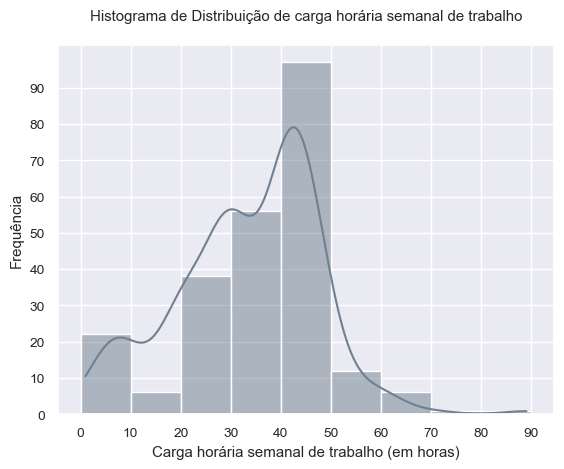

In [209]:
# Histograma de Distribuição de Jornada Semanal de Trabalho


sns.histplot(
    x=df["horas_trabalho"], color="slategrey", kde=True, bins=np.arange(0, 100, 10)
)
plt.ylabel("Frequência")
plt.xlabel("Carga horária semanal de trabalho (em horas)")
plt.xticks(np.arange(0, 100, step=10))
plt.yticks(np.arange(0, 100, step=10))

plt.title("Histograma de Distribuição de carga horária semanal de trabalho\n")

"""
plt.savefig("Horas_trabalho_histograma.svg",
            bbox_inches='tight')
"""

plt.show()

## Dados numéricos (Idade e Horas de Trabalho)

In [207]:
# Média, mediana e moda

print(
    "Média\nIdade:",
    df["Idade"].mean(),
    "\nhoras_trabalho:",
    df["horas_trabalho"].mean(),
    "\n\nMediana\nIdade:",
    df["Idade"].median(),
    "\nhoras_trabalho:",
    df["horas_trabalho"].median(),
    "\n\nModa\nIdade:",
    df["Idade"].mode(),
    "\nhoras_trabalho:",
    df["horas_trabalho"].mode(),
)

Média
Idade: 25.554166666666667 
horas_trabalho: 33.44351464435147 

Mediana
Idade: 23.0 
horas_trabalho: 36.0 

Moda
Idade: 0    22.0
Name: Idade, dtype: float64 
horas_trabalho: 0    30.0
Name: horas_trabalho, dtype: float64


In [194]:
# Amplitude Interquartil (IQR)
iqr_idade = np.percentile(df["Idade"].dropna(), 75) - np.percentile(
    df["Idade"].dropna(), 25
)
iqr_horas_trabalho = np.percentile(df["horas_trabalho"], 75) - np.percentile(
    df["horas_trabalho"], 25
)


print(
    "Amplitude Interquartil\nIdade:", iqr_idade, "\nhoras_trabalho:", iqr_horas_trabalho
)

Amplitude Interquartil
Idade: 6.0 
horas_trabalho: nan


In [195]:
# Assimetria (skewness) e curtose (kurtosis) para Idade e Carga horária

print(
    "Assimetria\nIdade:",
    df["Idade"].skew(),
    "\nhoras_trabalho:",
    df["horas_trabalho"].skew(),
    "\n\nCurtose\nIdade:",
    df["Idade"].kurtosis(),
    "\nhoras_trabalho:",
    df["horas_trabalho"].kurtosis(),
)

Assimetria
Idade: 2.119836042613197 
horas_trabalho: -0.16020747952154424 

Curtose
Idade: 5.32551642748748 
horas_trabalho: 0.4599897667384125


In [196]:
# Calcular a matriz de correlação
correlacao = df[["Idade", "horas_trabalho"]].corr()

print(correlacao)
# Visualizar a matriz de correlação com um heatmap
# plt.figure(figsize=(8, 6))
# sns.heatmap(correlacao, annot=True, cmap='coolwarm', fmt=".2f")
# plt.title('Matriz de Correlação entre Idade e Horas de Trabalho')
# plt.show()

                   Idade  horas_trabalho
Idade           1.000000        0.136704
horas_trabalho  0.136704        1.000000


## Tabulação/Cruzamento de variáveis


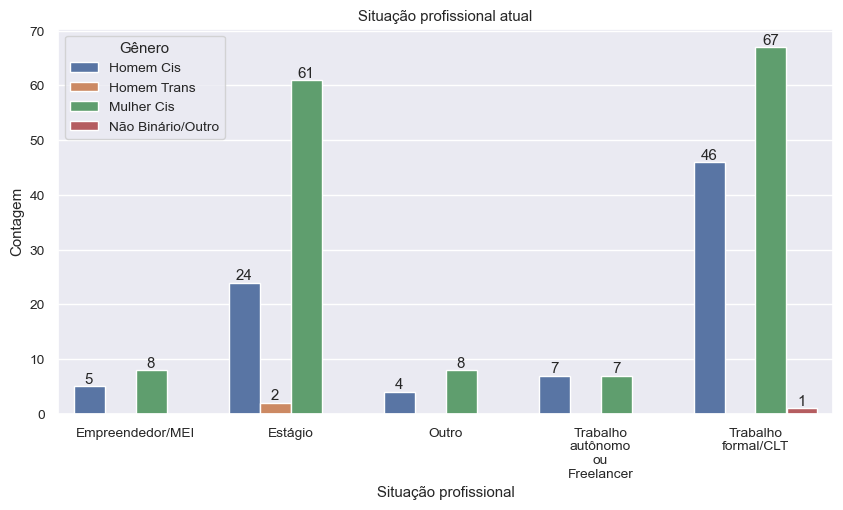

In [197]:
# Situação Profissional Atual cruzado com Gênero


fig, ax = plt.subplots(figsize=(10, 5))
sns.countplot(x=df["situacao_profissional"].dropna(), hue=df["Gênero"].dropna())
plt.title("Situação profissional atual")
plt.xlabel("Situação profissional")
plt.ylabel("Contagem")
wrap_xlabels(ax, 10)

# Inserindo o rótulo de dados
for p in ax.patches:
    count_int = int(p.get_height())
    if count_int > 0:
        ax.annotate(
            f"{count_int}",
            (p.get_x() + p.get_width() / 2.0, count_int),
            ha="center",
            va="bottom",
        )

plt.show()

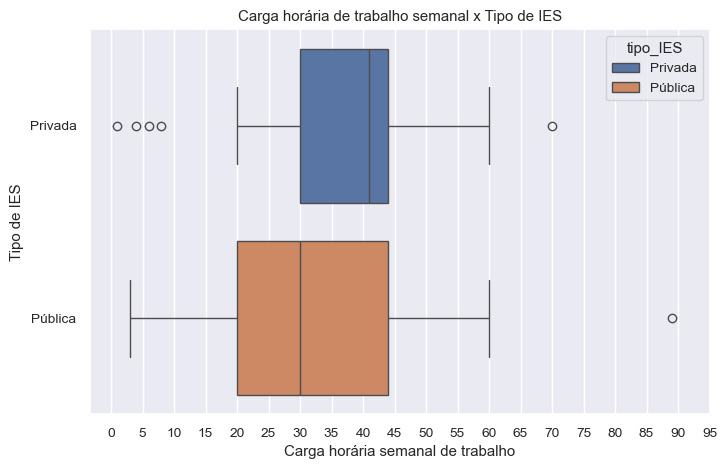

In [198]:
# Box plot da Jornada semanal de trabalho x Tipo de IES (Com valores atípicos)

fig, ax = plt.subplots(figsize=(8, 5))

sns.boxplot(x=df["horas_trabalho"], y=df["tipo_IES"], hue=df["tipo_IES"])
plt.title("Carga horária de trabalho semanal x Tipo de IES")
plt.ylabel("Tipo de IES")
plt.xlabel("Carga horária semanal de trabalho")
plt.xticks(np.arange(0, 100, step=5))

plt.show()

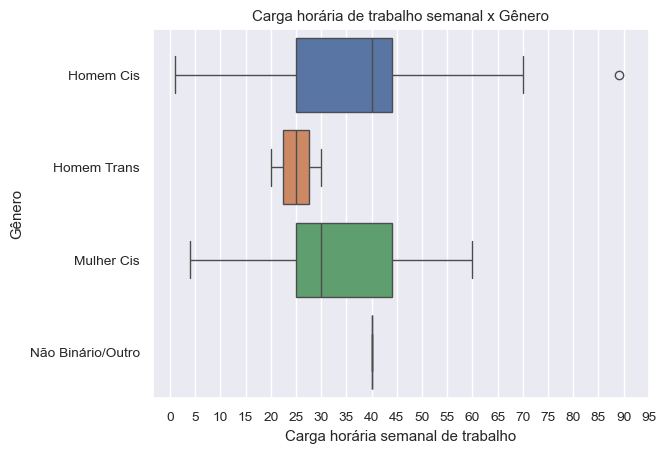

In [199]:
# Box plot da Jornada semanal de trabalho x Gênero
remocao_valor_atipico = df[df["horas_trabalho"] < 150]

sns.boxplot(
    x=remocao_valor_atipico["horas_trabalho"],
    y=remocao_valor_atipico["Gênero"],
    hue=remocao_valor_atipico["Gênero"],
)
plt.title("Carga horária de trabalho semanal x Gênero")
plt.ylabel("Gênero")
plt.xlabel("Carga horária semanal de trabalho")
plt.xticks(np.arange(0, 100, step=5))

plt.show()

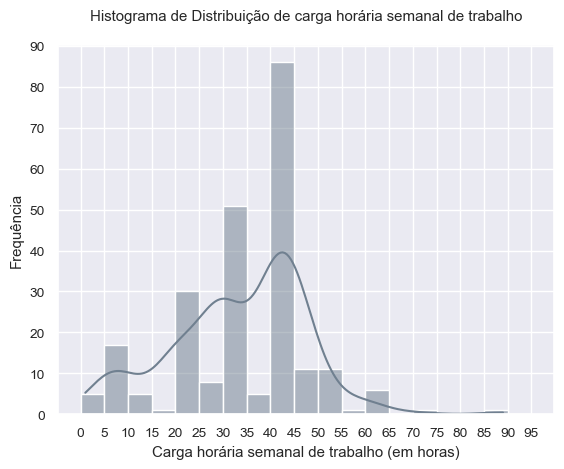

In [200]:
# Histograma de Distribuição de Jornada Semanal de Trabalho
remocao_valor_atipico = df[df["horas_trabalho"] < 150]

sns.histplot(
    x=df["horas_trabalho"], color="slategrey", kde=True, bins=np.arange(0, 100, 5)
)
plt.ylabel("Frequência")
plt.xlabel("Carga horária semanal de trabalho (em horas)")
plt.xticks(np.arange(0, 100, step=5))
plt.yticks(np.arange(0, 100, step=10))

plt.title("Histograma de Distribuição de carga horária semanal de trabalho\n")

"""
plt.savefig("Horas_trabalho_histograma.svg",
            bbox_inches='tight')
"""

plt.show()

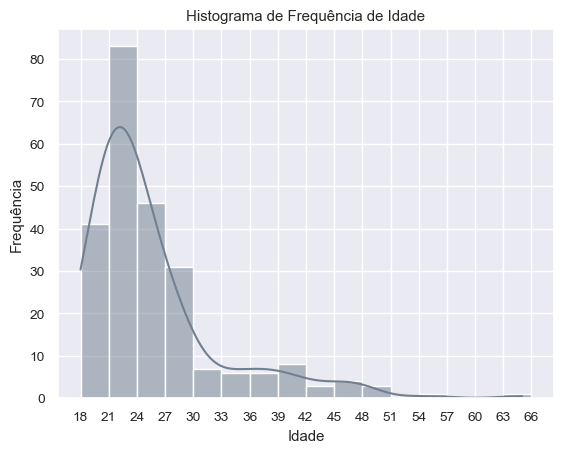

In [201]:
# Fazendo Histograma de Idade

sns.histplot(
    x=df["Idade"],
    color="slategrey",
    kde=True,
    bins=np.arange(18, df.Idade.max() + 3, 3),
)
plt.ylabel("Frequência")
plt.title("Histograma de Frequência de Idade")

plt.xticks(np.arange(18, df.Idade.max() + 3, 3))

plt.savefig("Idade_histograma.svg", bbox_inches="tight")

plt.show()

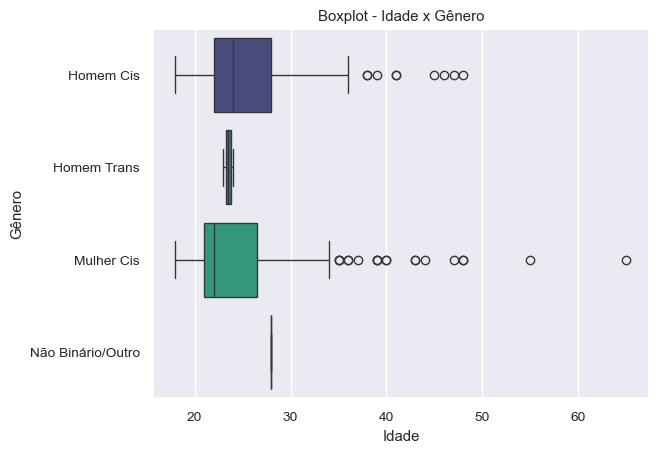

In [202]:
# Fazendo os boxplots de Idade x Gênero

sns.boxplot(x=df["Idade"], y=df["Gênero"], palette="viridis").set_title(
    "Boxplot - Idade x Gênero"
)


plt.show()

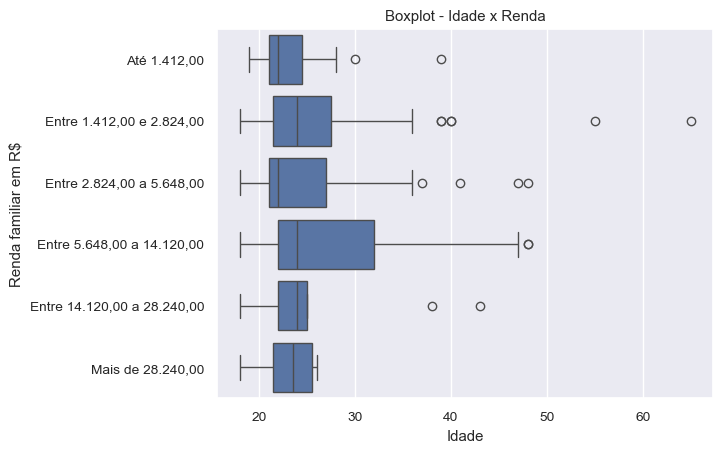

In [203]:
# Fazendo os boxplots de Idade x Renda
sns.boxplot(x=df["Idade"], y=df["renda_familiar"]).set_title("Boxplot - Idade x Renda")

plt.ylabel("Renda familiar em R$")

plt.show()

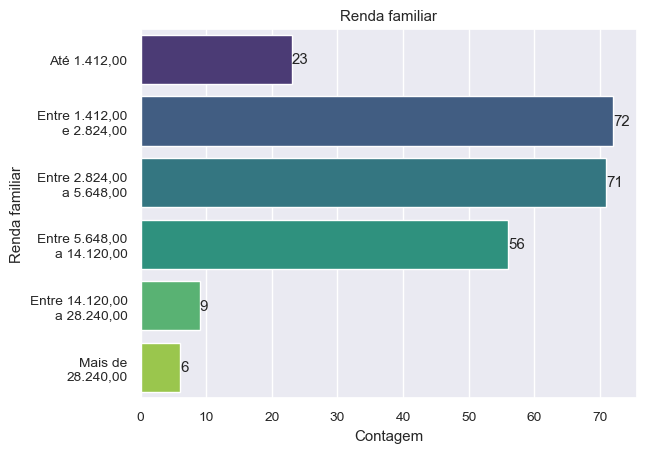

In [208]:
# Gráfico de Renda familiar
# Configurando a figura
fig, ax = plt.subplots()

# Gráfico de barras horizontal
sns.countplot(
    y="renda_familiar",  # Gera gráfico de barras horizontal (mude para 'x' para barras verticais)
    data=df.dropna(subset=["renda_familiar"]),  # Filtra valores nulos
    palette="viridis",
    ax=ax,
)

# Adicionando rótulos
for container in ax.containers:
    ax.bar_label(container)

# Ajuste dos rótulos no eixo x
ax.set_xlabel("Contagem")
ax.set_ylabel("Renda familiar")
ax.set_title("Renda familiar")
wrap_ylabels(ax, 15)


plt.show()

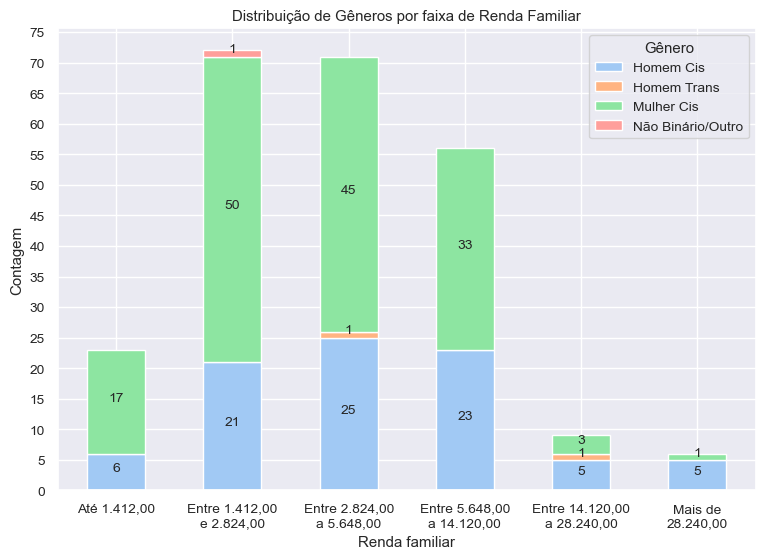

In [205]:
# Gráfico de Renda x Gênero (verificar se há diferença entre gêneros na renda)

# Cria uma tabela cruzada entre renda familiar e gênero
renda_familia_genero_tab = pd.crosstab(df["renda_familiar"], df["Gênero"])

# Define uma paleta de cores pastel para o gráfico
colors = sns.color_palette("pastel", len(renda_familia_genero_tab))

# Plota um gráfico de barras empilhadas com a tabela cruzada
ax = renda_familia_genero_tab.plot(
    kind="bar", stacked=True, color=colors, figsize=(9, 6)
)

# Ajusta os rótulos do eixo x para que não fiquem sobrepostos
wrap_xlabels(ax, 15)

# Ajeitando os ticks
plt.xticks(rotation=360)
plt.yticks(ticks=np.arange(0, 80, 5))

# Define os rótulos e título
plt.xlabel("Renda familiar")
plt.ylabel("Contagem")
plt.title("Distribuição de Gêneros por faixa de Renda Familiar")

# Adiciona rótulos às barras do gráfico
for container in ax.containers:
    ax.bar_label(
        container,
        labels=[f"{v:.0f}" if v > 0 else "" for v in container.datavalues],
        label_type="center",
        fontsize=10,
        padding=3,
    )

plt.show()

# Exportar os dados

In [206]:
# Exportando o DF finalizado para análise qualitativa

df_final = pd.concat([df_decodificado_cluster_kprototype,
                     df[['dificuldades_academicas_profissionais',
                                      'estrategias_gestao_tempo',
                                      'tecnicas_distracoes_estudo']]],
                    axis = 1)

df_final.to_csv('df_final.csv',
                sep = ";",
                encoding='utf-8')